#basic imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set_theme()
import os
import networkx as nx


In [2]:
from sklearn.metrics import adjusted_rand_score
from scipy.cluster.hierarchy import fcluster, linkage, dendrogram

In [3]:
import math
import numpy as np
import pandas as pd

import datashader as ds
import datashader.transfer_functions as tf
from datashader.layout import random_layout, circular_layout, forceatlas2_layout
from datashader.bundling import connect_edges, hammer_bundle

from itertools import chain


In [4]:
from umap import UMAP,plot

In [5]:
from sklearn.manifold import MDS

In [6]:
mdist = np.load('mdist.npy') # full distance matrix

In [7]:
print('The distance matrix has',mdist.shape[0],'rows and',mdist.shape[1],'columns')
print('The minimum value is:', mdist.min(),'and the maximum value is:', mdist.max())
print('The median is',np.median(mdist),'and the standard deviation is:',mdist.std())

The distance matrix has 3024 rows and 3024 columns
The minimum value is: 0.0 and the maximum value is: 0.9920769162289682
The median is 0.24765571678684828 and the standard deviation is: 0.04692066263883729


In [8]:
if os.path.exists("mdist-mds.npy"):
    mdist_mds = np.load('mdist-mds.npy')
    print(mdist_mds.shape,'data loaded')
else:
    %time
    mds_embed = MDS(n_components=3, random_state=42, dissimilarity='precomputed')
    %time
    mdist_mds = mds_embed.fit_transform(mdist)
    np.save('mdist-mds.npy', mdist_mds)
    print(mdist_mds.shape,'data computed and saved')


(3024, 3) data loaded


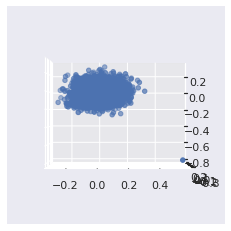

In [9]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(mdist_mds[:,0],mdist_mds[:,1],mdist_mds[:,2])
ax.view_init(azim=270,elev=0)
plt.show()

In [10]:

cmdist = np.load('cmdist.npy') #condensed distance matrix

In [11]:
print(cmdist)
print('shape:',cmdist.shape)
print('min:', cmdist.min())
print('max:', cmdist.max())
print('mean',cmdist.mean())
print('median:',np.median(cmdist))
print('standard deviation:',cmdist.std())
print('variance:',cmdist.var())

[0.10120478 0.1504743  0.07490331 ... 0.26403602 0.26982255 0.2361346 ]
shape: (4570776,)
min: 0.017530193774295974
max: 0.9920769162289682
mean 0.24370676788986748
median: 0.24766808114978683
standard deviation: 0.046718693368125
variance: 0.0021826363100248872


In [12]:
import gudhi
rips_complex = gudhi.RipsComplex(distance_matrix=mdist,
                                 max_edge_length=0.09)

simplex_tree = rips_complex.create_simplex_tree(max_dimension=2)
result_str = 'Rips complex is of dimension ' + repr(simplex_tree.dimension()) + ' - ' + \
    repr(simplex_tree.num_simplices()) + ' simplices - ' + \
    repr(simplex_tree.num_vertices()) + ' vertices.'
print(result_str)
fmt = '%s -> %.8f'
for filtered_value in simplex_tree.get_filtration():
    print(fmt % tuple(filtered_value))

Rips complex is of dimension 2 - 280524 simplices - 3024 vertices.
[0] -> 0.00000000
[1] -> 0.00000000
[2] -> 0.00000000
[3] -> 0.00000000
[4] -> 0.00000000
[5] -> 0.00000000
[6] -> 0.00000000
[7] -> 0.00000000
[8] -> 0.00000000
[9] -> 0.00000000
[10] -> 0.00000000
[11] -> 0.00000000
[12] -> 0.00000000
[13] -> 0.00000000
[14] -> 0.00000000
[15] -> 0.00000000
[16] -> 0.00000000
[17] -> 0.00000000
[18] -> 0.00000000
[19] -> 0.00000000
[20] -> 0.00000000
[21] -> 0.00000000
[22] -> 0.00000000
[23] -> 0.00000000
[24] -> 0.00000000
[25] -> 0.00000000
[26] -> 0.00000000
[27] -> 0.00000000
[28] -> 0.00000000
[29] -> 0.00000000
[30] -> 0.00000000
[31] -> 0.00000000
[32] -> 0.00000000
[33] -> 0.00000000
[34] -> 0.00000000
[35] -> 0.00000000
[36] -> 0.00000000
[37] -> 0.00000000
[38] -> 0.00000000
[39] -> 0.00000000
[40] -> 0.00000000
[41] -> 0.00000000
[42] -> 0.00000000
[43] -> 0.00000000
[44] -> 0.00000000
[45] -> 0.00000000
[46] -> 0.00000000
[47] -> 0.00000000
[48] -> 0.00000000
[49] -> 0.00

[1690] -> 0.00000000
[1691] -> 0.00000000
[1692] -> 0.00000000
[1693] -> 0.00000000
[1694] -> 0.00000000
[1695] -> 0.00000000
[1696] -> 0.00000000
[1697] -> 0.00000000
[1698] -> 0.00000000
[1699] -> 0.00000000
[1700] -> 0.00000000
[1701] -> 0.00000000
[1702] -> 0.00000000
[1703] -> 0.00000000
[1704] -> 0.00000000
[1705] -> 0.00000000
[1706] -> 0.00000000
[1707] -> 0.00000000
[1708] -> 0.00000000
[1709] -> 0.00000000
[1710] -> 0.00000000
[1711] -> 0.00000000
[1712] -> 0.00000000
[1713] -> 0.00000000
[1714] -> 0.00000000
[1715] -> 0.00000000
[1716] -> 0.00000000
[1717] -> 0.00000000
[1718] -> 0.00000000
[1719] -> 0.00000000
[1720] -> 0.00000000
[1721] -> 0.00000000
[1722] -> 0.00000000
[1723] -> 0.00000000
[1724] -> 0.00000000
[1725] -> 0.00000000
[1726] -> 0.00000000
[1727] -> 0.00000000
[1728] -> 0.00000000
[1729] -> 0.00000000
[1730] -> 0.00000000
[1731] -> 0.00000000
[1732] -> 0.00000000
[1733] -> 0.00000000
[1734] -> 0.00000000
[1735] -> 0.00000000
[1736] -> 0.00000000
[1737] -> 0.0

[1199, 1550, 2639] -> 0.04491478
[1199, 2546, 2639] -> 0.04491478
[1112, 2195] -> 0.04492962
[1199, 1446] -> 0.04496672
[370, 1199, 1446] -> 0.04496672
[1199, 1446, 2546] -> 0.04496672
[370, 1425] -> 0.04497413
[3, 370, 1425] -> 0.04497413
[42, 370, 1425] -> 0.04497413
[370, 1422, 1425] -> 0.04497413
[370, 1425, 1584] -> 0.04497413
[1448, 2546] -> 0.04499392
[3, 1448, 2546] -> 0.04499392
[370, 1448, 2546] -> 0.04499392
[1448, 2517, 2546] -> 0.04499392
[1199, 1285] -> 0.04501123
[370, 1199, 1285] -> 0.04501123
[1199, 1285, 1584] -> 0.04501123
[1199, 1285, 2546] -> 0.04501123
[1736, 2546] -> 0.04504585
[1056, 1736, 2546] -> 0.04504585
[1199, 1736, 2546] -> 0.04504585
[1736, 2517, 2546] -> 0.04504585
[990, 1584] -> 0.04505079
[370, 990, 1584] -> 0.04505079
[990, 1199, 1584] -> 0.04505079
[990, 1584, 2546] -> 0.04505079
[42, 2546] -> 0.04505574
[3, 42, 2546] -> 0.04505574
[42, 370, 2546] -> 0.04505574
[42, 1584, 2546] -> 0.04505574
[4, 1199] -> 0.04506068
[4, 1199, 1736] -> 0.04506068
[4, 

[2517, 2639, 2780] -> 0.05099805
[2546, 2639, 2780] -> 0.05099805
[1446, 1448] -> 0.05100052
[3, 1446, 1448] -> 0.05100052
[42, 1446, 1448] -> 0.05100052
[370, 1446, 1448] -> 0.05100052
[990, 1446, 1448] -> 0.05100052
[1199, 1446, 1448] -> 0.05100052
[1446, 1448, 1520] -> 0.05100052
[1446, 1448, 1584] -> 0.05100052
[1446, 1448, 2546] -> 0.05100052
[311, 1115] -> 0.05101783
[311, 909, 1115] -> 0.05101783
[311, 1115, 1517] -> 0.05101783
[311, 1115, 2639] -> 0.05101783
[822, 1550] -> 0.05107224
[3, 822, 1550] -> 0.05107224
[370, 822, 1550] -> 0.05107224
[822, 909, 1550] -> 0.05107224
[822, 990, 1550] -> 0.05107224
[822, 1199, 1550] -> 0.05107224
[822, 1220, 1550] -> 0.05107224
[822, 1550, 2501] -> 0.05107224
[822, 1550, 2517] -> 0.05107224
[822, 1550, 2546] -> 0.05107224
[822, 1550, 2780] -> 0.05107224
[1199, 1425] -> 0.05107718
[3, 1199, 1425] -> 0.05107718
[42, 1199, 1425] -> 0.05107718
[245, 1199, 1425] -> 0.05107718
[370, 1199, 1425] -> 0.05107718
[466, 1199, 1425] -> 0.05107718
[1199

[3, 1197, 1220] -> 0.05414602
[370, 1197, 1220] -> 0.05414602
[909, 1197, 1220] -> 0.05414602
[1056, 1197, 1220] -> 0.05414602
[1197, 1199, 1220] -> 0.05414602
[1197, 1220, 1514] -> 0.05414602
[1197, 1220, 1584] -> 0.05414602
[1197, 1220, 2501] -> 0.05414602
[1197, 1220, 2517] -> 0.05414602
[1197, 1220, 2546] -> 0.05414602
[1197, 1220, 2639] -> 0.05414602
[1197, 1220, 2780] -> 0.05414602
[1318, 1322] -> 0.05414849
[4, 1425] -> 0.05416086
[3, 4, 1425] -> 0.05416086
[4, 42, 1425] -> 0.05416086
[4, 245, 1425] -> 0.05416086
[4, 370, 1425] -> 0.05416086
[4, 466, 1425] -> 0.05416086
[4, 1199, 1425] -> 0.05416086
[4, 1425, 1584] -> 0.05416086
[4, 1425, 2517] -> 0.05416086
[4, 1425, 2546] -> 0.05416086
[1225, 1314] -> 0.05416333
[1225, 1284, 1314] -> 0.05416333
[1225, 1314, 1317] -> 0.05416333
[1225, 1314, 1324] -> 0.05416333
[669, 937] -> 0.05416580
[2087, 2610] -> 0.05422020
[1200, 2501] -> 0.05422268
[1199, 1200, 2501] -> 0.05422268
[1200, 1555, 2501] -> 0.05422268
[1200, 2501, 2546] -> 0.0

[1550, 1555] -> 0.05607486
[1199, 1550, 1555] -> 0.05607486
[1550, 1555, 2501] -> 0.05607486
[1550, 1555, 2546] -> 0.05607486
[1550, 1555, 2780] -> 0.05607486
[64, 65] -> 0.05607733
[216, 1056] -> 0.05607733
[3, 216, 1056] -> 0.05607733
[4, 216, 1056] -> 0.05607733
[151, 216, 1056] -> 0.05607733
[216, 245, 1056] -> 0.05607733
[216, 370, 1056] -> 0.05607733
[216, 1056, 1199] -> 0.05607733
[216, 1056, 1285] -> 0.05607733
[216, 1056, 1584] -> 0.05607733
[216, 1056, 1736] -> 0.05607733
[216, 1056, 2517] -> 0.05607733
[216, 1056, 2546] -> 0.05607733
[1249, 1514] -> 0.05608228
[3, 1249, 1514] -> 0.05608228
[370, 1249, 1514] -> 0.05608228
[822, 1249, 1514] -> 0.05608228
[909, 1249, 1514] -> 0.05608228
[1056, 1249, 1514] -> 0.05608228
[1197, 1249, 1514] -> 0.05608228
[1199, 1249, 1514] -> 0.05608228
[1220, 1249, 1514] -> 0.05608228
[1249, 1514, 1584] -> 0.05608228
[1249, 1514, 2501] -> 0.05608228
[1249, 1514, 2517] -> 0.05608228
[1249, 1514, 2546] -> 0.05608228
[1249, 1514, 2780] -> 0.05608228

[1514, 2501, 2639] -> 0.05698735
[1514, 2517, 2639] -> 0.05698735
[1514, 2546, 2639] -> 0.05698735
[1514, 2639, 2780] -> 0.05698735
[456, 2546] -> 0.05699229
[370, 456, 2546] -> 0.05699229
[456, 1199, 2546] -> 0.05699229
[169, 1550] -> 0.05701702
[3, 169, 1550] -> 0.05701702
[7, 169, 1550] -> 0.05701702
[42, 169, 1550] -> 0.05701702
[169, 245, 1550] -> 0.05701702
[169, 370, 1550] -> 0.05701702
[169, 673, 1550] -> 0.05701702
[169, 822, 1550] -> 0.05701702
[169, 990, 1550] -> 0.05701702
[169, 1056, 1550] -> 0.05701702
[169, 1199, 1550] -> 0.05701702
[169, 1220, 1550] -> 0.05701702
[169, 1223, 1550] -> 0.05701702
[169, 1446, 1550] -> 0.05701702
[169, 1448, 1550] -> 0.05701702
[169, 1550, 1584] -> 0.05701702
[169, 1550, 2517] -> 0.05701702
[169, 1550, 2546] -> 0.05701702
[990, 1514] -> 0.05702197
[3, 990, 1514] -> 0.05702197
[245, 990, 1514] -> 0.05702197
[370, 990, 1514] -> 0.05702197
[466, 990, 1514] -> 0.05702197
[822, 990, 1514] -> 0.05702197
[909, 990, 1514] -> 0.05702197
[990, 1056, 

[217, 822] -> 0.05797402
[3, 217, 822] -> 0.05797402
[4, 217, 822] -> 0.05797402
[42, 217, 822] -> 0.05797402
[169, 217, 822] -> 0.05797402
[217, 370, 822] -> 0.05797402
[217, 466, 822] -> 0.05797402
[217, 673, 822] -> 0.05797402
[217, 822, 909] -> 0.05797402
[217, 822, 990] -> 0.05797402
[217, 822, 1056] -> 0.05797402
[217, 822, 1199] -> 0.05797402
[217, 822, 1220] -> 0.05797402
[217, 822, 1285] -> 0.05797402
[217, 822, 1425] -> 0.05797402
[217, 822, 1446] -> 0.05797402
[217, 822, 1584] -> 0.05797402
[217, 822, 2517] -> 0.05797402
[217, 822, 2546] -> 0.05797402
[217, 822, 2780] -> 0.05797402
[1448, 1517] -> 0.05797650
[3, 1448, 1517] -> 0.05797650
[7, 1448, 1517] -> 0.05797650
[42, 1448, 1517] -> 0.05797650
[245, 1448, 1517] -> 0.05797650
[370, 1448, 1517] -> 0.05797650
[822, 1448, 1517] -> 0.05797650
[909, 1448, 1517] -> 0.05797650
[990, 1448, 1517] -> 0.05797650
[1056, 1448, 1517] -> 0.05797650
[1199, 1448, 1517] -> 0.05797650
[1220, 1448, 1517] -> 0.05797650
[1223, 1448, 1517] -> 0

[245, 2517, 3017] -> 0.05853784
[1223, 1353] -> 0.05854031
[3, 1223, 1353] -> 0.05854031
[42, 1223, 1353] -> 0.05854031
[370, 1223, 1353] -> 0.05854031
[673, 1223, 1353] -> 0.05854031
[822, 1223, 1353] -> 0.05854031
[990, 1223, 1353] -> 0.05854031
[1199, 1223, 1353] -> 0.05854031
[1220, 1223, 1353] -> 0.05854031
[1223, 1353, 1448] -> 0.05854031
[1223, 1353, 1550] -> 0.05854031
[1223, 1353, 1584] -> 0.05854031
[1223, 1353, 2501] -> 0.05854031
[1223, 1353, 2517] -> 0.05854031
[1223, 1353, 2546] -> 0.05854031
[1253, 2517] -> 0.05855762
[4, 1253, 2517] -> 0.05855762
[370, 1253, 2517] -> 0.05855762
[1199, 1253, 2517] -> 0.05855762
[1253, 1584, 2517] -> 0.05855762
[1253, 2517, 2546] -> 0.05855762
[909, 1422] -> 0.05856504
[3, 909, 1422] -> 0.05856504
[4, 909, 1422] -> 0.05856504
[42, 909, 1422] -> 0.05856504
[169, 909, 1422] -> 0.05856504
[245, 909, 1422] -> 0.05856504
[370, 909, 1422] -> 0.05856504
[466, 909, 1422] -> 0.05856504
[467, 909, 1422] -> 0.05856504
[673, 909, 1422] -> 0.05856504


[239, 1425, 2546] -> 0.05972482
[169, 525] -> 0.05974213
[3, 169, 525] -> 0.05974213
[42, 169, 525] -> 0.05974213
[169, 350, 525] -> 0.05974213
[169, 370, 525] -> 0.05974213
[169, 466, 525] -> 0.05974213
[169, 467, 525] -> 0.05974213
[169, 525, 990] -> 0.05974213
[169, 525, 1056] -> 0.05974213
[169, 525, 1199] -> 0.05974213
[169, 525, 1446] -> 0.05974213
[169, 525, 1584] -> 0.05974213
[169, 525, 2517] -> 0.05974213
[169, 525, 2546] -> 0.05974213
[635, 1291] -> 0.05974955
[217, 1459] -> 0.05974955
[3, 217, 1459] -> 0.05974955
[7, 217, 1459] -> 0.05974955
[42, 217, 1459] -> 0.05974955
[169, 217, 1459] -> 0.05974955
[217, 350, 1459] -> 0.05974955
[217, 370, 1459] -> 0.05974955
[217, 466, 1459] -> 0.05974955
[217, 673, 1459] -> 0.05974955
[217, 822, 1459] -> 0.05974955
[217, 909, 1459] -> 0.05974955
[217, 1197, 1459] -> 0.05974955
[217, 1199, 1459] -> 0.05974955
[217, 1220, 1459] -> 0.05974955
[217, 1285, 1459] -> 0.05974955
[217, 1330, 1459] -> 0.05974955
[217, 1422, 1459] -> 0.05974955
[

[990, 1011, 1330] -> 0.06048399
[1011, 1056, 1330] -> 0.06048399
[1011, 1199, 1330] -> 0.06048399
[1011, 1330, 1584] -> 0.06048399
[1011, 1330, 1736] -> 0.06048399
[1011, 1330, 2517] -> 0.06048399
[1011, 1330, 2546] -> 0.06048399
[1197, 1425] -> 0.06049635
[3, 1197, 1425] -> 0.06049635
[4, 1197, 1425] -> 0.06049635
[42, 1197, 1425] -> 0.06049635
[151, 1197, 1425] -> 0.06049635
[169, 1197, 1425] -> 0.06049635
[216, 1197, 1425] -> 0.06049635
[217, 1197, 1425] -> 0.06049635
[245, 1197, 1425] -> 0.06049635
[370, 1197, 1425] -> 0.06049635
[466, 1197, 1425] -> 0.06049635
[673, 1197, 1425] -> 0.06049635
[822, 1197, 1425] -> 0.06049635
[909, 1197, 1425] -> 0.06049635
[1056, 1197, 1425] -> 0.06049635
[1197, 1199, 1425] -> 0.06049635
[1197, 1220, 1425] -> 0.06049635
[1197, 1223, 1425] -> 0.06049635
[1197, 1249, 1425] -> 0.06049635
[1197, 1285, 1425] -> 0.06049635
[1197, 1330, 1425] -> 0.06049635
[1197, 1422, 1425] -> 0.06049635
[1197, 1425, 1446] -> 0.06049635
[1197, 1425, 1448] -> 0.06049635
[1

[990, 1197, 1459] -> 0.06128273
[990, 1197, 1514] -> 0.06128273
[990, 1197, 1517] -> 0.06128273
[990, 1197, 1518] -> 0.06128273
[990, 1197, 1520] -> 0.06128273
[990, 1197, 1550] -> 0.06128273
[990, 1197, 1584] -> 0.06128273
[990, 1197, 1736] -> 0.06128273
[990, 1197, 2501] -> 0.06128273
[990, 1197, 2517] -> 0.06128273
[990, 1197, 2546] -> 0.06128273
[990, 1197, 2639] -> 0.06128273
[990, 1197, 2780] -> 0.06128273
[1422, 1518] -> 0.06130993
[3, 1422, 1518] -> 0.06130993
[4, 1422, 1518] -> 0.06130993
[7, 1422, 1518] -> 0.06130993
[42, 1422, 1518] -> 0.06130993
[151, 1422, 1518] -> 0.06130993
[169, 1422, 1518] -> 0.06130993
[216, 1422, 1518] -> 0.06130993
[217, 1422, 1518] -> 0.06130993
[245, 1422, 1518] -> 0.06130993
[350, 1422, 1518] -> 0.06130993
[370, 1422, 1518] -> 0.06130993
[466, 1422, 1518] -> 0.06130993
[467, 1422, 1518] -> 0.06130993
[673, 1422, 1518] -> 0.06130993
[822, 1422, 1518] -> 0.06130993
[909, 1422, 1518] -> 0.06130993
[990, 1422, 1518] -> 0.06130993
[1056, 1422, 1518] -

[467, 524, 1285] -> 0.06192815
[524, 525, 1285] -> 0.06192815
[524, 909, 1285] -> 0.06192815
[524, 1056, 1285] -> 0.06192815
[524, 1199, 1285] -> 0.06192815
[524, 1285, 1311] -> 0.06192815
[524, 1285, 1422] -> 0.06192815
[524, 1285, 1425] -> 0.06192815
[524, 1285, 1448] -> 0.06192815
[524, 1285, 1518] -> 0.06192815
[524, 1285, 1520] -> 0.06192815
[524, 1285, 1584] -> 0.06192815
[524, 1285, 1736] -> 0.06192815
[524, 1285, 2517] -> 0.06192815
[524, 1285, 2546] -> 0.06192815
[456, 2780] -> 0.06193062
[3, 456, 2780] -> 0.06193062
[370, 456, 2780] -> 0.06193062
[456, 1199, 2780] -> 0.06193062
[456, 2546, 2780] -> 0.06193062
[550, 750] -> 0.06194051
[3, 550, 750] -> 0.06194051
[370, 550, 750] -> 0.06194051
[550, 750, 1584] -> 0.06194051
[550, 750, 2546] -> 0.06194051
[1330, 2733] -> 0.06194051
[3, 1330, 2733] -> 0.06194051
[4, 1330, 2733] -> 0.06194051
[42, 1330, 2733] -> 0.06194051
[370, 1330, 2733] -> 0.06194051
[673, 1330, 2733] -> 0.06194051
[822, 1330, 2733] -> 0.06194051
[990, 1330, 27

[1197, 1220, 1329] -> 0.06265517
[1197, 1223, 1329] -> 0.06265517
[1197, 1285, 1329] -> 0.06265517
[1197, 1329, 1446] -> 0.06265517
[1197, 1329, 1448] -> 0.06265517
[1197, 1329, 1517] -> 0.06265517
[1197, 1329, 1518] -> 0.06265517
[1197, 1329, 1519] -> 0.06265517
[1197, 1329, 1550] -> 0.06265517
[1197, 1329, 1584] -> 0.06265517
[1197, 1329, 1736] -> 0.06265517
[1197, 1329, 2501] -> 0.06265517
[1197, 1329, 2517] -> 0.06265517
[1197, 1329, 2546] -> 0.06265517
[1197, 1329, 2639] -> 0.06265517
[1197, 1329, 2780] -> 0.06265517
[1218, 1550] -> 0.06265765
[750, 2780] -> 0.06266012
[3, 750, 2780] -> 0.06266012
[245, 750, 2780] -> 0.06266012
[370, 750, 2780] -> 0.06266012
[673, 750, 2780] -> 0.06266012
[750, 909, 2780] -> 0.06266012
[750, 990, 2780] -> 0.06266012
[750, 1199, 2780] -> 0.06266012
[750, 1220, 2780] -> 0.06266012
[750, 1285, 2780] -> 0.06266012
[750, 1446, 2780] -> 0.06266012
[750, 1584, 2780] -> 0.06266012
[750, 2517, 2780] -> 0.06266012
[750, 2546, 2780] -> 0.06266012
[750, 2639,

[4, 230] -> 0.06333769
[3, 4, 230] -> 0.06333769
[4, 42, 230] -> 0.06333769
[4, 230, 370] -> 0.06333769
[4, 230, 711] -> 0.06333769
[4, 230, 1056] -> 0.06333769
[4, 230, 1197] -> 0.06333769
[4, 230, 1199] -> 0.06333769
[4, 230, 1459] -> 0.06333769
[151, 1517] -> 0.06333769
[3, 151, 1517] -> 0.06333769
[4, 151, 1517] -> 0.06333769
[42, 151, 1517] -> 0.06333769
[151, 169, 1517] -> 0.06333769
[151, 217, 1517] -> 0.06333769
[151, 245, 1517] -> 0.06333769
[151, 350, 1517] -> 0.06333769
[151, 370, 1517] -> 0.06333769
[151, 466, 1517] -> 0.06333769
[151, 467, 1517] -> 0.06333769
[151, 524, 1517] -> 0.06333769
[151, 673, 1517] -> 0.06333769
[151, 822, 1517] -> 0.06333769
[151, 909, 1517] -> 0.06333769
[151, 990, 1517] -> 0.06333769
[151, 1056, 1517] -> 0.06333769
[151, 1197, 1517] -> 0.06333769
[151, 1199, 1517] -> 0.06333769
[151, 1220, 1517] -> 0.06333769
[151, 1223, 1517] -> 0.06333769
[151, 1249, 1517] -> 0.06333769
[151, 1285, 1517] -> 0.06333769
[151, 1329, 1517] -> 0.06333769
[151, 1422

[673, 750, 822] -> 0.06395096
[750, 822, 909] -> 0.06395096
[750, 822, 990] -> 0.06395096
[750, 822, 1056] -> 0.06395096
[750, 822, 1199] -> 0.06395096
[750, 822, 1220] -> 0.06395096
[750, 822, 1285] -> 0.06395096
[750, 822, 1425] -> 0.06395096
[750, 822, 1446] -> 0.06395096
[750, 822, 1517] -> 0.06395096
[750, 822, 1520] -> 0.06395096
[750, 822, 1550] -> 0.06395096
[750, 822, 1584] -> 0.06395096
[750, 822, 1736] -> 0.06395096
[750, 822, 2517] -> 0.06395096
[750, 822, 2546] -> 0.06395096
[750, 822, 2639] -> 0.06395096
[750, 822, 2780] -> 0.06395096
[1353, 1518] -> 0.06395838
[3, 1353, 1518] -> 0.06395838
[4, 1353, 1518] -> 0.06395838
[42, 1353, 1518] -> 0.06395838
[169, 1353, 1518] -> 0.06395838
[370, 1353, 1518] -> 0.06395838
[673, 1353, 1518] -> 0.06395838
[822, 1353, 1518] -> 0.06395838
[909, 1353, 1518] -> 0.06395838
[990, 1353, 1518] -> 0.06395838
[1056, 1353, 1518] -> 0.06395838
[1197, 1353, 1518] -> 0.06395838
[1199, 1353, 1518] -> 0.06395838
[1220, 1353, 1518] -> 0.06395838
[12

[3, 1197, 1557] -> 0.06453456
[4, 1197, 1557] -> 0.06453456
[7, 1197, 1557] -> 0.06453456
[42, 1197, 1557] -> 0.06453456
[151, 1197, 1557] -> 0.06453456
[169, 1197, 1557] -> 0.06453456
[216, 1197, 1557] -> 0.06453456
[217, 1197, 1557] -> 0.06453456
[245, 1197, 1557] -> 0.06453456
[370, 1197, 1557] -> 0.06453456
[466, 1197, 1557] -> 0.06453456
[467, 1197, 1557] -> 0.06453456
[673, 1197, 1557] -> 0.06453456
[822, 1197, 1557] -> 0.06453456
[909, 1197, 1557] -> 0.06453456
[990, 1197, 1557] -> 0.06453456
[1056, 1197, 1557] -> 0.06453456
[1197, 1199, 1557] -> 0.06453456
[1197, 1220, 1557] -> 0.06453456
[1197, 1223, 1557] -> 0.06453456
[1197, 1285, 1557] -> 0.06453456
[1197, 1330, 1557] -> 0.06453456
[1197, 1422, 1557] -> 0.06453456
[1197, 1425, 1557] -> 0.06453456
[1197, 1446, 1557] -> 0.06453456
[1197, 1448, 1557] -> 0.06453456
[1197, 1514, 1557] -> 0.06453456
[1197, 1517, 1557] -> 0.06453456
[1197, 1518, 1557] -> 0.06453456
[1197, 1519, 1557] -> 0.06453456
[1197, 1520, 1557] -> 0.06453456


[720, 1249, 1514] -> 0.06496978
[720, 1249, 1517] -> 0.06496978
[720, 1249, 1518] -> 0.06496978
[720, 1249, 1519] -> 0.06496978
[720, 1249, 1520] -> 0.06496978
[720, 1249, 1550] -> 0.06496978
[720, 1249, 1584] -> 0.06496978
[720, 1249, 1736] -> 0.06496978
[720, 1249, 2501] -> 0.06496978
[720, 1249, 2517] -> 0.06496978
[720, 1249, 2546] -> 0.06496978
[720, 1249, 2639] -> 0.06496978
[720, 1249, 2780] -> 0.06496978
[1200, 1223] -> 0.06497225
[3, 1200, 1223] -> 0.06497225
[7, 1200, 1223] -> 0.06497225
[370, 1200, 1223] -> 0.06497225
[822, 1200, 1223] -> 0.06497225
[909, 1200, 1223] -> 0.06497225
[990, 1200, 1223] -> 0.06497225
[1056, 1200, 1223] -> 0.06497225
[1197, 1200, 1223] -> 0.06497225
[1199, 1200, 1223] -> 0.06497225
[1200, 1220, 1223] -> 0.06497225
[1200, 1223, 1249] -> 0.06497225
[1200, 1223, 1446] -> 0.06497225
[1200, 1223, 1514] -> 0.06497225
[1200, 1223, 1517] -> 0.06497225
[1200, 1223, 1519] -> 0.06497225
[1200, 1223, 1550] -> 0.06497225
[1200, 1223, 1555] -> 0.06497225
[1200,

[239, 673, 990] -> 0.06536297
[239, 720, 990] -> 0.06536297
[239, 822, 990] -> 0.06536297
[239, 909, 990] -> 0.06536297
[239, 990, 1056] -> 0.06536297
[239, 990, 1197] -> 0.06536297
[239, 990, 1199] -> 0.06536297
[239, 990, 1220] -> 0.06536297
[239, 990, 1223] -> 0.06536297
[239, 990, 1330] -> 0.06536297
[239, 990, 1422] -> 0.06536297
[239, 990, 1425] -> 0.06536297
[239, 990, 1446] -> 0.06536297
[239, 990, 1448] -> 0.06536297
[239, 990, 1459] -> 0.06536297
[239, 990, 1514] -> 0.06536297
[239, 990, 1518] -> 0.06536297
[239, 990, 1520] -> 0.06536297
[239, 990, 1550] -> 0.06536297
[239, 990, 1584] -> 0.06536297
[239, 990, 1736] -> 0.06536297
[239, 990, 2501] -> 0.06536297
[239, 990, 2517] -> 0.06536297
[239, 990, 2546] -> 0.06536297
[239, 990, 2639] -> 0.06536297
[239, 990, 2780] -> 0.06536297
[41, 217] -> 0.06536544
[3, 41, 217] -> 0.06536544
[4, 41, 217] -> 0.06536544
[7, 41, 217] -> 0.06536544
[41, 42, 217] -> 0.06536544
[41, 151, 217] -> 0.06536544
[41, 169, 217] -> 0.06536544
[41, 21

[113, 370, 1584] -> 0.06594162
[113, 1584, 2546] -> 0.06594162
[42, 2610] -> 0.06594904
[3, 42, 2610] -> 0.06594904
[4, 42, 2610] -> 0.06594904
[42, 370, 2610] -> 0.06594904
[42, 525, 2610] -> 0.06594904
[42, 822, 2610] -> 0.06594904
[42, 909, 2610] -> 0.06594904
[42, 990, 2610] -> 0.06594904
[42, 1056, 2610] -> 0.06594904
[42, 1199, 2610] -> 0.06594904
[42, 1220, 2610] -> 0.06594904
[42, 1285, 2610] -> 0.06594904
[42, 1550, 2610] -> 0.06594904
[42, 1584, 2610] -> 0.06594904
[42, 1736, 2610] -> 0.06594904
[42, 2501, 2610] -> 0.06594904
[42, 2517, 2610] -> 0.06594904
[42, 2546, 2610] -> 0.06594904
[42, 2610, 2639] -> 0.06594904
[42, 2610, 2780] -> 0.06594904
[7, 216] -> 0.06595893
[3, 7, 216] -> 0.06595893
[4, 7, 216] -> 0.06595893
[7, 42, 216] -> 0.06595893
[7, 151, 216] -> 0.06595893
[7, 169, 216] -> 0.06595893
[7, 216, 217] -> 0.06595893
[7, 216, 245] -> 0.06595893
[7, 216, 350] -> 0.06595893
[7, 216, 370] -> 0.06595893
[7, 216, 466] -> 0.06595893
[7, 216, 467] -> 0.06595893
[7, 216,

[162, 217, 1518] -> 0.06642136
[162, 217, 1584] -> 0.06642136
[162, 217, 1736] -> 0.06642136
[162, 217, 2501] -> 0.06642136
[162, 217, 2517] -> 0.06642136
[162, 217, 2546] -> 0.06642136
[162, 217, 2780] -> 0.06642136
[990, 3017] -> 0.06642630
[3, 990, 3017] -> 0.06642630
[4, 990, 3017] -> 0.06642630
[42, 990, 3017] -> 0.06642630
[169, 990, 3017] -> 0.06642630
[216, 990, 3017] -> 0.06642630
[217, 990, 3017] -> 0.06642630
[245, 990, 3017] -> 0.06642630
[350, 990, 3017] -> 0.06642630
[370, 990, 3017] -> 0.06642630
[466, 990, 3017] -> 0.06642630
[467, 990, 3017] -> 0.06642630
[550, 990, 3017] -> 0.06642630
[673, 990, 3017] -> 0.06642630
[750, 990, 3017] -> 0.06642630
[990, 1199, 3017] -> 0.06642630
[990, 1285, 3017] -> 0.06642630
[990, 1330, 3017] -> 0.06642630
[990, 1422, 3017] -> 0.06642630
[990, 1425, 3017] -> 0.06642630
[990, 1584, 3017] -> 0.06642630
[990, 2517, 3017] -> 0.06642630
[990, 2546, 3017] -> 0.06642630
[711, 1285] -> 0.06643125
[3, 711, 1285] -> 0.06643125
[4, 711, 1285] ->

[42, 1584, 2484] -> 0.06696292
[42, 2484, 2546] -> 0.06696292
[711, 990] -> 0.06696539
[3, 711, 990] -> 0.06696539
[4, 711, 990] -> 0.06696539
[41, 711, 990] -> 0.06696539
[42, 711, 990] -> 0.06696539
[151, 711, 990] -> 0.06696539
[169, 711, 990] -> 0.06696539
[245, 711, 990] -> 0.06696539
[350, 711, 990] -> 0.06696539
[370, 711, 990] -> 0.06696539
[466, 711, 990] -> 0.06696539
[673, 711, 990] -> 0.06696539
[711, 720, 990] -> 0.06696539
[711, 822, 990] -> 0.06696539
[711, 909, 990] -> 0.06696539
[711, 990, 1056] -> 0.06696539
[711, 990, 1197] -> 0.06696539
[711, 990, 1199] -> 0.06696539
[711, 990, 1223] -> 0.06696539
[711, 990, 1249] -> 0.06696539
[711, 990, 1253] -> 0.06696539
[711, 990, 1285] -> 0.06696539
[711, 990, 1330] -> 0.06696539
[711, 990, 1422] -> 0.06696539
[711, 990, 1425] -> 0.06696539
[711, 990, 1446] -> 0.06696539
[711, 990, 1448] -> 0.06696539
[711, 990, 1459] -> 0.06696539
[711, 990, 1520] -> 0.06696539
[711, 990, 1584] -> 0.06696539
[711, 990, 1736] -> 0.06696539
[71

[245, 689, 1520] -> 0.06734127
[245, 689, 1550] -> 0.06734127
[245, 689, 1584] -> 0.06734127
[245, 689, 2492] -> 0.06734127
[245, 689, 2517] -> 0.06734127
[245, 689, 2546] -> 0.06734127
[245, 689, 2639] -> 0.06734127
[1459, 3017] -> 0.06736600
[3, 1459, 3017] -> 0.06736600
[4, 1459, 3017] -> 0.06736600
[42, 1459, 3017] -> 0.06736600
[169, 1459, 3017] -> 0.06736600
[216, 1459, 3017] -> 0.06736600
[217, 1459, 3017] -> 0.06736600
[245, 1459, 3017] -> 0.06736600
[350, 1459, 3017] -> 0.06736600
[370, 1459, 3017] -> 0.06736600
[466, 1459, 3017] -> 0.06736600
[467, 1459, 3017] -> 0.06736600
[673, 1459, 3017] -> 0.06736600
[990, 1459, 3017] -> 0.06736600
[1056, 1459, 3017] -> 0.06736600
[1199, 1459, 3017] -> 0.06736600
[1285, 1459, 3017] -> 0.06736600
[1330, 1459, 3017] -> 0.06736600
[1422, 1459, 3017] -> 0.06736600
[1425, 1459, 3017] -> 0.06736600
[1448, 1459, 3017] -> 0.06736600
[1459, 1584, 3017] -> 0.06736600
[1459, 2517, 3017] -> 0.06736600
[1459, 2546, 3017] -> 0.06736600
[536, 541] -> 0

[7, 41, 524] -> 0.06774187
[41, 42, 524] -> 0.06774187
[41, 151, 524] -> 0.06774187
[41, 169, 524] -> 0.06774187
[41, 217, 524] -> 0.06774187
[41, 245, 524] -> 0.06774187
[41, 350, 524] -> 0.06774187
[41, 370, 524] -> 0.06774187
[41, 466, 524] -> 0.06774187
[41, 467, 524] -> 0.06774187
[41, 524, 525] -> 0.06774187
[41, 524, 673] -> 0.06774187
[41, 524, 822] -> 0.06774187
[41, 524, 909] -> 0.06774187
[41, 524, 990] -> 0.06774187
[41, 524, 1056] -> 0.06774187
[41, 524, 1197] -> 0.06774187
[41, 524, 1199] -> 0.06774187
[41, 524, 1220] -> 0.06774187
[41, 524, 1223] -> 0.06774187
[41, 524, 1249] -> 0.06774187
[41, 524, 1285] -> 0.06774187
[41, 524, 1330] -> 0.06774187
[41, 524, 1422] -> 0.06774187
[41, 524, 1425] -> 0.06774187
[41, 524, 1446] -> 0.06774187
[41, 524, 1448] -> 0.06774187
[41, 524, 1459] -> 0.06774187
[41, 524, 1514] -> 0.06774187
[41, 524, 1517] -> 0.06774187
[41, 524, 1518] -> 0.06774187
[41, 524, 1520] -> 0.06774187
[41, 524, 1550] -> 0.06774187
[41, 524, 1584] -> 0.0677418

[392, 990, 1285] -> 0.06810044
[392, 1056, 1285] -> 0.06810044
[392, 1199, 1285] -> 0.06810044
[392, 1285, 1330] -> 0.06810044
[392, 1285, 1422] -> 0.06810044
[392, 1285, 1425] -> 0.06810044
[392, 1285, 1446] -> 0.06810044
[392, 1285, 1448] -> 0.06810044
[392, 1285, 1520] -> 0.06810044
[392, 1285, 1550] -> 0.06810044
[392, 1285, 1584] -> 0.06810044
[392, 1285, 1736] -> 0.06810044
[392, 1285, 2517] -> 0.06810044
[392, 1285, 2546] -> 0.06810044
[392, 1285, 2639] -> 0.06810044
[392, 1285, 2780] -> 0.06810044
[750, 1422] -> 0.06810291
[3, 750, 1422] -> 0.06810291
[4, 750, 1422] -> 0.06810291
[7, 750, 1422] -> 0.06810291
[42, 750, 1422] -> 0.06810291
[151, 750, 1422] -> 0.06810291
[169, 750, 1422] -> 0.06810291
[216, 750, 1422] -> 0.06810291
[217, 750, 1422] -> 0.06810291
[245, 750, 1422] -> 0.06810291
[350, 750, 1422] -> 0.06810291
[370, 750, 1422] -> 0.06810291
[466, 750, 1422] -> 0.06810291
[467, 750, 1422] -> 0.06810291
[525, 750, 1422] -> 0.06810291
[550, 750, 1422] -> 0.06810291
[673,

[217, 720, 3017] -> 0.06838482
[245, 720, 3017] -> 0.06838482
[350, 720, 3017] -> 0.06838482
[370, 720, 3017] -> 0.06838482
[466, 720, 3017] -> 0.06838482
[467, 720, 3017] -> 0.06838482
[673, 720, 3017] -> 0.06838482
[720, 990, 3017] -> 0.06838482
[720, 1056, 3017] -> 0.06838482
[720, 1199, 3017] -> 0.06838482
[720, 1285, 3017] -> 0.06838482
[720, 1330, 3017] -> 0.06838482
[720, 1422, 3017] -> 0.06838482
[720, 1425, 3017] -> 0.06838482
[720, 1448, 3017] -> 0.06838482
[720, 1459, 3017] -> 0.06838482
[720, 1584, 3017] -> 0.06838482
[720, 2517, 3017] -> 0.06838482
[720, 2546, 3017] -> 0.06838482
[1115, 1448] -> 0.06839224
[3, 1115, 1448] -> 0.06839224
[7, 1115, 1448] -> 0.06839224
[311, 1115, 1448] -> 0.06839224
[370, 1115, 1448] -> 0.06839224
[466, 1115, 1448] -> 0.06839224
[750, 1115, 1448] -> 0.06839224
[822, 1115, 1448] -> 0.06839224
[909, 1115, 1448] -> 0.06839224
[990, 1115, 1448] -> 0.06839224
[1056, 1115, 1448] -> 0.06839224
[1115, 1129, 1448] -> 0.06839224
[1115, 1197, 1448] -> 0

[7, 230, 1459] -> 0.06869145
[7, 230, 1514] -> 0.06869145
[7, 230, 1520] -> 0.06869145
[712, 1220, 1550] -> 0.06869145
[7, 230, 1584] -> 0.06869145
[7, 230, 1736] -> 0.06869145
[712, 1220, 2492] -> 0.06869145
[7, 230, 2517] -> 0.06869145
[7, 230, 2546] -> 0.06869145
[7, 230, 2639] -> 0.06869145
[1197, 2484] -> 0.06869393
[3, 1197, 2484] -> 0.06869393
[4, 1197, 2484] -> 0.06869393
[42, 1197, 2484] -> 0.06869393
[370, 1197, 2484] -> 0.06869393
[720, 1197, 2484] -> 0.06869393
[909, 1197, 2484] -> 0.06869393
[1056, 1197, 2484] -> 0.06869393
[1197, 1199, 2484] -> 0.06869393
[1197, 1446, 2484] -> 0.06869393
[1197, 1584, 2484] -> 0.06869393
[1197, 2484, 2517] -> 0.06869393
[1197, 2484, 2546] -> 0.06869393
[245, 2610] -> 0.06869393
[3, 245, 2610] -> 0.06869393
[4, 245, 2610] -> 0.06869393
[42, 245, 2610] -> 0.06869393
[151, 245, 2610] -> 0.06869393
[245, 370, 2610] -> 0.06869393
[245, 466, 2610] -> 0.06869393
[245, 525, 2610] -> 0.06869393
[245, 720, 2610] -> 0.06869393
[245, 822, 2610] -> 0.0

[392, 673, 2501] -> 0.06907228
[392, 673, 2517] -> 0.06907228
[392, 673, 2546] -> 0.06907228
[392, 673, 2639] -> 0.06907228
[392, 673, 2780] -> 0.06907228
[689, 722] -> 0.06907722
[3, 689, 722] -> 0.06907722
[370, 689, 722] -> 0.06907722
[689, 722, 909] -> 0.06907722
[689, 722, 1129] -> 0.06907722
[689, 722, 1199] -> 0.06907722
[689, 722, 1220] -> 0.06907722
[689, 722, 1223] -> 0.06907722
[689, 722, 1327] -> 0.06907722
[689, 722, 1517] -> 0.06907722
[689, 722, 1519] -> 0.06907722
[689, 722, 1550] -> 0.06907722
[689, 722, 2492] -> 0.06907722
[689, 722, 2546] -> 0.06907722
[689, 722, 2639] -> 0.06907722
[245, 722] -> 0.06908217
[3, 245, 722] -> 0.06908217
[245, 370, 722] -> 0.06908217
[245, 689, 722] -> 0.06908217
[245, 722, 909] -> 0.06908217
[245, 722, 1129] -> 0.06908217
[245, 722, 1199] -> 0.06908217
[245, 722, 1220] -> 0.06908217
[245, 722, 1223] -> 0.06908217
[245, 722, 1517] -> 0.06908217
[245, 722, 1519] -> 0.06908217
[245, 722, 1550] -> 0.06908217
[245, 722, 2492] -> 0.06908217


[750, 1011, 2546] -> 0.06934429
[3, 1101, 2546] -> 0.06934429
[230, 1223, 2546] -> 0.06934429
[750, 1011, 2639] -> 0.06934429
[230, 1223, 2639] -> 0.06934429
[750, 1011, 2780] -> 0.06934429
[230, 1223, 2780] -> 0.06934429
[1200, 1285] -> 0.06934924
[3, 1200, 1285] -> 0.06934924
[4, 1200, 1285] -> 0.06934924
[7, 1200, 1285] -> 0.06934924
[41, 1200, 1285] -> 0.06934924
[42, 1200, 1285] -> 0.06934924
[245, 1200, 1285] -> 0.06934924
[370, 1200, 1285] -> 0.06934924
[466, 1200, 1285] -> 0.06934924
[673, 1200, 1285] -> 0.06934924
[822, 1200, 1285] -> 0.06934924
[909, 1200, 1285] -> 0.06934924
[990, 1200, 1285] -> 0.06934924
[1056, 1200, 1285] -> 0.06934924
[1129, 1200, 1285] -> 0.06934924
[1197, 1200, 1285] -> 0.06934924
[1199, 1200, 1285] -> 0.06934924
[1200, 1220, 1285] -> 0.06934924
[1200, 1223, 1285] -> 0.06934924
[1200, 1249, 1285] -> 0.06934924
[1200, 1285, 1329] -> 0.06934924
[1200, 1285, 1330] -> 0.06934924
[1200, 1285, 1353] -> 0.06934924
[1200, 1285, 1446] -> 0.06934924
[1200, 1285,

[467, 711, 1056] -> 0.06971522
[467, 711, 1197] -> 0.06971522
[467, 711, 1199] -> 0.06971522
[467, 711, 1220] -> 0.06971522
[467, 711, 1223] -> 0.06971522
[467, 711, 1249] -> 0.06971522
[467, 711, 1285] -> 0.06971522
[467, 711, 1330] -> 0.06971522
[467, 711, 1422] -> 0.06971522
[467, 711, 1425] -> 0.06971522
[467, 711, 1446] -> 0.06971522
[467, 711, 1448] -> 0.06971522
[467, 711, 1459] -> 0.06971522
[467, 711, 1514] -> 0.06971522
[467, 711, 1517] -> 0.06971522
[467, 711, 1518] -> 0.06971522
[467, 711, 1520] -> 0.06971522
[467, 711, 1550] -> 0.06971522
[467, 711, 1584] -> 0.06971522
[467, 711, 1736] -> 0.06971522
[990, 2432] -> 0.06971522
[370, 990, 2432] -> 0.06971522
[720, 990, 2432] -> 0.06971522
[822, 990, 2432] -> 0.06971522
[909, 990, 2432] -> 0.06971522
[990, 1199, 2432] -> 0.06971522
[990, 1550, 2432] -> 0.06971522
[990, 1584, 2432] -> 0.06971522
[467, 711, 2517] -> 0.06971522
[990, 2432, 2517] -> 0.06971522
[467, 711, 2546] -> 0.06971522
[990, 2432, 2546] -> 0.06971522
[990, 24

[311, 1520, 1550] -> 0.07009852
[311, 1520, 1584] -> 0.07009852
[311, 1520, 1736] -> 0.07009852
[311, 1520, 2492] -> 0.07009852
[311, 1520, 2501] -> 0.07009852
[311, 1520, 2517] -> 0.07009852
[311, 1520, 2546] -> 0.07009852
[311, 1520, 2639] -> 0.07009852
[311, 1520, 2780] -> 0.07009852
[42, 548] -> 0.07010346
[3, 42, 548] -> 0.07010346
[42, 217, 548] -> 0.07010346
[42, 370, 548] -> 0.07010346
[42, 548, 550] -> 0.07010346
[42, 548, 1425] -> 0.07010346
[42, 548, 1584] -> 0.07010346
[42, 548, 2546] -> 0.07010346
[230, 1517] -> 0.07010594
[3, 230, 1517] -> 0.07010594
[4, 230, 1517] -> 0.07010594
[7, 230, 1517] -> 0.07010594
[41, 230, 1517] -> 0.07010594
[42, 230, 1517] -> 0.07010594
[151, 230, 1517] -> 0.07010594
[169, 230, 1517] -> 0.07010594
[230, 239, 1517] -> 0.07010594
[230, 245, 1517] -> 0.07010594
[230, 350, 1517] -> 0.07010594
[230, 370, 1517] -> 0.07010594
[230, 466, 1517] -> 0.07010594
[230, 467, 1517] -> 0.07010594
[230, 673, 1517] -> 0.07010594
[230, 711, 1517] -> 0.07010594
[

[1220, 1550, 1737] -> 0.07047934
[1220, 1584, 1737] -> 0.07047934
[1220, 1737, 2517] -> 0.07047934
[1220, 1737, 2546] -> 0.07047934
[1220, 1737, 2639] -> 0.07047934
[151, 2693] -> 0.07047934
[3, 151, 2693] -> 0.07047934
[4, 151, 2693] -> 0.07047934
[7, 151, 2693] -> 0.07047934
[42, 151, 2693] -> 0.07047934
[151, 169, 2693] -> 0.07047934
[151, 245, 2693] -> 0.07047934
[151, 370, 2693] -> 0.07047934
[151, 525, 2693] -> 0.07047934
[151, 720, 2693] -> 0.07047934
[151, 822, 2693] -> 0.07047934
[151, 909, 2693] -> 0.07047934
[151, 990, 2693] -> 0.07047934
[151, 1056, 2693] -> 0.07047934
[151, 1199, 2693] -> 0.07047934
[151, 1220, 2693] -> 0.07047934
[151, 1223, 2693] -> 0.07047934
[151, 1285, 2693] -> 0.07047934
[151, 1422, 2693] -> 0.07047934
[151, 1425, 2693] -> 0.07047934
[151, 1446, 2693] -> 0.07047934
[151, 1448, 2693] -> 0.07047934
[151, 1514, 2693] -> 0.07047934
[151, 1517, 2693] -> 0.07047934
[151, 1518, 2693] -> 0.07047934
[151, 1520, 2693] -> 0.07047934
[151, 1550, 2693] -> 0.07047

[42, 1115, 1520] -> 0.07087747
[245, 1115, 1520] -> 0.07087747
[311, 1115, 1520] -> 0.07087747
[370, 1115, 1520] -> 0.07087747
[466, 1115, 1520] -> 0.07087747
[525, 1115, 1520] -> 0.07087747
[673, 1115, 1520] -> 0.07087747
[750, 1115, 1520] -> 0.07087747
[822, 1115, 1520] -> 0.07087747
[909, 1115, 1520] -> 0.07087747
[990, 1115, 1520] -> 0.07087747
[1056, 1115, 1520] -> 0.07087747
[1115, 1129, 1520] -> 0.07087747
[1115, 1197, 1520] -> 0.07087747
[1115, 1199, 1520] -> 0.07087747
[1115, 1200, 1520] -> 0.07087747
[1115, 1220, 1520] -> 0.07087747
[1115, 1223, 1520] -> 0.07087747
[1115, 1249, 1520] -> 0.07087747
[1115, 1446, 1520] -> 0.07087747
[1115, 1448, 1520] -> 0.07087747
[1115, 1459, 1520] -> 0.07087747
[1115, 1514, 1520] -> 0.07087747
[1115, 1517, 1520] -> 0.07087747
[1115, 1518, 1520] -> 0.07087747
[1115, 1519, 1520] -> 0.07087747
[1115, 1520, 1550] -> 0.07087747
[1115, 1520, 1584] -> 0.07087747
[1115, 1520, 1736] -> 0.07087747
[1115, 1520, 2492] -> 0.07087747
[1115, 1520, 2501] -> 

[3, 682, 2546] -> 0.07118411
[3, 682, 2639] -> 0.07118411
[990, 2485] -> 0.07118658
[3, 990, 2485] -> 0.07118658
[370, 990, 2485] -> 0.07118658
[822, 990, 2485] -> 0.07118658
[909, 990, 2485] -> 0.07118658
[990, 1199, 2485] -> 0.07118658
[990, 1584, 2485] -> 0.07118658
[990, 2485, 2546] -> 0.07118658
[990, 2485, 2733] -> 0.07118658
[392, 1518] -> 0.07119153
[3, 392, 1518] -> 0.07119153
[4, 392, 1518] -> 0.07119153
[7, 392, 1518] -> 0.07119153
[42, 392, 1518] -> 0.07119153
[151, 392, 1518] -> 0.07119153
[169, 392, 1518] -> 0.07119153
[217, 392, 1518] -> 0.07119153
[245, 392, 1518] -> 0.07119153
[370, 392, 1518] -> 0.07119153
[392, 466, 1518] -> 0.07119153
[392, 467, 1518] -> 0.07119153
[392, 525, 1518] -> 0.07119153
[392, 673, 1518] -> 0.07119153
[392, 822, 1518] -> 0.07119153
[392, 909, 1518] -> 0.07119153
[392, 990, 1518] -> 0.07119153
[392, 1056, 1518] -> 0.07119153
[392, 1199, 1518] -> 0.07119153
[392, 1220, 1518] -> 0.07119153
[392, 1223, 1518] -> 0.07119153
[392, 1285, 1518] -> 0.

[1333, 1448, 1584] -> 0.07141903
[1333, 1448, 1736] -> 0.07141903
[1333, 1448, 1737] -> 0.07141903
[1333, 1448, 2517] -> 0.07141903
[1333, 1448, 2546] -> 0.07141903
[1333, 1448, 2639] -> 0.07141903
[41, 552] -> 0.07142151
[3, 41, 552] -> 0.07142151
[41, 42, 552] -> 0.07142151
[41, 169, 552] -> 0.07142151
[41, 245, 552] -> 0.07142151
[41, 350, 552] -> 0.07142151
[41, 370, 552] -> 0.07142151
[41, 552, 673] -> 0.07142151
[41, 552, 720] -> 0.07142151
[41, 552, 822] -> 0.07142151
[41, 552, 990] -> 0.07142151
[41, 552, 1199] -> 0.07142151
[41, 552, 1285] -> 0.07142151
[41, 552, 1330] -> 0.07142151
[41, 552, 1422] -> 0.07142151
[41, 552, 1425] -> 0.07142151
[41, 552, 1446] -> 0.07142151
[41, 552, 1448] -> 0.07142151
[41, 552, 1459] -> 0.07142151
[41, 552, 1584] -> 0.07142151
[1448, 2432] -> 0.07142151
[3, 1448, 2432] -> 0.07142151
[42, 1448, 2432] -> 0.07142151
[370, 1448, 2432] -> 0.07142151
[720, 1448, 2432] -> 0.07142151
[822, 1448, 2432] -> 0.07142151
[909, 1448, 2432] -> 0.07142151
[990,

[750, 1557, 2733] -> 0.07162428
[750, 1584, 2733] -> 0.07162428
[750, 1736, 2733] -> 0.07162428
[750, 2501, 2733] -> 0.07162428
[750, 2517, 2733] -> 0.07162428
[750, 2546, 2733] -> 0.07162428
[750, 2639, 2733] -> 0.07162428
[750, 2733, 2780] -> 0.07162428
[537, 542] -> 0.07162675
[537, 538, 542] -> 0.07162675
[537, 542, 544] -> 0.07162675
[1555, 1809] -> 0.07162675
[217, 2083] -> 0.07162675
[3, 217, 2083] -> 0.07162675
[4, 217, 2083] -> 0.07162675
[7, 217, 2083] -> 0.07162675
[42, 217, 2083] -> 0.07162675
[151, 217, 2083] -> 0.07162675
[169, 217, 2083] -> 0.07162675
[217, 245, 2083] -> 0.07162675
[217, 370, 2083] -> 0.07162675
[217, 466, 2083] -> 0.07162675
[217, 673, 2083] -> 0.07162675
[217, 720, 2083] -> 0.07162675
[217, 822, 2083] -> 0.07162675
[217, 909, 2083] -> 0.07162675
[217, 990, 2083] -> 0.07162675
[217, 1056, 2083] -> 0.07162675
[217, 1129, 2083] -> 0.07162675
[217, 1199, 2083] -> 0.07162675
[217, 1220, 2083] -> 0.07162675
[217, 1223, 2083] -> 0.07162675
[217, 1249, 2083] -

[467, 1200] -> 0.07193834
[3, 467, 1200] -> 0.07193834
[4, 467, 1200] -> 0.07193834
[7, 467, 1200] -> 0.07193834
[41, 467, 1200] -> 0.07193834
[42, 467, 1200] -> 0.07193834
[151, 467, 1200] -> 0.07193834
[169, 467, 1200] -> 0.07193834
[217, 467, 1200] -> 0.07193834
[245, 467, 1200] -> 0.07193834
[370, 467, 1200] -> 0.07193834
[466, 467, 1200] -> 0.07193834
[467, 525, 1200] -> 0.07193834
[467, 673, 1200] -> 0.07193834
[467, 720, 1200] -> 0.07193834
[467, 822, 1200] -> 0.07193834
[467, 909, 1200] -> 0.07193834
[467, 990, 1200] -> 0.07193834
[467, 1056, 1200] -> 0.07193834
[467, 1115, 1200] -> 0.07193834
[467, 1129, 1200] -> 0.07193834
[467, 1197, 1200] -> 0.07193834
[467, 1199, 1200] -> 0.07193834
[467, 1200, 1220] -> 0.07193834
[467, 1200, 1223] -> 0.07193834
[467, 1200, 1249] -> 0.07193834
[467, 1200, 1253] -> 0.07193834
[467, 1200, 1285] -> 0.07193834
[467, 1200, 1329] -> 0.07193834
[467, 1200, 1330] -> 0.07193834
[467, 1200, 1353] -> 0.07193834
[467, 1200, 1422] -> 0.07193834
[467, 1

[1311, 1329, 2733] -> 0.07209413
[1311, 1330, 2733] -> 0.07209413
[1311, 1353, 2733] -> 0.07209413
[1311, 1422, 2733] -> 0.07209413
[1311, 1425, 2733] -> 0.07209413
[1311, 1446, 2733] -> 0.07209413
[1311, 1448, 2733] -> 0.07209413
[1311, 1459, 2733] -> 0.07209413
[1311, 1514, 2733] -> 0.07209413
[1311, 1517, 2733] -> 0.07209413
[1311, 1518, 2733] -> 0.07209413
[1311, 1519, 2733] -> 0.07209413
[1311, 1520, 2733] -> 0.07209413
[1311, 1550, 2733] -> 0.07209413
[1311, 1557, 2733] -> 0.07209413
[1311, 1584, 2733] -> 0.07209413
[1311, 1736, 2733] -> 0.07209413
[1311, 2501, 2733] -> 0.07209413
[1311, 2517, 2733] -> 0.07209413
[1311, 2546, 2733] -> 0.07209413
[1311, 2639, 2733] -> 0.07209413
[216, 552, 2780] -> 0.07209413
[466, 1123, 2780] -> 0.07209413
[1311, 2733, 2780] -> 0.07209413
[466, 1123, 3017] -> 0.07209413
[1422, 2492] -> 0.07210896
[3, 1422, 2492] -> 0.07210896
[4, 1422, 2492] -> 0.07210896
[7, 1422, 2492] -> 0.07210896
[42, 1422, 2492] -> 0.07210896
[151, 1422, 2492] -> 0.07210896

[427, 1329, 2501] -> 0.07236614
[427, 1329, 2517] -> 0.07236614
[427, 1329, 2546] -> 0.07236614
[427, 1329, 2610] -> 0.07236614
[427, 1329, 2639] -> 0.07236614
[427, 1329, 2780] -> 0.07236614
[1503, 2954] -> 0.07237851
[175, 1503, 2954] -> 0.07237851
[881, 1503, 2954] -> 0.07237851
[905, 1503, 2954] -> 0.07237851
[913, 1503, 2954] -> 0.07237851
[1503, 2314, 2954] -> 0.07237851
[1503, 2560, 2954] -> 0.07237851
[1422, 1555] -> 0.07238840
[3, 1422, 1555] -> 0.07238840
[4, 1422, 1555] -> 0.07238840
[7, 1422, 1555] -> 0.07238840
[42, 1422, 1555] -> 0.07238840
[151, 1422, 1555] -> 0.07238840
[169, 1422, 1555] -> 0.07238840
[217, 1422, 1555] -> 0.07238840
[245, 1422, 1555] -> 0.07238840
[370, 1422, 1555] -> 0.07238840
[466, 1422, 1555] -> 0.07238840
[525, 1422, 1555] -> 0.07238840
[673, 1422, 1555] -> 0.07238840
[720, 1422, 1555] -> 0.07238840
[822, 1422, 1555] -> 0.07238840
[909, 1422, 1555] -> 0.07238840
[990, 1422, 1555] -> 0.07238840
[1056, 1422, 1555] -> 0.07238840
[1129, 1422, 1555] -> 

[7, 552, 1425] -> 0.07265547
[7, 552, 1446] -> 0.07265547
[7, 552, 1448] -> 0.07265547
[7, 552, 1459] -> 0.07265547
[7, 552, 1584] -> 0.07265547
[7, 552, 2517] -> 0.07265547
[7, 552, 2546] -> 0.07265547
[7, 552, 2780] -> 0.07265547
[1253, 2733] -> 0.07266289
[3, 1253, 2733] -> 0.07266289
[4, 1253, 2733] -> 0.07266289
[7, 1253, 2733] -> 0.07266289
[41, 1253, 2733] -> 0.07266289
[42, 1253, 2733] -> 0.07266289
[151, 1253, 2733] -> 0.07266289
[169, 1253, 2733] -> 0.07266289
[216, 1253, 2733] -> 0.07266289
[217, 1253, 2733] -> 0.07266289
[245, 1253, 2733] -> 0.07266289
[350, 1253, 2733] -> 0.07266289
[370, 1253, 2733] -> 0.07266289
[466, 1253, 2733] -> 0.07266289
[467, 1253, 2733] -> 0.07266289
[673, 1253, 2733] -> 0.07266289
[720, 1253, 2733] -> 0.07266289
[750, 1253, 2733] -> 0.07266289
[822, 1253, 2733] -> 0.07266289
[909, 1253, 2733] -> 0.07266289
[990, 1253, 2733] -> 0.07266289
[1011, 1253, 2733] -> 0.07266289
[1056, 1253, 2733] -> 0.07266289
[1197, 1253, 2733] -> 0.07266289
[1199, 125

[1, 7, 1425] -> 0.07285083
[1, 42, 1425] -> 0.07285083
[1, 169, 1425] -> 0.07285083
[1, 370, 1425] -> 0.07285083
[1, 673, 1425] -> 0.07285083
[1, 822, 1425] -> 0.07285083
[1, 909, 1425] -> 0.07285083
[1, 990, 1425] -> 0.07285083
[1, 1199, 1425] -> 0.07285083
[1, 1220, 1425] -> 0.07285083
[1, 1223, 1425] -> 0.07285083
[1, 1285, 1425] -> 0.07285083
[230, 1333, 1425] -> 0.07285083
[230, 1333, 1446] -> 0.07285083
[1, 1425, 1446] -> 0.07285083
[230, 1333, 1448] -> 0.07285083
[1, 1425, 1448] -> 0.07285083
[230, 1333, 1459] -> 0.07285083
[230, 1333, 1514] -> 0.07285083
[230, 1333, 1517] -> 0.07285083
[1, 1425, 1517] -> 0.07285083
[1, 1425, 1518] -> 0.07285083
[1, 1425, 1519] -> 0.07285083
[230, 1333, 1520] -> 0.07285083
[1, 1425, 1520] -> 0.07285083
[230, 1333, 1550] -> 0.07285083
[1, 1425, 1550] -> 0.07285083
[1, 1425, 1557] -> 0.07285083
[230, 1333, 1584] -> 0.07285083
[1, 1425, 1584] -> 0.07285083
[230, 1333, 1736] -> 0.07285083
[230, 1333, 1737] -> 0.07285083
[1, 1425, 2501] -> 0.07285083

[392, 1223, 1311] -> 0.07308575
[392, 1249, 1311] -> 0.07308575
[392, 1285, 1311] -> 0.07308575
[392, 1311, 1330] -> 0.07308575
[392, 1311, 1422] -> 0.07308575
[392, 1311, 1425] -> 0.07308575
[392, 1311, 1446] -> 0.07308575
[392, 1311, 1448] -> 0.07308575
[392, 1311, 1514] -> 0.07308575
[392, 1311, 1517] -> 0.07308575
[392, 1311, 1518] -> 0.07308575
[392, 1311, 1520] -> 0.07308575
[392, 1311, 1550] -> 0.07308575
[392, 1311, 1557] -> 0.07308575
[392, 1311, 1584] -> 0.07308575
[392, 1311, 1736] -> 0.07308575
[392, 1311, 2501] -> 0.07308575
[392, 1311, 2517] -> 0.07308575
[392, 1311, 2546] -> 0.07308575
[392, 1311, 2639] -> 0.07308575
[392, 1311, 2733] -> 0.07308575
[392, 1311, 2780] -> 0.07308575
[824, 929] -> 0.07308822
[824, 929, 938] -> 0.07308822
[824, 929, 1731] -> 0.07308822
[824, 929, 2519] -> 0.07308822
[350, 472] -> 0.07309317
[3, 350, 472] -> 0.07309317
[4, 350, 472] -> 0.07309317
[7, 350, 472] -> 0.07309317
[42, 350, 472] -> 0.07309317
[169, 350, 472] -> 0.07309317
[245, 350, 

[350, 1200, 1557] -> 0.07332315
[350, 1200, 1584] -> 0.07332315
[350, 1200, 1736] -> 0.07332315
[350, 1200, 2492] -> 0.07332315
[350, 1200, 2501] -> 0.07332315
[350, 1200, 2517] -> 0.07332315
[350, 1200, 2546] -> 0.07332315
[350, 1200, 2639] -> 0.07332315
[350, 1200, 2693] -> 0.07332315
[350, 1200, 2733] -> 0.07332315
[350, 1200, 2780] -> 0.07332315
[1220, 3017] -> 0.07332315
[3, 1220, 3017] -> 0.07332315
[4, 1220, 3017] -> 0.07332315
[41, 1220, 3017] -> 0.07332315
[42, 1220, 3017] -> 0.07332315
[151, 1220, 3017] -> 0.07332315
[169, 1220, 3017] -> 0.07332315
[216, 1220, 3017] -> 0.07332315
[217, 1220, 3017] -> 0.07332315
[245, 1220, 3017] -> 0.07332315
[350, 1220, 3017] -> 0.07332315
[370, 1220, 3017] -> 0.07332315
[466, 1220, 3017] -> 0.07332315
[467, 1220, 3017] -> 0.07332315
[524, 1220, 3017] -> 0.07332315
[525, 1220, 3017] -> 0.07332315
[550, 1220, 3017] -> 0.07332315
[673, 1220, 3017] -> 0.07332315
[711, 1220, 3017] -> 0.07332315
[720, 1220, 3017] -> 0.07332315
[750, 1220, 3017] -

[669, 680, 1220] -> 0.07352592
[669, 909, 1220] -> 0.07352592
[669, 937, 1220] -> 0.07352592
[669, 1220, 1550] -> 0.07352592
[669, 1220, 2492] -> 0.07352592
[669, 1220, 2639] -> 0.07352592
[311, 1555] -> 0.07352839
[3, 311, 1555] -> 0.07352839
[4, 311, 1555] -> 0.07352839
[7, 311, 1555] -> 0.07352839
[41, 311, 1555] -> 0.07352839
[42, 311, 1555] -> 0.07352839
[151, 311, 1555] -> 0.07352839
[169, 311, 1555] -> 0.07352839
[217, 311, 1555] -> 0.07352839
[245, 311, 1555] -> 0.07352839
[311, 370, 1555] -> 0.07352839
[311, 466, 1555] -> 0.07352839
[311, 525, 1555] -> 0.07352839
[311, 673, 1555] -> 0.07352839
[311, 705, 1555] -> 0.07352839
[311, 720, 1555] -> 0.07352839
[311, 750, 1555] -> 0.07352839
[311, 822, 1555] -> 0.07352839
[311, 909, 1555] -> 0.07352839
[311, 990, 1555] -> 0.07352839
[311, 1056, 1555] -> 0.07352839
[311, 1115, 1555] -> 0.07352839
[311, 1129, 1555] -> 0.07352839
[311, 1197, 1555] -> 0.07352839
[311, 1199, 1555] -> 0.07352839
[311, 1200, 1555] -> 0.07352839
[311, 1220, 

[4, 909, 2086] -> 0.07370149
[4, 990, 2086] -> 0.07370149
[4, 1197, 2086] -> 0.07370149
[4, 1199, 2086] -> 0.07370149
[4, 1220, 2086] -> 0.07370149
[4, 1285, 2086] -> 0.07370149
[4, 1330, 2086] -> 0.07370149
[4, 1422, 2086] -> 0.07370149
[4, 1425, 2086] -> 0.07370149
[4, 1446, 2086] -> 0.07370149
[4, 1448, 2086] -> 0.07370149
[4, 1459, 2086] -> 0.07370149
[4, 1518, 2086] -> 0.07370149
[4, 1557, 2086] -> 0.07370149
[4, 1584, 2086] -> 0.07370149
[239, 456, 2501] -> 0.07370149
[4, 2086, 2501] -> 0.07370149
[239, 456, 2517] -> 0.07370149
[4, 2086, 2517] -> 0.07370149
[239, 456, 2546] -> 0.07370149
[4, 2086, 2546] -> 0.07370149
[239, 456, 2639] -> 0.07370149
[4, 2086, 2639] -> 0.07370149
[239, 456, 2780] -> 0.07370149
[4, 2086, 2780] -> 0.07370149
[113, 1550] -> 0.07370397
[3, 113, 1550] -> 0.07370397
[42, 113, 1550] -> 0.07370397
[113, 169, 1550] -> 0.07370397
[113, 245, 1550] -> 0.07370397
[113, 370, 1550] -> 0.07370397
[113, 466, 1550] -> 0.07370397
[113, 673, 1550] -> 0.07370397
[113, 7

[4, 1011, 1555] -> 0.07395125
[7, 1011, 1555] -> 0.07395125
[41, 1011, 1555] -> 0.07395125
[42, 1011, 1555] -> 0.07395125
[151, 1011, 1555] -> 0.07395125
[169, 1011, 1555] -> 0.07395125
[217, 1011, 1555] -> 0.07395125
[245, 1011, 1555] -> 0.07395125
[311, 1011, 1555] -> 0.07395125
[350, 1011, 1555] -> 0.07395125
[370, 1011, 1555] -> 0.07395125
[466, 1011, 1555] -> 0.07395125
[467, 1011, 1555] -> 0.07395125
[524, 1011, 1555] -> 0.07395125
[525, 1011, 1555] -> 0.07395125
[673, 1011, 1555] -> 0.07395125
[720, 1011, 1555] -> 0.07395125
[750, 1011, 1555] -> 0.07395125
[822, 1011, 1555] -> 0.07395125
[909, 1011, 1555] -> 0.07395125
[990, 1011, 1555] -> 0.07395125
[1011, 1056, 1555] -> 0.07395125
[1011, 1129, 1555] -> 0.07395125
[1011, 1197, 1555] -> 0.07395125
[1011, 1199, 1555] -> 0.07395125
[1011, 1220, 1555] -> 0.07395125
[1011, 1223, 1555] -> 0.07395125
[1011, 1249, 1555] -> 0.07395125
[1011, 1253, 1555] -> 0.07395125
[1011, 1285, 1555] -> 0.07395125
[1011, 1311, 1555] -> 0.07395125
[101

[311, 722, 909] -> 0.07413919
[311, 722, 990] -> 0.07413919
[311, 722, 1056] -> 0.07413919
[311, 722, 1115] -> 0.07413919
[311, 722, 1129] -> 0.07413919
[311, 722, 1199] -> 0.07413919
[311, 722, 1220] -> 0.07413919
[311, 722, 1223] -> 0.07413919
[311, 722, 1448] -> 0.07413919
[311, 722, 1517] -> 0.07413919
[311, 722, 1518] -> 0.07413919
[311, 722, 1519] -> 0.07413919
[311, 722, 1550] -> 0.07413919
[311, 722, 1584] -> 0.07413919
[311, 722, 2083] -> 0.07413919
[311, 722, 2492] -> 0.07413919
[311, 722, 2501] -> 0.07413919
[311, 722, 2517] -> 0.07413919
[311, 722, 2546] -> 0.07413919
[311, 722, 2639] -> 0.07413919
[311, 722, 2780] -> 0.07413919
[1328, 1584] -> 0.07414414
[370, 1328, 1584] -> 0.07414414
[711, 1328, 1584] -> 0.07414414
[909, 1328, 1584] -> 0.07414414
[1199, 1328, 1584] -> 0.07414414
[1220, 1328, 1584] -> 0.07414414
[1223, 1328, 1584] -> 0.07414414
[1328, 1550, 1584] -> 0.07414414
[1328, 1584, 2546] -> 0.07414414
[1328, 1584, 2639] -> 0.07414414
[1, 4] -> 0.07414661
[1, 3, 4]

[168, 1736, 2780] -> 0.07441368
[1056, 2086, 2780] -> 0.07441368
[168, 2517, 2780] -> 0.07441368
[168, 2546, 2780] -> 0.07441368
[168, 2639, 2780] -> 0.07441368
[1320, 1322] -> 0.07441615
[1837, 2365] -> 0.07442110
[1201, 2639] -> 0.07442605
[3, 1201, 2639] -> 0.07442605
[4, 1201, 2639] -> 0.07442605
[245, 1201, 2639] -> 0.07442605
[370, 1201, 2639] -> 0.07442605
[466, 1201, 2639] -> 0.07442605
[822, 1201, 2639] -> 0.07442605
[909, 1201, 2639] -> 0.07442605
[990, 1201, 2639] -> 0.07442605
[1056, 1201, 2639] -> 0.07442605
[1197, 1201, 2639] -> 0.07442605
[1199, 1201, 2639] -> 0.07442605
[1201, 1220, 2639] -> 0.07442605
[1201, 1285, 2639] -> 0.07442605
[1201, 1446, 2639] -> 0.07442605
[1201, 1514, 2639] -> 0.07442605
[1201, 1517, 2639] -> 0.07442605
[1201, 1518, 2639] -> 0.07442605
[1201, 1550, 2639] -> 0.07442605
[1201, 1584, 2639] -> 0.07442605
[1201, 1736, 2639] -> 0.07442605
[1201, 2501, 2639] -> 0.07442605
[1201, 2517, 2639] -> 0.07442605
[1201, 2546, 2639] -> 0.07442605
[1201, 2639

[536, 538, 544] -> 0.07470301
[536, 541, 544] -> 0.07470301
[542, 545] -> 0.07470795
[538, 542, 545] -> 0.07470795
[542, 544, 545] -> 0.07470795
[831, 1000] -> 0.07470795
[151, 158] -> 0.07471043
[3, 151, 158] -> 0.07471043
[4, 151, 158] -> 0.07471043
[41, 151, 158] -> 0.07471043
[42, 151, 158] -> 0.07471043
[151, 158, 168] -> 0.07471043
[151, 158, 169] -> 0.07471043
[151, 158, 230] -> 0.07471043
[151, 158, 370] -> 0.07471043
[151, 158, 711] -> 0.07471043
[151, 158, 720] -> 0.07471043
[151, 158, 822] -> 0.07471043
[151, 158, 909] -> 0.07471043
[151, 158, 1056] -> 0.07471043
[151, 158, 1197] -> 0.07471043
[151, 158, 1199] -> 0.07471043
[151, 158, 1249] -> 0.07471043
[151, 158, 1285] -> 0.07471043
[151, 158, 1333] -> 0.07471043
[151, 158, 1425] -> 0.07471043
[151, 158, 1459] -> 0.07471043
[392, 1459] -> 0.07471043
[3, 392, 1459] -> 0.07471043
[4, 392, 1459] -> 0.07471043
[7, 392, 1459] -> 0.07471043
[41, 392, 1459] -> 0.07471043
[42, 392, 1459] -> 0.07471043
[151, 392, 1459] -> 0.0747104

[1199, 1734, 1735] -> 0.07490826
[1278, 1734, 1735] -> 0.07490826
[1333, 1734, 1735] -> 0.07490826
[1734, 1735, 1737] -> 0.07490826
[1734, 1735, 2517] -> 0.07490826
[1734, 1735, 2546] -> 0.07490826
[1734, 1735, 2639] -> 0.07490826
[162, 524] -> 0.07491073
[3, 162, 524] -> 0.07491073
[4, 162, 524] -> 0.07491073
[7, 162, 524] -> 0.07491073
[41, 162, 524] -> 0.07491073
[42, 162, 524] -> 0.07491073
[151, 162, 524] -> 0.07491073
[162, 169, 524] -> 0.07491073
[162, 216, 524] -> 0.07491073
[162, 217, 524] -> 0.07491073
[162, 245, 524] -> 0.07491073
[162, 350, 524] -> 0.07491073
[162, 370, 524] -> 0.07491073
[162, 466, 524] -> 0.07491073
[162, 467, 524] -> 0.07491073
[162, 524, 673] -> 0.07491073
[162, 524, 750] -> 0.07491073
[162, 524, 822] -> 0.07491073
[162, 524, 909] -> 0.07491073
[162, 524, 990] -> 0.07491073
[162, 524, 1056] -> 0.07491073
[162, 524, 1197] -> 0.07491073
[162, 524, 1199] -> 0.07491073
[162, 524, 1220] -> 0.07491073
[162, 524, 1223] -> 0.07491073
[162, 524, 1249] -> 0.07491

[7, 42, 2484] -> 0.07509619
[7, 151, 2484] -> 0.07509619
[7, 169, 2484] -> 0.07509619
[7, 217, 2484] -> 0.07509619
[7, 245, 2484] -> 0.07509619
[7, 370, 2484] -> 0.07509619
[7, 472, 2484] -> 0.07509619
[7, 673, 2484] -> 0.07509619
[7, 720, 2484] -> 0.07509619
[7, 822, 2484] -> 0.07509619
[7, 909, 2484] -> 0.07509619
[7, 990, 2484] -> 0.07509619
[7, 1056, 2484] -> 0.07509619
[7, 1197, 2484] -> 0.07509619
[7, 1199, 2484] -> 0.07509619
[7, 1220, 2484] -> 0.07509619
[7, 1223, 2484] -> 0.07509619
[7, 1249, 2484] -> 0.07509619
[7, 1253, 2484] -> 0.07509619
[7, 1285, 2484] -> 0.07509619
[7, 1422, 2484] -> 0.07509619
[7, 1425, 2484] -> 0.07509619
[7, 1446, 2484] -> 0.07509619
[7, 1448, 2484] -> 0.07509619
[7, 1459, 2484] -> 0.07509619
[7, 1514, 2484] -> 0.07509619
[7, 1517, 2484] -> 0.07509619
[7, 1519, 2484] -> 0.07509619
[7, 1520, 2484] -> 0.07509619
[7, 1550, 2484] -> 0.07509619
[7, 1555, 2484] -> 0.07509619
[7, 1584, 2484] -> 0.07509619
[7, 1736, 2484] -> 0.07509619
[7, 2484, 2501] -> 0.07

[484, 1459] -> 0.07534348
[3, 484, 1459] -> 0.07534348
[4, 484, 1459] -> 0.07534348
[7, 484, 1459] -> 0.07534348
[42, 484, 1459] -> 0.07534348
[151, 484, 1459] -> 0.07534348
[169, 484, 1459] -> 0.07534348
[245, 484, 1459] -> 0.07534348
[350, 484, 1459] -> 0.07534348
[370, 484, 1459] -> 0.07534348
[427, 484, 1459] -> 0.07534348
[466, 484, 1459] -> 0.07534348
[467, 484, 1459] -> 0.07534348
[484, 524, 1459] -> 0.07534348
[484, 525, 1459] -> 0.07534348
[484, 673, 1459] -> 0.07534348
[484, 822, 1459] -> 0.07534348
[484, 909, 1459] -> 0.07534348
[484, 990, 1459] -> 0.07534348
[484, 1056, 1459] -> 0.07534348
[484, 1199, 1459] -> 0.07534348
[484, 1220, 1459] -> 0.07534348
[484, 1249, 1459] -> 0.07534348
[484, 1285, 1459] -> 0.07534348
[484, 1311, 1459] -> 0.07534348
[484, 1329, 1459] -> 0.07534348
[484, 1330, 1459] -> 0.07534348
[484, 1422, 1459] -> 0.07534348
[484, 1425, 1459] -> 0.07534348
[484, 1446, 1459] -> 0.07534348
[484, 1448, 1459] -> 0.07534348
[484, 1459, 1514] -> 0.07534348
[484, 1

[113, 750, 1736] -> 0.07559077
[113, 909, 1736] -> 0.07559077
[113, 990, 1736] -> 0.07559077
[113, 1056, 1736] -> 0.07559077
[113, 1199, 1736] -> 0.07559077
[113, 1220, 1736] -> 0.07559077
[113, 1285, 1736] -> 0.07559077
[113, 1330, 1736] -> 0.07559077
[113, 1422, 1736] -> 0.07559077
[113, 1425, 1736] -> 0.07559077
[113, 1446, 1736] -> 0.07559077
[113, 1518, 1736] -> 0.07559077
[113, 1550, 1736] -> 0.07559077
[113, 1584, 1736] -> 0.07559077
[113, 1736, 2501] -> 0.07559077
[113, 1736, 2517] -> 0.07559077
[113, 1736, 2546] -> 0.07559077
[113, 1736, 2639] -> 0.07559077
[113, 1736, 2780] -> 0.07559077
[784, 1559] -> 0.07560313
[784, 842, 1559] -> 0.07560313
[784, 1526, 1559] -> 0.07560313
[784, 1530, 1559] -> 0.07560313
[784, 1558, 1559] -> 0.07560313
[211, 2380] -> 0.07560313
[784, 1559, 2660] -> 0.07560313
[211, 2380, 2847] -> 0.07560313
[466, 751] -> 0.07560561
[3, 466, 751] -> 0.07560561
[4, 466, 751] -> 0.07560561
[42, 466, 751] -> 0.07560561
[169, 466, 751] -> 0.07560561
[245, 466, 7

[239, 1520, 2610] -> 0.07579602
[239, 1550, 2610] -> 0.07579602
[239, 1557, 2610] -> 0.07579602
[239, 1584, 2610] -> 0.07579602
[239, 1736, 2610] -> 0.07579602
[239, 2501, 2610] -> 0.07579602
[239, 2517, 2610] -> 0.07579602
[239, 2546, 2610] -> 0.07579602
[239, 2610, 2639] -> 0.07579602
[239, 2610, 2780] -> 0.07579602
[1220, 2087] -> 0.07579849
[3, 1220, 2087] -> 0.07579849
[4, 1220, 2087] -> 0.07579849
[42, 1220, 2087] -> 0.07579849
[151, 1220, 2087] -> 0.07579849
[245, 1220, 2087] -> 0.07579849
[370, 1220, 2087] -> 0.07579849
[398, 1220, 2087] -> 0.07579849
[427, 1220, 2087] -> 0.07579849
[484, 1220, 2087] -> 0.07579849
[909, 1220, 2087] -> 0.07579849
[990, 1220, 2087] -> 0.07579849
[1056, 1220, 2087] -> 0.07579849
[1199, 1220, 2087] -> 0.07579849
[1220, 1285, 2087] -> 0.07579849
[1220, 1422, 2087] -> 0.07579849
[1220, 1425, 2087] -> 0.07579849
[1220, 1446, 2087] -> 0.07579849
[1220, 1448, 2087] -> 0.07579849
[1220, 1584, 2087] -> 0.07579849
[1220, 1736, 2087] -> 0.07579849
[1220, 20

[1101, 1330, 2639] -> 0.07602599
[1101, 1330, 2780] -> 0.07602599
[398, 1519] -> 0.07603094
[3, 398, 1519] -> 0.07603094
[4, 398, 1519] -> 0.07603094
[42, 398, 1519] -> 0.07603094
[217, 398, 1519] -> 0.07603094
[245, 398, 1519] -> 0.07603094
[370, 398, 1519] -> 0.07603094
[398, 909, 1519] -> 0.07603094
[398, 990, 1519] -> 0.07603094
[398, 1056, 1519] -> 0.07603094
[398, 1199, 1519] -> 0.07603094
[398, 1220, 1519] -> 0.07603094
[398, 1223, 1519] -> 0.07603094
[398, 1425, 1519] -> 0.07603094
[398, 1446, 1519] -> 0.07603094
[398, 1518, 1519] -> 0.07603094
[398, 1519, 1550] -> 0.07603094
[398, 1519, 1584] -> 0.07603094
[398, 1519, 2517] -> 0.07603094
[398, 1519, 2546] -> 0.07603094
[398, 1519, 2610] -> 0.07603094
[398, 1519, 2639] -> 0.07603094
[398, 1519, 2780] -> 0.07603094
[990, 2681] -> 0.07603589
[3, 990, 2681] -> 0.07603589
[4, 990, 2681] -> 0.07603589
[42, 990, 2681] -> 0.07603589
[245, 990, 2681] -> 0.07603589
[370, 990, 2681] -> 0.07603589
[673, 990, 2681] -> 0.07603589
[822, 990,

[216, 311, 2492] -> 0.07619415
[216, 311, 2501] -> 0.07619415
[216, 311, 2517] -> 0.07619415
[216, 311, 2546] -> 0.07619415
[216, 311, 2610] -> 0.07619415
[216, 311, 2639] -> 0.07619415
[216, 311, 2780] -> 0.07619415
[751, 1330] -> 0.07619662
[3, 751, 1330] -> 0.07619662
[4, 751, 1330] -> 0.07619662
[42, 751, 1330] -> 0.07619662
[169, 751, 1330] -> 0.07619662
[245, 751, 1330] -> 0.07619662
[350, 751, 1330] -> 0.07619662
[370, 751, 1330] -> 0.07619662
[466, 751, 1330] -> 0.07619662
[550, 751, 1330] -> 0.07619662
[673, 751, 1330] -> 0.07619662
[750, 751, 1330] -> 0.07619662
[751, 990, 1330] -> 0.07619662
[751, 1056, 1330] -> 0.07619662
[751, 1199, 1330] -> 0.07619662
[751, 1330, 1422] -> 0.07619662
[751, 1330, 1425] -> 0.07619662
[751, 1330, 1520] -> 0.07619662
[751, 1330, 1584] -> 0.07619662
[751, 1330, 1736] -> 0.07619662
[751, 1330, 2517] -> 0.07619662
[751, 1330, 2546] -> 0.07619662
[751, 1330, 3017] -> 0.07619662
[153, 1509] -> 0.07619910
[153, 1207, 1509] -> 0.07619910
[153, 1208, 

[1249, 1353, 3017] -> 0.07641424
[1249, 1422, 3017] -> 0.07641424
[1249, 1425, 3017] -> 0.07641424
[1249, 1446, 3017] -> 0.07641424
[1249, 1448, 3017] -> 0.07641424
[1249, 1459, 3017] -> 0.07641424
[1249, 1514, 3017] -> 0.07641424
[1249, 1517, 3017] -> 0.07641424
[1249, 1518, 3017] -> 0.07641424
[1249, 1520, 3017] -> 0.07641424
[1249, 1550, 3017] -> 0.07641424
[1249, 1557, 3017] -> 0.07641424
[1249, 1584, 3017] -> 0.07641424
[1249, 1736, 3017] -> 0.07641424
[1249, 1737, 3017] -> 0.07641424
[1249, 2501, 3017] -> 0.07641424
[1249, 2517, 3017] -> 0.07641424
[1249, 2546, 3017] -> 0.07641424
[1249, 2639, 3017] -> 0.07641424
[1249, 2780, 3017] -> 0.07641424
[245, 548] -> 0.07641918
[3, 245, 548] -> 0.07641918
[42, 245, 548] -> 0.07641918
[169, 245, 548] -> 0.07641918
[216, 245, 548] -> 0.07641918
[217, 245, 548] -> 0.07641918
[245, 350, 548] -> 0.07641918
[245, 370, 548] -> 0.07641918
[245, 466, 548] -> 0.07641918
[245, 548, 550] -> 0.07641918
[245, 548, 750] -> 0.07641918
[245, 548, 822] ->

[151, 720, 2086] -> 0.07659723
[151, 822, 2086] -> 0.07659723
[151, 909, 2086] -> 0.07659723
[151, 990, 2086] -> 0.07659723
[151, 1056, 2086] -> 0.07659723
[151, 1197, 2086] -> 0.07659723
[151, 1199, 2086] -> 0.07659723
[151, 1220, 2086] -> 0.07659723
[151, 1285, 2086] -> 0.07659723
[151, 1330, 2086] -> 0.07659723
[151, 1422, 2086] -> 0.07659723
[151, 1425, 2086] -> 0.07659723
[151, 1446, 2086] -> 0.07659723
[151, 1448, 2086] -> 0.07659723
[151, 1459, 2086] -> 0.07659723
[151, 1514, 2086] -> 0.07659723
[151, 1517, 2086] -> 0.07659723
[151, 1518, 2086] -> 0.07659723
[151, 1550, 2086] -> 0.07659723
[151, 1557, 2086] -> 0.07659723
[151, 1584, 2086] -> 0.07659723
[151, 2086, 2501] -> 0.07659723
[151, 2086, 2517] -> 0.07659723
[151, 2086, 2546] -> 0.07659723
[151, 2086, 2639] -> 0.07659723
[151, 2086, 2780] -> 0.07659723
[2087, 2501] -> 0.07660217
[3, 2087, 2501] -> 0.07660217
[4, 2087, 2501] -> 0.07660217
[42, 2087, 2501] -> 0.07660217
[151, 2087, 2501] -> 0.07660217
[169, 2087, 2501] -> 0

[113, 525, 673] -> 0.07673818
[113, 525, 750] -> 0.07673818
[113, 525, 909] -> 0.07673818
[113, 525, 990] -> 0.07673818
[113, 525, 1056] -> 0.07673818
[113, 525, 1199] -> 0.07673818
[113, 525, 1220] -> 0.07673818
[113, 525, 1223] -> 0.07673818
[113, 525, 1285] -> 0.07673818
[113, 525, 1330] -> 0.07673818
[113, 525, 1422] -> 0.07673818
[113, 525, 1425] -> 0.07673818
[113, 525, 1446] -> 0.07673818
[113, 525, 1448] -> 0.07673818
[113, 525, 1518] -> 0.07673818
[113, 525, 1550] -> 0.07673818
[113, 525, 1557] -> 0.07673818
[113, 525, 1584] -> 0.07673818
[113, 525, 1736] -> 0.07673818
[113, 525, 2501] -> 0.07673818
[113, 525, 2517] -> 0.07673818
[113, 525, 2546] -> 0.07673818
[113, 525, 2639] -> 0.07673818
[113, 525, 2780] -> 0.07673818
[245, 937] -> 0.07674066
[3, 245, 937] -> 0.07674066
[7, 245, 937] -> 0.07674066
[245, 311, 937] -> 0.07674066
[245, 370, 937] -> 0.07674066
[245, 689, 937] -> 0.07674066
[245, 705, 937] -> 0.07674066
[245, 722, 937] -> 0.07674066
[245, 741, 937] -> 0.07674066

[1123, 2693, 2780] -> 0.07686677
[2083, 2610] -> 0.07687172
[3, 2083, 2610] -> 0.07687172
[4, 2083, 2610] -> 0.07687172
[7, 2083, 2610] -> 0.07687172
[41, 2083, 2610] -> 0.07687172
[42, 2083, 2610] -> 0.07687172
[151, 2083, 2610] -> 0.07687172
[169, 2083, 2610] -> 0.07687172
[217, 2083, 2610] -> 0.07687172
[239, 2083, 2610] -> 0.07687172
[245, 2083, 2610] -> 0.07687172
[311, 2083, 2610] -> 0.07687172
[350, 2083, 2610] -> 0.07687172
[370, 2083, 2610] -> 0.07687172
[466, 2083, 2610] -> 0.07687172
[467, 2083, 2610] -> 0.07687172
[524, 2083, 2610] -> 0.07687172
[525, 2083, 2610] -> 0.07687172
[673, 2083, 2610] -> 0.07687172
[720, 2083, 2610] -> 0.07687172
[750, 2083, 2610] -> 0.07687172
[822, 2083, 2610] -> 0.07687172
[909, 2083, 2610] -> 0.07687172
[990, 2083, 2610] -> 0.07687172
[1011, 2083, 2610] -> 0.07687172
[1056, 2083, 2610] -> 0.07687172
[1129, 2083, 2610] -> 0.07687172
[1197, 2083, 2610] -> 0.07687172
[1199, 2083, 2610] -> 0.07687172
[1220, 2083, 2610] -> 0.07687172
[1223, 2083, 2

[673, 1311, 2693] -> 0.07713137
[720, 1311, 2693] -> 0.07713137
[822, 1311, 2693] -> 0.07713137
[909, 1311, 2693] -> 0.07713137
[990, 1311, 2693] -> 0.07713137
[1011, 1311, 2693] -> 0.07713137
[1056, 1311, 2693] -> 0.07713137
[1129, 1311, 2693] -> 0.07713137
[1197, 1311, 2693] -> 0.07713137
[1199, 1311, 2693] -> 0.07713137
[1220, 1311, 2693] -> 0.07713137
[1223, 1311, 2693] -> 0.07713137
[1249, 1311, 2693] -> 0.07713137
[1285, 1311, 2693] -> 0.07713137
[1311, 1329, 2693] -> 0.07713137
[1311, 1330, 2693] -> 0.07713137
[1311, 1353, 2693] -> 0.07713137
[1311, 1422, 2693] -> 0.07713137
[1311, 1425, 2693] -> 0.07713137
[1311, 1446, 2693] -> 0.07713137
[1311, 1448, 2693] -> 0.07713137
[1311, 1459, 2693] -> 0.07713137
[1311, 1514, 2693] -> 0.07713137
[1311, 1517, 2693] -> 0.07713137
[1311, 1518, 2693] -> 0.07713137
[1311, 1519, 2693] -> 0.07713137
[1311, 1520, 2693] -> 0.07713137
[1311, 1550, 2693] -> 0.07713137
[1311, 1555, 2693] -> 0.07713137
[1311, 1557, 2693] -> 0.07713137
[1311, 1584, 26

[245, 751, 1223] -> 0.07730200
[350, 751, 1223] -> 0.07730200
[370, 751, 1223] -> 0.07730200
[466, 751, 1223] -> 0.07730200
[525, 751, 1223] -> 0.07730200
[550, 751, 1223] -> 0.07730200
[673, 751, 1223] -> 0.07730200
[750, 751, 1223] -> 0.07730200
[751, 909, 1223] -> 0.07730200
[751, 990, 1223] -> 0.07730200
[751, 1056, 1223] -> 0.07730200
[751, 1199, 1223] -> 0.07730200
[151, 751, 1285] -> 0.07730200
[751, 1223, 1285] -> 0.07730200
[151, 751, 1330] -> 0.07730200
[751, 1223, 1330] -> 0.07730200
[151, 751, 1422] -> 0.07730200
[751, 1223, 1422] -> 0.07730200
[151, 751, 1425] -> 0.07730200
[751, 1223, 1425] -> 0.07730200
[151, 751, 1446] -> 0.07730200
[751, 1223, 1446] -> 0.07730200
[151, 751, 1518] -> 0.07730200
[751, 1223, 1518] -> 0.07730200
[151, 751, 1520] -> 0.07730200
[751, 1223, 1520] -> 0.07730200
[151, 751, 1584] -> 0.07730200
[751, 1223, 1584] -> 0.07730200
[151, 751, 1736] -> 0.07730200
[751, 1223, 1736] -> 0.07730200
[151, 751, 2517] -> 0.07730200
[751, 1223, 2517] -> 0.07730

[556, 1425] -> 0.07745779
[3, 556, 1425] -> 0.07745779
[42, 556, 1425] -> 0.07745779
[370, 556, 1425] -> 0.07745779
[239, 689, 1425] -> 0.07745779
[239, 689, 1446] -> 0.07745779
[239, 689, 1448] -> 0.07745779
[239, 689, 1459] -> 0.07745779
[239, 689, 1514] -> 0.07745779
[239, 689, 1517] -> 0.07745779
[239, 689, 1518] -> 0.07745779
[239, 689, 1519] -> 0.07745779
[239, 689, 1520] -> 0.07745779
[239, 689, 1550] -> 0.07745779
[239, 689, 1555] -> 0.07745779
[806, 1559] -> 0.07745779
[806, 842, 1559] -> 0.07745779
[806, 1526, 1559] -> 0.07745779
[806, 1530, 1559] -> 0.07745779
[169, 448, 1584] -> 0.07745779
[239, 689, 1584] -> 0.07745779
[556, 1425, 1584] -> 0.07745779
[239, 689, 1736] -> 0.07745779
[239, 689, 2083] -> 0.07745779
[239, 689, 2492] -> 0.07745779
[239, 689, 2501] -> 0.07745779
[239, 689, 2517] -> 0.07745779
[239, 689, 2546] -> 0.07745779
[239, 689, 2639] -> 0.07745779
[806, 1559, 2660] -> 0.07745779
[239, 689, 2780] -> 0.07745779
[239, 689, 3017] -> 0.07745779
[151, 1101] -> 0.

[399, 1197, 1220] -> 0.07763583
[399, 1197, 1249] -> 0.07763583
[399, 1197, 1285] -> 0.07763583
[399, 1197, 1425] -> 0.07763583
[399, 1197, 1446] -> 0.07763583
[399, 1197, 1448] -> 0.07763583
[399, 1197, 1514] -> 0.07763583
[399, 1197, 1518] -> 0.07763583
[399, 1197, 1520] -> 0.07763583
[399, 1197, 1557] -> 0.07763583
[399, 1197, 1584] -> 0.07763583
[399, 1197, 1736] -> 0.07763583
[399, 1197, 2501] -> 0.07763583
[399, 1197, 2517] -> 0.07763583
[399, 1197, 2546] -> 0.07763583
[399, 1197, 2610] -> 0.07763583
[399, 1197, 2639] -> 0.07763583
[399, 1197, 2780] -> 0.07763583
[1197, 1218] -> 0.07763831
[3, 1197, 1218] -> 0.07763831
[370, 1197, 1218] -> 0.07763831
[705, 1197, 1218] -> 0.07763831
[909, 1197, 1218] -> 0.07763831
[990, 1197, 1218] -> 0.07763831
[1056, 1197, 1218] -> 0.07763831
[1129, 1197, 1218] -> 0.07763831
[1197, 1199, 1218] -> 0.07763831
[1197, 1218, 1220] -> 0.07763831
[1197, 1218, 1223] -> 0.07763831
[1197, 1218, 1517] -> 0.07763831
[1197, 1218, 1519] -> 0.07763831
[1197, 1

[1353, 2492, 2610] -> 0.07780399
[1422, 2492, 2610] -> 0.07780399
[1425, 2492, 2610] -> 0.07780399
[1446, 2492, 2610] -> 0.07780399
[1448, 2492, 2610] -> 0.07780399
[1459, 2492, 2610] -> 0.07780399
[1514, 2492, 2610] -> 0.07780399
[1517, 2492, 2610] -> 0.07780399
[1518, 2492, 2610] -> 0.07780399
[1519, 2492, 2610] -> 0.07780399
[1520, 2492, 2610] -> 0.07780399
[1550, 2492, 2610] -> 0.07780399
[1555, 2492, 2610] -> 0.07780399
[1557, 2492, 2610] -> 0.07780399
[1584, 2492, 2610] -> 0.07780399
[1736, 2492, 2610] -> 0.07780399
[2083, 2492, 2610] -> 0.07780399
[2492, 2501, 2610] -> 0.07780399
[2492, 2517, 2610] -> 0.07780399
[2492, 2546, 2610] -> 0.07780399
[2492, 2610, 2639] -> 0.07780399
[2492, 2610, 2780] -> 0.07780399
[2780, 2842] -> 0.07780399
[3, 2780, 2842] -> 0.07780399
[4, 2780, 2842] -> 0.07780399
[41, 2780, 2842] -> 0.07780399
[42, 2780, 2842] -> 0.07780399
[151, 2780, 2842] -> 0.07780399
[169, 2780, 2842] -> 0.07780399
[216, 2780, 2842] -> 0.07780399
[217, 2780, 2842] -> 0.077803

[722, 1459, 2780] -> 0.07795731
[1197, 2912] -> 0.07795731
[3, 1197, 2912] -> 0.07795731
[4, 1197, 2912] -> 0.07795731
[245, 1197, 2912] -> 0.07795731
[370, 1197, 2912] -> 0.07795731
[673, 1197, 2912] -> 0.07795731
[711, 1197, 2912] -> 0.07795731
[822, 1197, 2912] -> 0.07795731
[909, 1197, 2912] -> 0.07795731
[1056, 1197, 2912] -> 0.07795731
[1101, 1197, 2912] -> 0.07795731
[1197, 1199, 2912] -> 0.07795731
[1197, 1223, 2912] -> 0.07795731
[1197, 1249, 2912] -> 0.07795731
[1197, 1251, 2912] -> 0.07795731
[1197, 1278, 2912] -> 0.07795731
[1197, 1333, 2912] -> 0.07795731
[1197, 1550, 2912] -> 0.07795731
[1197, 1584, 2912] -> 0.07795731
[1197, 1734, 2912] -> 0.07795731
[1197, 1735, 2912] -> 0.07795731
[1197, 1736, 2912] -> 0.07795731
[1197, 1737, 2912] -> 0.07795731
[1197, 2517, 2912] -> 0.07795731
[1197, 2546, 2912] -> 0.07795731
[1197, 2639, 2912] -> 0.07795731
[694, 722] -> 0.07795978
[370, 694, 722] -> 0.07795978
[682, 694, 722] -> 0.07795978
[694, 722, 909] -> 0.07795978
[694, 722, 11

[741, 1448, 1514] -> 0.07816750
[741, 1459, 1514] -> 0.07816750
[741, 1514, 1517] -> 0.07816750
[741, 1514, 1519] -> 0.07816750
[741, 1514, 1520] -> 0.07816750
[741, 1514, 1550] -> 0.07816750
[741, 1514, 1584] -> 0.07816750
[741, 1514, 1736] -> 0.07816750
[741, 1514, 2083] -> 0.07816750
[1422, 2485] -> 0.07816750
[3, 1422, 2485] -> 0.07816750
[4, 1422, 2485] -> 0.07816750
[7, 1422, 2485] -> 0.07816750
[42, 1422, 2485] -> 0.07816750
[151, 1422, 2485] -> 0.07816750
[169, 1422, 2485] -> 0.07816750
[245, 1422, 2485] -> 0.07816750
[370, 1422, 2485] -> 0.07816750
[525, 1422, 2485] -> 0.07816750
[673, 1422, 2485] -> 0.07816750
[720, 1422, 2485] -> 0.07816750
[822, 1422, 2485] -> 0.07816750
[909, 1422, 2485] -> 0.07816750
[990, 1422, 2485] -> 0.07816750
[1056, 1422, 2485] -> 0.07816750
[1199, 1422, 2485] -> 0.07816750
[1220, 1422, 2485] -> 0.07816750
[1223, 1422, 2485] -> 0.07816750
[1285, 1422, 2485] -> 0.07816750
[1422, 1425, 2485] -> 0.07816750
[1422, 1446, 2485] -> 0.07816750
[1422, 1448, 

[311, 392, 1329] -> 0.07827878
[311, 392, 1330] -> 0.07827878
[216, 1201, 1330] -> 0.07827878
[311, 392, 1353] -> 0.07827878
[311, 392, 1422] -> 0.07827878
[311, 392, 1425] -> 0.07827878
[216, 1201, 1425] -> 0.07827878
[311, 392, 1446] -> 0.07827878
[216, 1201, 1446] -> 0.07827878
[311, 392, 1448] -> 0.07827878
[216, 1201, 1448] -> 0.07827878
[311, 392, 1459] -> 0.07827878
[311, 392, 1514] -> 0.07827878
[216, 1201, 1514] -> 0.07827878
[311, 392, 1517] -> 0.07827878
[216, 1201, 1517] -> 0.07827878
[311, 392, 1518] -> 0.07827878
[216, 1201, 1518] -> 0.07827878
[311, 392, 1519] -> 0.07827878
[216, 1201, 1519] -> 0.07827878
[311, 392, 1520] -> 0.07827878
[216, 1201, 1520] -> 0.07827878
[311, 392, 1550] -> 0.07827878
[216, 1201, 1550] -> 0.07827878
[311, 392, 1557] -> 0.07827878
[216, 1201, 1557] -> 0.07827878
[311, 392, 1584] -> 0.07827878
[216, 1201, 1584] -> 0.07827878
[311, 392, 1736] -> 0.07827878
[216, 1201, 1736] -> 0.07827878
[347, 1994] -> 0.07827878
[347, 759, 1994] -> 0.07827878


[712, 1517, 2517] -> 0.07845683
[712, 1519, 2517] -> 0.07845683
[712, 1550, 2517] -> 0.07845683
[712, 2492, 2517] -> 0.07845683
[1278, 1422, 2546] -> 0.07845683
[712, 2517, 2546] -> 0.07845683
[1278, 1422, 2639] -> 0.07845683
[712, 2517, 2639] -> 0.07845683
[675, 1550] -> 0.07845930
[672, 675, 1550] -> 0.07845930
[675, 689, 1550] -> 0.07845930
[675, 712, 1550] -> 0.07845930
[675, 1327, 1550] -> 0.07845930
[675, 1550, 2492] -> 0.07845930
[1459, 2772] -> 0.07846177
[370, 1459, 2772] -> 0.07846177
[711, 1459, 2772] -> 0.07846177
[720, 1459, 2772] -> 0.07846177
[909, 1459, 2772] -> 0.07846177
[1056, 1459, 2772] -> 0.07846177
[1101, 1459, 2772] -> 0.07846177
[1251, 1459, 2772] -> 0.07846177
[1253, 1459, 2772] -> 0.07846177
[1278, 1459, 2772] -> 0.07846177
[1333, 1459, 2772] -> 0.07846177
[1459, 1734, 2772] -> 0.07846177
[1459, 1737, 2772] -> 0.07846177
[1459, 2517, 2772] -> 0.07846177
[1459, 2639, 2772] -> 0.07846177
[711, 2842] -> 0.07846177
[3, 711, 2842] -> 0.07846177
[4, 711, 2842] -> 0

[169, 552, 1329] -> 0.07862498
[216, 552, 1329] -> 0.07862498
[217, 552, 1329] -> 0.07862498
[230, 552, 1329] -> 0.07862498
[239, 552, 1329] -> 0.07862498
[245, 552, 1329] -> 0.07862498
[350, 552, 1329] -> 0.07862498
[370, 552, 1329] -> 0.07862498
[466, 552, 1329] -> 0.07862498
[467, 552, 1329] -> 0.07862498
[524, 552, 1329] -> 0.07862498
[525, 552, 1329] -> 0.07862498
[552, 673, 1329] -> 0.07862498
[552, 720, 1329] -> 0.07862498
[552, 822, 1329] -> 0.07862498
[552, 909, 1329] -> 0.07862498
[552, 990, 1329] -> 0.07862498
[552, 1056, 1329] -> 0.07862498
[552, 1197, 1329] -> 0.07862498
[552, 1199, 1329] -> 0.07862498
[552, 1220, 1329] -> 0.07862498
[552, 1223, 1329] -> 0.07862498
[552, 1249, 1329] -> 0.07862498
[552, 1285, 1329] -> 0.07862498
[552, 1329, 1330] -> 0.07862498
[552, 1329, 1422] -> 0.07862498
[552, 1329, 1425] -> 0.07862498
[552, 1329, 1446] -> 0.07862498
[552, 1329, 1448] -> 0.07862498
[552, 1329, 1459] -> 0.07862498
[552, 1329, 1514] -> 0.07862498
[552, 1329, 1517] -> 0.07

[151, 1115, 1333] -> 0.07878572
[169, 1115, 1333] -> 0.07878572
[217, 1115, 1333] -> 0.07878572
[230, 1115, 1333] -> 0.07878572
[239, 1115, 1333] -> 0.07878572
[245, 1115, 1333] -> 0.07878572
[311, 1115, 1333] -> 0.07878572
[350, 1115, 1333] -> 0.07878572
[370, 1115, 1333] -> 0.07878572
[466, 1115, 1333] -> 0.07878572
[467, 1115, 1333] -> 0.07878572
[524, 1115, 1333] -> 0.07878572
[673, 1115, 1333] -> 0.07878572
[682, 1115, 1333] -> 0.07878572
[689, 1115, 1333] -> 0.07878572
[711, 1115, 1333] -> 0.07878572
[720, 1115, 1333] -> 0.07878572
[822, 1115, 1333] -> 0.07878572
[909, 1115, 1333] -> 0.07878572
[990, 1115, 1333] -> 0.07878572
[1011, 1115, 1333] -> 0.07878572
[1056, 1115, 1333] -> 0.07878572
[1115, 1129, 1333] -> 0.07878572
[1115, 1197, 1333] -> 0.07878572
[1115, 1199, 1333] -> 0.07878572
[1115, 1200, 1333] -> 0.07878572
[1115, 1220, 1333] -> 0.07878572
[1115, 1223, 1333] -> 0.07878572
[1115, 1249, 1333] -> 0.07878572
[1115, 1253, 1333] -> 0.07878572
[1115, 1285, 1333] -> 0.078785

[311, 741, 1327] -> 0.07890195
[311, 822, 1327] -> 0.07890195
[311, 909, 1327] -> 0.07890195
[311, 937, 1327] -> 0.07890195
[311, 990, 1327] -> 0.07890195
[311, 1056, 1327] -> 0.07890195
[311, 1115, 1327] -> 0.07890195
[311, 1129, 1327] -> 0.07890195
[311, 1199, 1327] -> 0.07890195
[311, 1220, 1327] -> 0.07890195
[311, 1223, 1327] -> 0.07890195
[525, 1333] -> 0.07890195
[3, 525, 1333] -> 0.07890195
[4, 525, 1333] -> 0.07890195
[7, 525, 1333] -> 0.07890195
[41, 525, 1333] -> 0.07890195
[42, 525, 1333] -> 0.07890195
[151, 525, 1333] -> 0.07890195
[169, 525, 1333] -> 0.07890195
[217, 525, 1333] -> 0.07890195
[230, 525, 1333] -> 0.07890195
[239, 525, 1333] -> 0.07890195
[245, 525, 1333] -> 0.07890195
[311, 525, 1333] -> 0.07890195
[350, 525, 1333] -> 0.07890195
[370, 525, 1333] -> 0.07890195
[466, 525, 1333] -> 0.07890195
[467, 525, 1333] -> 0.07890195
[524, 525, 1333] -> 0.07890195
[525, 673, 1333] -> 0.07890195
[525, 689, 1333] -> 0.07890195
[525, 711, 1333] -> 0.07890195
[525, 720, 1333

[1459, 1520, 2087] -> 0.07904537
[1459, 1550, 2087] -> 0.07904537
[1459, 1584, 2087] -> 0.07904537
[1459, 1736, 2087] -> 0.07904537
[1459, 2087, 2432] -> 0.07904537
[1201, 1353, 2501] -> 0.07904537
[1459, 2087, 2501] -> 0.07904537
[1201, 1353, 2517] -> 0.07904537
[1459, 2087, 2517] -> 0.07904537
[1201, 1353, 2546] -> 0.07904537
[1459, 2087, 2546] -> 0.07904537
[1459, 2087, 2610] -> 0.07904537
[1201, 1353, 2639] -> 0.07904537
[1459, 2087, 2639] -> 0.07904537
[1201, 1353, 2693] -> 0.07904537
[1201, 1353, 2780] -> 0.07904537
[1459, 2087, 2780] -> 0.07904537
[1517, 2681] -> 0.07904785
[3, 1517, 2681] -> 0.07904785
[4, 1517, 2681] -> 0.07904785
[42, 1517, 2681] -> 0.07904785
[169, 1517, 2681] -> 0.07904785
[216, 1517, 2681] -> 0.07904785
[217, 1517, 2681] -> 0.07904785
[245, 1517, 2681] -> 0.07904785
[370, 1517, 2681] -> 0.07904785
[466, 1517, 2681] -> 0.07904785
[524, 1517, 2681] -> 0.07904785
[673, 1517, 2681] -> 0.07904785
[750, 1517, 2681] -> 0.07904785
[822, 1517, 2681] -> 0.07904785
[

[466, 722, 2492] -> 0.07921600
[466, 722, 2501] -> 0.07921600
[466, 722, 2517] -> 0.07921600
[466, 722, 2546] -> 0.07921600
[466, 722, 2639] -> 0.07921600
[466, 722, 2780] -> 0.07921600
[1200, 2485] -> 0.07922095
[3, 1200, 2485] -> 0.07922095
[4, 1200, 2485] -> 0.07922095
[7, 1200, 2485] -> 0.07922095
[42, 1200, 2485] -> 0.07922095
[151, 1200, 2485] -> 0.07922095
[169, 1200, 2485] -> 0.07922095
[245, 1200, 2485] -> 0.07922095
[350, 1200, 2485] -> 0.07922095
[370, 1200, 2485] -> 0.07922095
[525, 1200, 2485] -> 0.07922095
[673, 1200, 2485] -> 0.07922095
[720, 1200, 2485] -> 0.07922095
[750, 1200, 2485] -> 0.07922095
[822, 1200, 2485] -> 0.07922095
[909, 1200, 2485] -> 0.07922095
[990, 1200, 2485] -> 0.07922095
[1056, 1200, 2485] -> 0.07922095
[1199, 1200, 2485] -> 0.07922095
[1200, 1220, 2485] -> 0.07922095
[1200, 1223, 2485] -> 0.07922095
[1200, 1285, 2485] -> 0.07922095
[1200, 1330, 2485] -> 0.07922095
[1200, 1422, 2485] -> 0.07922095
[1200, 1425, 2485] -> 0.07922095
[1200, 1446, 2485]

[689, 1328, 1425] -> 0.07939652
[689, 1328, 1446] -> 0.07939652
[689, 1328, 1459] -> 0.07939652
[689, 1328, 1517] -> 0.07939652
[689, 1328, 1519] -> 0.07939652
[399, 1550] -> 0.07939652
[3, 399, 1550] -> 0.07939652
[4, 399, 1550] -> 0.07939652
[42, 399, 1550] -> 0.07939652
[151, 399, 1550] -> 0.07939652
[169, 399, 1550] -> 0.07939652
[245, 399, 1550] -> 0.07939652
[370, 399, 1550] -> 0.07939652
[392, 399, 1550] -> 0.07939652
[399, 466, 1550] -> 0.07939652
[399, 673, 1550] -> 0.07939652
[399, 822, 1550] -> 0.07939652
[399, 909, 1550] -> 0.07939652
[399, 990, 1550] -> 0.07939652
[399, 1056, 1550] -> 0.07939652
[399, 1197, 1550] -> 0.07939652
[399, 1199, 1550] -> 0.07939652
[399, 1220, 1550] -> 0.07939652
[399, 1249, 1550] -> 0.07939652
[399, 1285, 1550] -> 0.07939652
[689, 1328, 1550] -> 0.07939652
[399, 1422, 1550] -> 0.07939652
[399, 1425, 1550] -> 0.07939652
[399, 1446, 1550] -> 0.07939652
[399, 1448, 1550] -> 0.07939652
[399, 1514, 1550] -> 0.07939652
[399, 1517, 1550] -> 0.07939652


[1, 524, 525] -> 0.07951522
[1, 524, 673] -> 0.07951522
[1, 524, 720] -> 0.07951522
[1, 524, 750] -> 0.07951522
[1, 524, 822] -> 0.07951522
[1, 524, 909] -> 0.07951522
[1, 524, 990] -> 0.07951522
[1, 524, 1056] -> 0.07951522
[1, 524, 1129] -> 0.07951522
[1, 524, 1197] -> 0.07951522
[1, 524, 1199] -> 0.07951522
[713, 1199] -> 0.07951522
[370, 713, 1199] -> 0.07951522
[713, 909, 1199] -> 0.07951522
[1, 524, 1220] -> 0.07951522
[713, 1199, 1220] -> 0.07951522
[1, 524, 1223] -> 0.07951522
[713, 1199, 1223] -> 0.07951522
[1, 524, 1249] -> 0.07951522
[1, 524, 1285] -> 0.07951522
[1, 524, 1311] -> 0.07951522
[1, 524, 1329] -> 0.07951522
[1, 524, 1330] -> 0.07951522
[1, 524, 1353] -> 0.07951522
[1, 524, 1422] -> 0.07951522
[1201, 1422] -> 0.07951522
[3, 1201, 1422] -> 0.07951522
[4, 1201, 1422] -> 0.07951522
[7, 1201, 1422] -> 0.07951522
[42, 1201, 1422] -> 0.07951522
[151, 1201, 1422] -> 0.07951522
[169, 1201, 1422] -> 0.07951522
[216, 1201, 1422] -> 0.07951522
[217, 1201, 1422] -> 0.07951522

[1326, 1327] -> 0.07963392
[672, 1326, 1327] -> 0.07963392
[674, 1326, 1327] -> 0.07963392
[427, 550, 1329] -> 0.07963392
[427, 550, 1330] -> 0.07963392
[427, 550, 1353] -> 0.07963392
[427, 550, 1422] -> 0.07963392
[427, 550, 1425] -> 0.07963392
[427, 550, 1446] -> 0.07963392
[427, 550, 1448] -> 0.07963392
[427, 550, 1459] -> 0.07963392
[427, 550, 1514] -> 0.07963392
[427, 550, 1517] -> 0.07963392
[427, 550, 1518] -> 0.07963392
[427, 550, 1519] -> 0.07963392
[427, 550, 1520] -> 0.07963392
[427, 550, 1550] -> 0.07963392
[427, 550, 1557] -> 0.07963392
[427, 550, 1584] -> 0.07963392
[427, 550, 1736] -> 0.07963392
[427, 550, 2501] -> 0.07963392
[427, 550, 2517] -> 0.07963392
[427, 550, 2546] -> 0.07963392
[427, 550, 2610] -> 0.07963392
[427, 550, 2639] -> 0.07963392
[427, 550, 2733] -> 0.07963392
[427, 550, 2780] -> 0.07963392
[427, 550, 3017] -> 0.07963392
[712, 2501] -> 0.07963639
[3, 712, 2501] -> 0.07963639
[370, 712, 2501] -> 0.07963639
[682, 712, 2501] -> 0.07963639
[689, 712, 2501] 

[367, 541, 542] -> 0.07978723
[367, 542, 544] -> 0.07978723
[161, 1327] -> 0.07978723
[161, 370, 1327] -> 0.07978723
[161, 689, 1327] -> 0.07978723
[161, 705, 1327] -> 0.07978723
[161, 909, 1327] -> 0.07978723
[161, 1129, 1327] -> 0.07978723
[161, 1220, 1327] -> 0.07978723
[161, 1223, 1327] -> 0.07978723
[161, 1327, 1519] -> 0.07978723
[161, 1327, 1550] -> 0.07978723
[161, 1327, 2492] -> 0.07978723
[161, 1327, 2546] -> 0.07978723
[161, 1327, 2639] -> 0.07978723
[199, 537] -> 0.07979218
[199, 367, 537] -> 0.07979218
[199, 531, 537] -> 0.07979218
[199, 534, 537] -> 0.07979218
[199, 537, 538] -> 0.07979218
[680, 1736] -> 0.07979465
[3, 680, 1736] -> 0.07979465
[7, 680, 1736] -> 0.07979465
[42, 680, 1736] -> 0.07979465
[245, 680, 1736] -> 0.07979465
[311, 680, 1736] -> 0.07979465
[370, 680, 1736] -> 0.07979465
[680, 689, 1736] -> 0.07979465
[680, 705, 1736] -> 0.07979465
[680, 722, 1736] -> 0.07979465
[680, 741, 1736] -> 0.07979465
[680, 750, 1736] -> 0.07979465
[680, 822, 1736] -> 0.07979

[285, 370, 2517] -> 0.07993561
[285, 472, 2517] -> 0.07993561
[285, 1199, 2517] -> 0.07993561
[285, 1584, 2517] -> 0.07993561
[230, 2484, 2517] -> 0.07993561
[230, 2484, 2546] -> 0.07993561
[285, 2517, 2546] -> 0.07993561
[230, 2484, 2610] -> 0.07993561
[230, 2484, 2639] -> 0.07993561
[230, 2484, 2733] -> 0.07993561
[230, 2484, 2780] -> 0.07993561
[881, 916] -> 0.07994055
[881, 913, 916] -> 0.07994055
[881, 916, 1495] -> 0.07994055
[881, 916, 2314] -> 0.07994055
[881, 916, 2560] -> 0.07994055
[1559, 1885] -> 0.07994303
[806, 1559, 1885] -> 0.07994303
[842, 1559, 1885] -> 0.07994303
[1526, 1559, 1885] -> 0.07994303
[1530, 1559, 1885] -> 0.07994303
[1197, 2485] -> 0.07994303
[3, 1197, 2485] -> 0.07994303
[4, 1197, 2485] -> 0.07994303
[7, 1197, 2485] -> 0.07994303
[42, 1197, 2485] -> 0.07994303
[151, 1197, 2485] -> 0.07994303
[169, 1197, 2485] -> 0.07994303
[245, 1197, 2485] -> 0.07994303
[350, 1197, 2485] -> 0.07994303
[370, 1197, 2485] -> 0.07994303
[525, 1197, 2485] -> 0.07994303
[673,

[524, 2086, 2501] -> 0.08008892
[524, 2086, 2517] -> 0.08008892
[524, 2086, 2546] -> 0.08008892
[524, 2086, 2610] -> 0.08008892
[524, 2086, 2639] -> 0.08008892
[524, 2086, 2733] -> 0.08008892
[524, 2086, 2780] -> 0.08008892
[524, 2086, 3017] -> 0.08008892
[2490, 2956] -> 0.08009140
[2490, 2579, 2956] -> 0.08009140
[404, 666] -> 0.08010129
[404, 608, 666] -> 0.08010129
[404, 624, 666] -> 0.08010129
[434, 2306] -> 0.08010376
[434, 629, 2306] -> 0.08010376
[434, 2122, 2306] -> 0.08010376
[722, 741] -> 0.08010871
[3, 722, 741] -> 0.08010871
[4, 722, 741] -> 0.08010871
[7, 722, 741] -> 0.08010871
[42, 722, 741] -> 0.08010871
[151, 722, 741] -> 0.08010871
[169, 722, 741] -> 0.08010871
[245, 722, 741] -> 0.08010871
[311, 722, 741] -> 0.08010871
[350, 722, 741] -> 0.08010871
[370, 722, 741] -> 0.08010871
[466, 722, 741] -> 0.08010871
[672, 722, 741] -> 0.08010871
[673, 722, 741] -> 0.08010871
[680, 722, 741] -> 0.08010871
[689, 722, 741] -> 0.08010871
[705, 722, 741] -> 0.08010871
[706, 722, 7

[1249, 1329, 2485] -> 0.08027439
[1249, 1330, 2485] -> 0.08027439
[1249, 1422, 2485] -> 0.08027439
[1249, 1425, 2485] -> 0.08027439
[1249, 1446, 2485] -> 0.08027439
[1249, 1448, 2485] -> 0.08027439
[1249, 1459, 2485] -> 0.08027439
[1249, 1514, 2485] -> 0.08027439
[1249, 1517, 2485] -> 0.08027439
[1249, 1518, 2485] -> 0.08027439
[1249, 1519, 2485] -> 0.08027439
[1249, 1520, 2485] -> 0.08027439
[1249, 1550, 2485] -> 0.08027439
[1249, 1555, 2485] -> 0.08027439
[1249, 1584, 2485] -> 0.08027439
[1249, 1736, 2485] -> 0.08027439
[1249, 2485, 2501] -> 0.08027439
[1249, 2485, 2517] -> 0.08027439
[1249, 2485, 2546] -> 0.08027439
[1249, 2485, 2639] -> 0.08027439
[1249, 2485, 2733] -> 0.08027439
[1249, 2485, 2780] -> 0.08027439
[1056, 1090] -> 0.08027934
[3, 1056, 1090] -> 0.08027934
[7, 1056, 1090] -> 0.08027934
[370, 1056, 1090] -> 0.08027934
[822, 1056, 1090] -> 0.08027934
[909, 1056, 1090] -> 0.08027934
[990, 1056, 1090] -> 0.08027934
[1056, 1090, 1129] -> 0.08027934
[1056, 1090, 1199] -> 0.08

[162, 216, 2693] -> 0.08039309
[162, 217, 2693] -> 0.08039309
[162, 239, 2693] -> 0.08039309
[162, 245, 2693] -> 0.08039309
[162, 311, 2693] -> 0.08039309
[162, 350, 2693] -> 0.08039309
[162, 370, 2693] -> 0.08039309
[162, 392, 2693] -> 0.08039309
[162, 456, 2693] -> 0.08039309
[162, 466, 2693] -> 0.08039309
[162, 467, 2693] -> 0.08039309
[162, 524, 2693] -> 0.08039309
[162, 525, 2693] -> 0.08039309
[162, 673, 2693] -> 0.08039309
[162, 720, 2693] -> 0.08039309
[162, 750, 2693] -> 0.08039309
[162, 822, 2693] -> 0.08039309
[162, 909, 2693] -> 0.08039309
[162, 990, 2693] -> 0.08039309
[162, 1011, 2693] -> 0.08039309
[162, 1056, 2693] -> 0.08039309
[162, 1129, 2693] -> 0.08039309
[162, 1197, 2693] -> 0.08039309
[162, 1199, 2693] -> 0.08039309
[162, 1200, 2693] -> 0.08039309
[162, 1220, 2693] -> 0.08039309
[162, 1223, 2693] -> 0.08039309
[162, 1249, 2693] -> 0.08039309
[162, 1285, 2693] -> 0.08039309
[162, 1311, 2693] -> 0.08039309
[162, 1329, 2693] -> 0.08039309
[162, 1330, 2693] -> 0.0803

[398, 467, 1056] -> 0.08054888
[398, 467, 1197] -> 0.08054888
[398, 467, 1199] -> 0.08054888
[398, 467, 1220] -> 0.08054888
[398, 467, 1223] -> 0.08054888
[398, 467, 1249] -> 0.08054888
[398, 467, 1285] -> 0.08054888
[398, 467, 1329] -> 0.08054888
[398, 467, 1330] -> 0.08054888
[398, 467, 1422] -> 0.08054888
[398, 467, 1425] -> 0.08054888
[398, 467, 1446] -> 0.08054888
[398, 467, 1448] -> 0.08054888
[398, 467, 1514] -> 0.08054888
[398, 467, 1517] -> 0.08054888
[398, 467, 1518] -> 0.08054888
[398, 467, 1519] -> 0.08054888
[398, 467, 1550] -> 0.08054888
[398, 467, 1557] -> 0.08054888
[398, 467, 1584] -> 0.08054888
[398, 467, 1736] -> 0.08054888
[398, 467, 2432] -> 0.08054888
[398, 467, 2501] -> 0.08054888
[398, 467, 2517] -> 0.08054888
[398, 467, 2546] -> 0.08054888
[398, 467, 2610] -> 0.08054888
[398, 467, 2639] -> 0.08054888
[398, 467, 2780] -> 0.08054888
[113, 1311] -> 0.08055135
[3, 113, 1311] -> 0.08055135
[4, 113, 1311] -> 0.08055135
[7, 113, 1311] -> 0.08055135
[41, 113, 1311] -> 

[1056, 1514, 1734] -> 0.08073682
[1101, 1514, 1734] -> 0.08073682
[1197, 1514, 1734] -> 0.08073682
[1199, 1514, 1734] -> 0.08073682
[1220, 1514, 1734] -> 0.08073682
[1223, 1514, 1734] -> 0.08073682
[1249, 1514, 1734] -> 0.08073682
[1285, 1514, 1734] -> 0.08073682
[1329, 1514, 1734] -> 0.08073682
[1333, 1514, 1734] -> 0.08073682
[1446, 1514, 1734] -> 0.08073682
[1459, 1514, 1734] -> 0.08073682
[1514, 1517, 1734] -> 0.08073682
[1514, 1519, 1734] -> 0.08073682
[1514, 1520, 1734] -> 0.08073682
[1514, 1550, 1734] -> 0.08073682
[1514, 1584, 1734] -> 0.08073682
[1514, 1734, 1736] -> 0.08073682
[1514, 1734, 1737] -> 0.08073682
[1514, 1734, 2501] -> 0.08073682
[1514, 1734, 2517] -> 0.08073682
[1514, 1734, 2546] -> 0.08073682
[1514, 1734, 2639] -> 0.08073682
[1514, 1734, 2780] -> 0.08073682
[1514, 1734, 2912] -> 0.08073682
[1148, 2546] -> 0.08073929
[669, 1148, 2546] -> 0.08073929
[680, 1148, 2546] -> 0.08073929
[875, 1148, 2546] -> 0.08073929
[909, 1148, 2546] -> 0.08073929
[937, 1148, 2546] ->

[682, 1197, 2610] -> 0.08082831
[682, 1199, 2610] -> 0.08082831
[682, 1220, 2610] -> 0.08082831
[682, 1223, 2610] -> 0.08082831
[682, 1249, 2610] -> 0.08082831
[682, 1253, 2610] -> 0.08082831
[682, 1285, 2610] -> 0.08082831
[682, 1329, 2610] -> 0.08082831
[682, 1330, 2610] -> 0.08082831
[682, 1333, 2610] -> 0.08082831
[682, 1353, 2610] -> 0.08082831
[682, 1422, 2610] -> 0.08082831
[682, 1425, 2610] -> 0.08082831
[682, 1446, 2610] -> 0.08082831
[682, 1448, 2610] -> 0.08082831
[682, 1459, 2610] -> 0.08082831
[682, 1514, 2610] -> 0.08082831
[682, 1517, 2610] -> 0.08082831
[682, 1518, 2610] -> 0.08082831
[682, 1519, 2610] -> 0.08082831
[682, 1520, 2610] -> 0.08082831
[682, 1550, 2610] -> 0.08082831
[682, 1555, 2610] -> 0.08082831
[682, 1557, 2610] -> 0.08082831
[682, 1584, 2610] -> 0.08082831
[682, 1736, 2610] -> 0.08082831
[682, 1737, 2610] -> 0.08082831
[682, 2083, 2610] -> 0.08082831
[682, 2492, 2610] -> 0.08082831
[682, 2501, 2610] -> 0.08082831
[682, 2517, 2610] -> 0.08082831
[682, 25

[467, 1330, 1445] -> 0.08097669
[467, 1353, 1445] -> 0.08097669
[467, 1422, 1445] -> 0.08097669
[467, 1425, 1445] -> 0.08097669
[467, 1445, 1446] -> 0.08097669
[467, 1445, 1448] -> 0.08097669
[257, 484, 1459] -> 0.08097669
[467, 1445, 1459] -> 0.08097669
[467, 1445, 1514] -> 0.08097669
[467, 1445, 1517] -> 0.08097669
[467, 1445, 1518] -> 0.08097669
[467, 1445, 1519] -> 0.08097669
[467, 1445, 1520] -> 0.08097669
[467, 1445, 1550] -> 0.08097669
[467, 1445, 1555] -> 0.08097669
[257, 484, 1584] -> 0.08097669
[467, 1445, 1584] -> 0.08097669
[467, 1445, 1736] -> 0.08097669
[467, 1445, 2492] -> 0.08097669
[467, 1445, 2501] -> 0.08097669
[257, 484, 2517] -> 0.08097669
[467, 1445, 2517] -> 0.08097669
[257, 484, 2546] -> 0.08097669
[467, 1445, 2546] -> 0.08097669
[347, 2579] -> 0.08097669
[347, 759, 2579] -> 0.08097669
[347, 1994, 2579] -> 0.08097669
[347, 1995, 2579] -> 0.08097669
[347, 2395, 2579] -> 0.08097669
[347, 2489, 2579] -> 0.08097669
[347, 2575, 2579] -> 0.08097669
[257, 484, 2610] ->

[41, 705, 1445] -> 0.08111517
[41, 720, 1445] -> 0.08111517
[41, 750, 1445] -> 0.08111517
[41, 822, 1445] -> 0.08111517
[41, 909, 1445] -> 0.08111517
[41, 990, 1445] -> 0.08111517
[41, 1056, 1445] -> 0.08111517
[41, 1115, 1445] -> 0.08111517
[41, 1129, 1445] -> 0.08111517
[41, 1197, 1445] -> 0.08111517
[41, 1199, 1445] -> 0.08111517
[41, 1200, 1445] -> 0.08111517
[41, 1220, 1445] -> 0.08111517
[41, 1223, 1445] -> 0.08111517
[41, 1249, 1445] -> 0.08111517
[41, 1285, 1445] -> 0.08111517
[41, 1329, 1445] -> 0.08111517
[41, 1330, 1445] -> 0.08111517
[41, 1353, 1445] -> 0.08111517
[41, 1422, 1445] -> 0.08111517
[41, 1425, 1445] -> 0.08111517
[41, 1445, 1446] -> 0.08111517
[41, 1445, 1448] -> 0.08111517
[41, 1445, 1459] -> 0.08111517
[41, 1445, 1514] -> 0.08111517
[41, 1445, 1517] -> 0.08111517
[41, 1445, 1518] -> 0.08111517
[41, 1445, 1519] -> 0.08111517
[41, 1445, 1520] -> 0.08111517
[41, 1445, 1550] -> 0.08111517
[41, 1445, 1555] -> 0.08111517
[41, 1445, 1584] -> 0.08111517
[41, 1445, 173

[4, 216, 398] -> 0.08123139
[7, 216, 398] -> 0.08123139
[42, 216, 398] -> 0.08123139
[151, 216, 398] -> 0.08123139
[169, 216, 398] -> 0.08123139
[216, 217, 398] -> 0.08123139
[216, 245, 398] -> 0.08123139
[216, 350, 398] -> 0.08123139
[216, 370, 398] -> 0.08123139
[216, 398, 427] -> 0.08123139
[216, 398, 466] -> 0.08123139
[216, 398, 467] -> 0.08123139
[216, 398, 525] -> 0.08123139
[216, 398, 673] -> 0.08123139
[216, 398, 750] -> 0.08123139
[216, 398, 822] -> 0.08123139
[216, 398, 909] -> 0.08123139
[216, 398, 990] -> 0.08123139
[216, 398, 1056] -> 0.08123139
[216, 398, 1129] -> 0.08123139
[216, 398, 1197] -> 0.08123139
[216, 398, 1199] -> 0.08123139
[216, 398, 1220] -> 0.08123139
[216, 398, 1223] -> 0.08123139
[216, 398, 1249] -> 0.08123139
[216, 398, 1285] -> 0.08123139
[216, 398, 1329] -> 0.08123139
[216, 398, 1330] -> 0.08123139
[216, 398, 1422] -> 0.08123139
[216, 398, 1425] -> 0.08123139
[216, 398, 1446] -> 0.08123139
[216, 398, 1448] -> 0.08123139
[216, 398, 1459] -> 0.08123139


[1330, 1557, 2087] -> 0.08132042
[1353, 1557, 2087] -> 0.08132042
[1422, 1557, 2087] -> 0.08132042
[1425, 1557, 2087] -> 0.08132042
[1446, 1557, 2087] -> 0.08132042
[1448, 1557, 2087] -> 0.08132042
[1459, 1557, 2087] -> 0.08132042
[1514, 1557, 2087] -> 0.08132042
[1517, 1557, 2087] -> 0.08132042
[1518, 1557, 2087] -> 0.08132042
[1520, 1557, 2087] -> 0.08132042
[1550, 1557, 2087] -> 0.08132042
[1557, 1584, 2087] -> 0.08132042
[1557, 1736, 2087] -> 0.08132042
[1557, 2087, 2501] -> 0.08132042
[1557, 2087, 2517] -> 0.08132042
[1557, 2087, 2546] -> 0.08132042
[1557, 2087, 2610] -> 0.08132042
[1557, 2087, 2639] -> 0.08132042
[1557, 2087, 2780] -> 0.08132042
[2083, 2484] -> 0.08133031
[3, 2083, 2484] -> 0.08133031
[4, 2083, 2484] -> 0.08133031
[7, 2083, 2484] -> 0.08133031
[41, 2083, 2484] -> 0.08133031
[42, 2083, 2484] -> 0.08133031
[151, 2083, 2484] -> 0.08133031
[169, 2083, 2484] -> 0.08133031
[216, 2083, 2484] -> 0.08133031
[217, 2083, 2484] -> 0.08133031
[230, 2083, 2484] -> 0.08133031
[

[4, 1090, 2492] -> 0.08144159
[7, 1090, 2492] -> 0.08144159
[370, 1090, 2492] -> 0.08144159
[822, 1090, 2492] -> 0.08144159
[909, 1090, 2492] -> 0.08144159
[990, 1090, 2492] -> 0.08144159
[1056, 1090, 2492] -> 0.08144159
[1090, 1129, 2492] -> 0.08144159
[1090, 1199, 2492] -> 0.08144159
[1090, 1200, 2492] -> 0.08144159
[1090, 1220, 2492] -> 0.08144159
[1090, 1223, 2492] -> 0.08144159
[1090, 1249, 2492] -> 0.08144159
[1226, 1327, 2492] -> 0.08144159
[1090, 1445, 2492] -> 0.08144159
[1090, 1446, 2492] -> 0.08144159
[1090, 1448, 2492] -> 0.08144159
[1090, 1514, 2492] -> 0.08144159
[1090, 1517, 2492] -> 0.08144159
[1090, 1518, 2492] -> 0.08144159
[1090, 1519, 2492] -> 0.08144159
[1090, 1550, 2492] -> 0.08144159
[1090, 1555, 2492] -> 0.08144159
[1090, 1584, 2492] -> 0.08144159
[1090, 1736, 2492] -> 0.08144159
[1090, 2492, 2501] -> 0.08144159
[1090, 2492, 2517] -> 0.08144159
[1090, 2492, 2546] -> 0.08144159
[1226, 1327, 2639] -> 0.08144159
[1090, 2492, 2639] -> 0.08144159
[1090, 2492, 2780] -

[741, 937, 1148] -> 0.08157512
[741, 1115, 1148] -> 0.08157512
[741, 1148, 1517] -> 0.08157512
[741, 1148, 2546] -> 0.08157512
[741, 1148, 2639] -> 0.08157512
[427, 456] -> 0.08157759
[3, 427, 456] -> 0.08157759
[4, 427, 456] -> 0.08157759
[7, 427, 456] -> 0.08157759
[41, 427, 456] -> 0.08157759
[42, 427, 456] -> 0.08157759
[151, 427, 456] -> 0.08157759
[169, 427, 456] -> 0.08157759
[216, 427, 456] -> 0.08157759
[217, 427, 456] -> 0.08157759
[230, 427, 456] -> 0.08157759
[239, 427, 456] -> 0.08157759
[245, 427, 456] -> 0.08157759
[311, 427, 456] -> 0.08157759
[350, 427, 456] -> 0.08157759
[370, 427, 456] -> 0.08157759
[392, 427, 456] -> 0.08157759
[427, 456, 466] -> 0.08157759
[427, 456, 467] -> 0.08157759
[427, 456, 524] -> 0.08157759
[427, 456, 525] -> 0.08157759
[427, 456, 550] -> 0.08157759
[427, 456, 673] -> 0.08157759
[427, 456, 720] -> 0.08157759
[427, 456, 750] -> 0.08157759
[427, 456, 822] -> 0.08157759
[427, 456, 909] -> 0.08157759
[427, 456, 990] -> 0.08157759
[427, 456, 101

[162, 216, 1201] -> 0.08166167
[162, 217, 1201] -> 0.08166167
[162, 239, 1201] -> 0.08166167
[162, 245, 1201] -> 0.08166167
[162, 350, 1201] -> 0.08166167
[162, 370, 1201] -> 0.08166167
[162, 466, 1201] -> 0.08166167
[162, 467, 1201] -> 0.08166167
[162, 524, 1201] -> 0.08166167
[162, 525, 1201] -> 0.08166167
[162, 673, 1201] -> 0.08166167
[162, 822, 1201] -> 0.08166167
[162, 909, 1201] -> 0.08166167
[162, 990, 1201] -> 0.08166167
[162, 1056, 1201] -> 0.08166167
[162, 1129, 1201] -> 0.08166167
[162, 1197, 1201] -> 0.08166167
[162, 1199, 1201] -> 0.08166167
[162, 1200, 1201] -> 0.08166167
[162, 1201, 1220] -> 0.08166167
[162, 1201, 1223] -> 0.08166167
[162, 1201, 1249] -> 0.08166167
[162, 1201, 1285] -> 0.08166167
[162, 1201, 1329] -> 0.08166167
[162, 1201, 1330] -> 0.08166167
[162, 1201, 1353] -> 0.08166167
[162, 1201, 1422] -> 0.08166167
[162, 1201, 1425] -> 0.08166167
[162, 1201, 1446] -> 0.08166167
[162, 1201, 1448] -> 0.08166167
[162, 1201, 1459] -> 0.08166167
[162, 1201, 1514] -> 0

[427, 909, 2492] -> 0.08185703
[427, 990, 2492] -> 0.08185703
[427, 1011, 2492] -> 0.08185703
[427, 1056, 2492] -> 0.08185703
[427, 1129, 2492] -> 0.08185703
[427, 1197, 2492] -> 0.08185703
[427, 1199, 2492] -> 0.08185703
[427, 1200, 2492] -> 0.08185703
[427, 1220, 2492] -> 0.08185703
[427, 1223, 2492] -> 0.08185703
[427, 1249, 2492] -> 0.08185703
[427, 1253, 2492] -> 0.08185703
[427, 1285, 2492] -> 0.08185703
[427, 1311, 2492] -> 0.08185703
[427, 1329, 2492] -> 0.08185703
[427, 1330, 2492] -> 0.08185703
[427, 1353, 2492] -> 0.08185703
[427, 1422, 2492] -> 0.08185703
[427, 1425, 2492] -> 0.08185703
[427, 1446, 2492] -> 0.08185703
[427, 1448, 2492] -> 0.08185703
[427, 1459, 2492] -> 0.08185703
[427, 1514, 2492] -> 0.08185703
[427, 1517, 2492] -> 0.08185703
[427, 1518, 2492] -> 0.08185703
[427, 1519, 2492] -> 0.08185703
[427, 1520, 2492] -> 0.08185703
[427, 1550, 2492] -> 0.08185703
[427, 1555, 2492] -> 0.08185703
[427, 1557, 2492] -> 0.08185703
[427, 1584, 2492] -> 0.08185703
[427, 1736

[672, 937, 2501] -> 0.08192627
[672, 990, 2501] -> 0.08192627
[672, 1056, 2501] -> 0.08192627
[672, 1115, 2501] -> 0.08192627
[672, 1129, 2501] -> 0.08192627
[672, 1199, 2501] -> 0.08192627
[168, 1200, 2501] -> 0.08192627
[672, 1220, 2501] -> 0.08192627
[672, 1223, 2501] -> 0.08192627
[672, 1327, 2501] -> 0.08192627
[672, 1446, 2501] -> 0.08192627
[672, 1517, 2501] -> 0.08192627
[672, 1519, 2501] -> 0.08192627
[672, 1550, 2501] -> 0.08192627
[1333, 1555, 2501] -> 0.08192627
[672, 1584, 2501] -> 0.08192627
[672, 2083, 2501] -> 0.08192627
[672, 2492, 2501] -> 0.08192627
[168, 1200, 2517] -> 0.08192627
[1333, 1555, 2517] -> 0.08192627
[672, 2501, 2517] -> 0.08192627
[168, 1200, 2546] -> 0.08192627
[1333, 1555, 2546] -> 0.08192627
[672, 2501, 2546] -> 0.08192627
[168, 1200, 2610] -> 0.08192627
[1333, 1555, 2610] -> 0.08192627
[168, 1200, 2639] -> 0.08192627
[1333, 1555, 2639] -> 0.08192627
[672, 2501, 2639] -> 0.08192627
[1333, 1555, 2733] -> 0.08192627
[168, 1200, 2780] -> 0.08192627
[133

[484, 1129, 2639] -> 0.08202518
[484, 1129, 2693] -> 0.08202518
[484, 1129, 2733] -> 0.08202518
[484, 1129, 2780] -> 0.08202518
[257, 1514, 2780] -> 0.08202518
[484, 1129, 3017] -> 0.08202518
[1219, 1223] -> 0.08202766
[672, 1219, 1223] -> 0.08202766
[682, 1219, 1223] -> 0.08202766
[689, 1219, 1223] -> 0.08202766
[705, 1219, 1223] -> 0.08202766
[1219, 1220, 1223] -> 0.08202766
[1219, 1223, 1327] -> 0.08202766
[478, 1514] -> 0.08202766
[3, 478, 1514] -> 0.08202766
[4, 478, 1514] -> 0.08202766
[42, 478, 1514] -> 0.08202766
[113, 478, 1514] -> 0.08202766
[169, 478, 1514] -> 0.08202766
[245, 478, 1514] -> 0.08202766
[370, 478, 1514] -> 0.08202766
[392, 478, 1514] -> 0.08202766
[478, 525, 1514] -> 0.08202766
[478, 750, 1514] -> 0.08202766
[478, 909, 1514] -> 0.08202766
[478, 990, 1514] -> 0.08202766
[478, 1199, 1514] -> 0.08202766
[478, 1220, 1514] -> 0.08202766
[478, 1285, 1514] -> 0.08202766
[478, 1422, 1514] -> 0.08202766
[478, 1425, 1514] -> 0.08202766
[478, 1446, 1514] -> 0.08202766
[4

[1459, 2083, 2526] -> 0.08215130
[1514, 2083, 2526] -> 0.08215130
[1517, 2083, 2526] -> 0.08215130
[1518, 2083, 2526] -> 0.08215130
[1519, 2083, 2526] -> 0.08215130
[1520, 2083, 2526] -> 0.08215130
[1550, 2083, 2526] -> 0.08215130
[1555, 2083, 2526] -> 0.08215130
[1557, 2083, 2526] -> 0.08215130
[1584, 2083, 2526] -> 0.08215130
[1736, 2083, 2526] -> 0.08215130
[2083, 2492, 2526] -> 0.08215130
[2083, 2501, 2526] -> 0.08215130
[2083, 2517, 2526] -> 0.08215130
[245, 257, 2546] -> 0.08215130
[2083, 2526, 2546] -> 0.08215130
[245, 257, 2610] -> 0.08215130
[2083, 2526, 2610] -> 0.08215130
[2083, 2526, 2639] -> 0.08215130
[2083, 2526, 2733] -> 0.08215130
[245, 257, 2780] -> 0.08215130
[2083, 2526, 2780] -> 0.08215130
[4, 671] -> 0.08215377
[3, 4, 671] -> 0.08215377
[4, 7, 671] -> 0.08215377
[4, 42, 671] -> 0.08215377
[4, 169, 671] -> 0.08215377
[4, 217, 671] -> 0.08215377
[4, 245, 671] -> 0.08215377
[4, 370, 671] -> 0.08215377
[4, 466, 671] -> 0.08215377
[4, 550, 671] -> 0.08215377
[4, 671, 6

[1129, 2086, 2780] -> 0.08226258
[216, 2485, 2780] -> 0.08226258
[1129, 2086, 3017] -> 0.08226258
[1115, 1328] -> 0.08227000
[3, 1115, 1328] -> 0.08227000
[4, 1115, 1328] -> 0.08227000
[7, 1115, 1328] -> 0.08227000
[41, 1115, 1328] -> 0.08227000
[42, 1115, 1328] -> 0.08227000
[169, 1115, 1328] -> 0.08227000
[217, 1115, 1328] -> 0.08227000
[230, 1115, 1328] -> 0.08227000
[245, 1115, 1328] -> 0.08227000
[350, 1115, 1328] -> 0.08227000
[370, 1115, 1328] -> 0.08227000
[673, 1115, 1328] -> 0.08227000
[682, 1115, 1328] -> 0.08227000
[689, 1115, 1328] -> 0.08227000
[711, 1115, 1328] -> 0.08227000
[720, 1115, 1328] -> 0.08227000
[822, 1115, 1328] -> 0.08227000
[909, 1115, 1328] -> 0.08227000
[990, 1115, 1328] -> 0.08227000
[1056, 1115, 1328] -> 0.08227000
[1115, 1129, 1328] -> 0.08227000
[1115, 1197, 1328] -> 0.08227000
[1115, 1199, 1328] -> 0.08227000
[1115, 1220, 1328] -> 0.08227000
[1115, 1223, 1328] -> 0.08227000
[1115, 1249, 1328] -> 0.08227000
[1115, 1285, 1328] -> 0.08227000
[1115, 1328

[162, 711, 2693] -> 0.08239117
[162, 711, 2733] -> 0.08239117
[162, 711, 2780] -> 0.08239117
[7, 1251] -> 0.08239364
[3, 7, 1251] -> 0.08239364
[4, 7, 1251] -> 0.08239364
[7, 41, 1251] -> 0.08239364
[7, 42, 1251] -> 0.08239364
[7, 158, 1251] -> 0.08239364
[7, 245, 1251] -> 0.08239364
[7, 370, 1251] -> 0.08239364
[7, 673, 1251] -> 0.08239364
[7, 711, 1251] -> 0.08239364
[7, 720, 1251] -> 0.08239364
[7, 822, 1251] -> 0.08239364
[7, 909, 1251] -> 0.08239364
[7, 1056, 1251] -> 0.08239364
[7, 1101, 1251] -> 0.08239364
[7, 1197, 1251] -> 0.08239364
[7, 1199, 1251] -> 0.08239364
[7, 1223, 1251] -> 0.08239364
[7, 1249, 1251] -> 0.08239364
[7, 1251, 1253] -> 0.08239364
[7, 1251, 1278] -> 0.08239364
[7, 1251, 1285] -> 0.08239364
[7, 1251, 1329] -> 0.08239364
[7, 1251, 1333] -> 0.08239364
[7, 1251, 1446] -> 0.08239364
[7, 1251, 1459] -> 0.08239364
[7, 1251, 1520] -> 0.08239364
[7, 1251, 1584] -> 0.08239364
[7, 1251, 1734] -> 0.08239364
[7, 1251, 1735] -> 0.08239364
[7, 1251, 1736] -> 0.08239364
[

[689, 1101, 1333] -> 0.08257169
[689, 1101, 1353] -> 0.08257169
[689, 1101, 1422] -> 0.08257169
[689, 1101, 1425] -> 0.08257169
[689, 1101, 1446] -> 0.08257169
[689, 1101, 1448] -> 0.08257169
[689, 1101, 1459] -> 0.08257169
[689, 1101, 1514] -> 0.08257169
[689, 1101, 1517] -> 0.08257169
[689, 1101, 1518] -> 0.08257169
[689, 1101, 1519] -> 0.08257169
[689, 1101, 1520] -> 0.08257169
[689, 1101, 1550] -> 0.08257169
[689, 1101, 1584] -> 0.08257169
[350, 1734] -> 0.08257169
[3, 350, 1734] -> 0.08257169
[4, 350, 1734] -> 0.08257169
[7, 350, 1734] -> 0.08257169
[41, 350, 1734] -> 0.08257169
[42, 350, 1734] -> 0.08257169
[169, 350, 1734] -> 0.08257169
[217, 350, 1734] -> 0.08257169
[230, 350, 1734] -> 0.08257169
[245, 350, 1734] -> 0.08257169
[350, 370, 1734] -> 0.08257169
[350, 466, 1734] -> 0.08257169
[350, 673, 1734] -> 0.08257169
[350, 711, 1734] -> 0.08257169
[350, 720, 1734] -> 0.08257169
[350, 822, 1734] -> 0.08257169
[350, 909, 1734] -> 0.08257169
[350, 990, 1734] -> 0.08257169
[350, 1

[467, 2484, 3017] -> 0.08270770
[472, 2484, 3017] -> 0.08270770
[524, 2484, 3017] -> 0.08270770
[525, 2484, 3017] -> 0.08270770
[550, 2484, 3017] -> 0.08270770
[673, 2484, 3017] -> 0.08270770
[711, 2484, 3017] -> 0.08270770
[720, 2484, 3017] -> 0.08270770
[750, 2484, 3017] -> 0.08270770
[822, 2484, 3017] -> 0.08270770
[909, 2484, 3017] -> 0.08270770
[990, 2484, 3017] -> 0.08270770
[1011, 2484, 3017] -> 0.08270770
[1056, 2484, 3017] -> 0.08270770
[1129, 2484, 3017] -> 0.08270770
[1197, 2484, 3017] -> 0.08270770
[1199, 2484, 3017] -> 0.08270770
[1220, 2484, 3017] -> 0.08270770
[1223, 2484, 3017] -> 0.08270770
[1249, 2484, 3017] -> 0.08270770
[1253, 2484, 3017] -> 0.08270770
[1285, 2484, 3017] -> 0.08270770
[1311, 2484, 3017] -> 0.08270770
[1329, 2484, 3017] -> 0.08270770
[1330, 2484, 3017] -> 0.08270770
[1333, 2484, 3017] -> 0.08270770
[1353, 2484, 3017] -> 0.08270770
[1422, 2484, 3017] -> 0.08270770
[1425, 2484, 3017] -> 0.08270770
[1446, 2484, 3017] -> 0.08270770
[1448, 2484, 3017] -> 

[1330, 1425, 1735] -> 0.08281898
[1330, 1446, 1735] -> 0.08281898
[1330, 1448, 1735] -> 0.08281898
[1330, 1459, 1735] -> 0.08281898
[1330, 1514, 1735] -> 0.08281898
[1330, 1517, 1735] -> 0.08281898
[1330, 1519, 1735] -> 0.08281898
[1330, 1520, 1735] -> 0.08281898
[1330, 1550, 1735] -> 0.08281898
[1330, 1584, 1735] -> 0.08281898
[1330, 1735, 1736] -> 0.08281898
[1330, 1735, 1737] -> 0.08281898
[1330, 1735, 2501] -> 0.08281898
[1330, 1735, 2517] -> 0.08281898
[1330, 1735, 2546] -> 0.08281898
[1330, 1735, 2639] -> 0.08281898
[1330, 1735, 2780] -> 0.08281898
[1330, 1735, 2912] -> 0.08281898
[4, 703] -> 0.08282145
[3, 4, 703] -> 0.08282145
[4, 7, 703] -> 0.08282145
[4, 42, 703] -> 0.08282145
[4, 245, 703] -> 0.08282145
[4, 370, 703] -> 0.08282145
[4, 682, 703] -> 0.08282145
[4, 689, 703] -> 0.08282145
[4, 703, 712] -> 0.08282145
[4, 703, 722] -> 0.08282145
[4, 703, 822] -> 0.08282145
[4, 703, 909] -> 0.08282145
[4, 703, 990] -> 0.08282145
[4, 703, 1056] -> 0.08282145
[4, 703, 1115] -> 0.082

[168, 467, 750] -> 0.08295498
[168, 524, 750] -> 0.08295498
[168, 525, 750] -> 0.08295498
[168, 673, 750] -> 0.08295498
[168, 689, 750] -> 0.08295498
[168, 711, 750] -> 0.08295498
[168, 720, 750] -> 0.08295498
[168, 750, 822] -> 0.08295498
[168, 750, 909] -> 0.08295498
[168, 750, 990] -> 0.08295498
[168, 750, 1011] -> 0.08295498
[168, 750, 1056] -> 0.08295498
[168, 750, 1129] -> 0.08295498
[168, 750, 1197] -> 0.08295498
[168, 750, 1199] -> 0.08295498
[168, 750, 1200] -> 0.08295498
[168, 750, 1220] -> 0.08295498
[168, 750, 1223] -> 0.08295498
[168, 750, 1240] -> 0.08295498
[168, 750, 1249] -> 0.08295498
[168, 750, 1253] -> 0.08295498
[168, 750, 1285] -> 0.08295498
[168, 750, 1311] -> 0.08295498
[168, 750, 1329] -> 0.08295498
[168, 750, 1330] -> 0.08295498
[168, 750, 1333] -> 0.08295498
[168, 750, 1353] -> 0.08295498
[168, 750, 1422] -> 0.08295498
[168, 750, 1425] -> 0.08295498
[168, 750, 1446] -> 0.08295498
[168, 750, 1448] -> 0.08295498
[168, 750, 1459] -> 0.08295498
[168, 750, 1514] -

[467, 1131, 1517] -> 0.08306874
[467, 1131, 1518] -> 0.08306874
[467, 1131, 1520] -> 0.08306874
[467, 1131, 1550] -> 0.08306874
[467, 1131, 1557] -> 0.08306874
[467, 1131, 1584] -> 0.08306874
[467, 1131, 1736] -> 0.08306874
[467, 1131, 2087] -> 0.08306874
[467, 1131, 2432] -> 0.08306874
[635, 2492] -> 0.08306874
[635, 738, 2492] -> 0.08306874
[635, 1291, 2492] -> 0.08306874
[467, 1131, 2501] -> 0.08306874
[467, 1131, 2517] -> 0.08306874
[467, 1131, 2546] -> 0.08306874
[467, 1131, 2610] -> 0.08306874
[467, 1131, 2639] -> 0.08306874
[467, 1131, 2780] -> 0.08306874
[1251, 2780] -> 0.08307121
[3, 1251, 2780] -> 0.08307121
[4, 1251, 2780] -> 0.08307121
[7, 1251, 2780] -> 0.08307121
[41, 1251, 2780] -> 0.08307121
[42, 1251, 2780] -> 0.08307121
[158, 1251, 2780] -> 0.08307121
[245, 1251, 2780] -> 0.08307121
[370, 1251, 2780] -> 0.08307121
[673, 1251, 2780] -> 0.08307121
[711, 1251, 2780] -> 0.08307121
[720, 1251, 2780] -> 0.08307121
[822, 1251, 2780] -> 0.08307121
[909, 1251, 2780] -> 0.08307

[162, 1249, 2083] -> 0.08318002
[162, 1253, 2083] -> 0.08318002
[162, 1285, 2083] -> 0.08318002
[162, 1311, 2083] -> 0.08318002
[162, 1329, 2083] -> 0.08318002
[162, 1330, 2083] -> 0.08318002
[162, 1353, 2083] -> 0.08318002
[162, 1422, 2083] -> 0.08318002
[162, 1425, 2083] -> 0.08318002
[162, 1446, 2083] -> 0.08318002
[162, 1448, 2083] -> 0.08318002
[162, 1459, 2083] -> 0.08318002
[162, 1514, 2083] -> 0.08318002
[162, 1517, 2083] -> 0.08318002
[162, 1518, 2083] -> 0.08318002
[162, 1519, 2083] -> 0.08318002
[162, 1520, 2083] -> 0.08318002
[162, 1550, 2083] -> 0.08318002
[162, 1555, 2083] -> 0.08318002
[162, 1557, 2083] -> 0.08318002
[162, 1584, 2083] -> 0.08318002
[162, 1736, 2083] -> 0.08318002
[162, 2083, 2492] -> 0.08318002
[162, 2083, 2501] -> 0.08318002
[162, 2083, 2517] -> 0.08318002
[162, 2083, 2546] -> 0.08318002
[162, 2083, 2610] -> 0.08318002
[162, 2083, 2639] -> 0.08318002
[162, 2083, 2693] -> 0.08318002
[162, 2083, 2733] -> 0.08318002
[162, 2083, 2780] -> 0.08318002
[712, 73

[158, 370, 1734] -> 0.08332097
[158, 466, 1734] -> 0.08332097
[158, 467, 1734] -> 0.08332097
[158, 673, 1734] -> 0.08332097
[158, 711, 1734] -> 0.08332097
[158, 720, 1734] -> 0.08332097
[158, 822, 1734] -> 0.08332097
[158, 909, 1734] -> 0.08332097
[158, 990, 1734] -> 0.08332097
[158, 1011, 1734] -> 0.08332097
[158, 1056, 1734] -> 0.08332097
[158, 1101, 1734] -> 0.08332097
[158, 1197, 1734] -> 0.08332097
[158, 1199, 1734] -> 0.08332097
[158, 1220, 1734] -> 0.08332097
[158, 1223, 1734] -> 0.08332097
[158, 1249, 1734] -> 0.08332097
[158, 1251, 1734] -> 0.08332097
[158, 1278, 1734] -> 0.08332097
[158, 1285, 1734] -> 0.08332097
[158, 1329, 1734] -> 0.08332097
[158, 1333, 1734] -> 0.08332097
[158, 1422, 1734] -> 0.08332097
[158, 1425, 1734] -> 0.08332097
[158, 1446, 1734] -> 0.08332097
[158, 1448, 1734] -> 0.08332097
[158, 1459, 1734] -> 0.08332097
[158, 1514, 1734] -> 0.08332097
[158, 1517, 1734] -> 0.08332097
[158, 1518, 1734] -> 0.08332097
[158, 1519, 1734] -> 0.08332097
[158, 1520, 1734]

[1011, 1584, 2842] -> 0.08343719
[1011, 1736, 2842] -> 0.08343719
[1011, 1737, 2842] -> 0.08343719
[1011, 2086, 2842] -> 0.08343719
[1011, 2501, 2842] -> 0.08343719
[1011, 2517, 2842] -> 0.08343719
[1011, 2546, 2842] -> 0.08343719
[1011, 2610, 2842] -> 0.08343719
[1011, 2639, 2842] -> 0.08343719
[1011, 2733, 2842] -> 0.08343719
[1011, 2780, 2842] -> 0.08343719
[1011, 2842, 3017] -> 0.08343719
[697, 1129] -> 0.08343967
[370, 697, 1129] -> 0.08343967
[682, 697, 1129] -> 0.08343967
[697, 722, 1129] -> 0.08343967
[697, 909, 1129] -> 0.08343967
[697, 1129, 1218] -> 0.08343967
[697, 1129, 1220] -> 0.08343967
[697, 1129, 1223] -> 0.08343967
[697, 1129, 1327] -> 0.08343967
[697, 1129, 1519] -> 0.08343967
[697, 1129, 1550] -> 0.08343967
[697, 1129, 2083] -> 0.08343967
[697, 1129, 2492] -> 0.08343967
[697, 1129, 2546] -> 0.08343967
[697, 1129, 2639] -> 0.08343967
[724, 725] -> 0.08344709
[676, 724, 725] -> 0.08344709
[723, 724, 725] -> 0.08344709
[217, 1090] -> 0.08344709
[3, 217, 1090] -> 0.083

[671, 680, 1353] -> 0.08360040
[671, 680, 1446] -> 0.08360040
[671, 680, 1448] -> 0.08360040
[671, 680, 1459] -> 0.08360040
[671, 680, 1514] -> 0.08360040
[671, 680, 1517] -> 0.08360040
[671, 680, 1518] -> 0.08360040
[671, 680, 1519] -> 0.08360040
[671, 680, 1520] -> 0.08360040
[671, 680, 1550] -> 0.08360040
[671, 680, 1555] -> 0.08360040
[671, 680, 1584] -> 0.08360040
[671, 680, 1736] -> 0.08360040
[671, 680, 2492] -> 0.08360040
[671, 680, 2501] -> 0.08360040
[671, 680, 2517] -> 0.08360040
[671, 680, 2546] -> 0.08360040
[671, 680, 2639] -> 0.08360040
[671, 680, 2780] -> 0.08360040
[217, 1735] -> 0.08360288
[3, 217, 1735] -> 0.08360288
[4, 217, 1735] -> 0.08360288
[7, 217, 1735] -> 0.08360288
[41, 217, 1735] -> 0.08360288
[42, 217, 1735] -> 0.08360288
[151, 217, 1735] -> 0.08360288
[169, 217, 1735] -> 0.08360288
[217, 245, 1735] -> 0.08360288
[217, 311, 1735] -> 0.08360288
[217, 370, 1735] -> 0.08360288
[217, 673, 1735] -> 0.08360288
[217, 711, 1735] -> 0.08360288
[217, 720, 1735] -> 0

[1555, 2432, 2484] -> 0.08368695
[1557, 2432, 2484] -> 0.08368695
[1584, 2432, 2484] -> 0.08368695
[1736, 2432, 2484] -> 0.08368695
[2083, 2432, 2484] -> 0.08368695
[2432, 2484, 2485] -> 0.08368695
[1327, 1329, 2492] -> 0.08368695
[1327, 1329, 2501] -> 0.08368695
[2432, 2484, 2501] -> 0.08368695
[1327, 1329, 2517] -> 0.08368695
[2432, 2484, 2517] -> 0.08368695
[1327, 1329, 2546] -> 0.08368695
[2432, 2484, 2546] -> 0.08368695
[2432, 2484, 2610] -> 0.08368695
[1327, 1329, 2639] -> 0.08368695
[2432, 2484, 2639] -> 0.08368695
[2432, 2484, 2733] -> 0.08368695
[1327, 1329, 2780] -> 0.08368695
[2432, 2484, 2780] -> 0.08368695
[2432, 2484, 3017] -> 0.08368695
[1123, 2492] -> 0.08368943
[3, 1123, 2492] -> 0.08368943
[4, 1123, 2492] -> 0.08368943
[7, 1123, 2492] -> 0.08368943
[41, 1123, 2492] -> 0.08368943
[42, 1123, 2492] -> 0.08368943
[151, 1123, 2492] -> 0.08368943
[169, 1123, 2492] -> 0.08368943
[216, 1123, 2492] -> 0.08368943
[217, 1123, 2492] -> 0.08368943
[239, 1123, 2492] -> 0.08368943
[

[169, 1101, 1115] -> 0.08381802
[216, 1101, 1115] -> 0.08381802
[217, 1101, 1115] -> 0.08381802
[230, 1101, 1115] -> 0.08381802
[239, 1101, 1115] -> 0.08381802
[245, 1101, 1115] -> 0.08381802
[311, 1101, 1115] -> 0.08381802
[350, 1101, 1115] -> 0.08381802
[370, 1101, 1115] -> 0.08381802
[456, 1101, 1115] -> 0.08381802
[466, 1101, 1115] -> 0.08381802
[467, 1101, 1115] -> 0.08381802
[525, 1101, 1115] -> 0.08381802
[673, 1101, 1115] -> 0.08381802
[689, 1101, 1115] -> 0.08381802
[711, 1101, 1115] -> 0.08381802
[720, 1101, 1115] -> 0.08381802
[822, 1101, 1115] -> 0.08381802
[909, 1101, 1115] -> 0.08381802
[990, 1101, 1115] -> 0.08381802
[1011, 1101, 1115] -> 0.08381802
[1056, 1101, 1115] -> 0.08381802
[1101, 1115, 1197] -> 0.08381802
[1101, 1115, 1199] -> 0.08381802
[1101, 1115, 1220] -> 0.08381802
[1101, 1115, 1223] -> 0.08381802
[1101, 1115, 1240] -> 0.08381802
[1101, 1115, 1249] -> 0.08381802
[1101, 1115, 1253] -> 0.08381802
[448, 1285] -> 0.08381802
[3, 448, 1285] -> 0.08381802
[42, 448

[705, 1285, 1737] -> 0.08396144
[705, 1311, 1737] -> 0.08396144
[705, 1329, 1737] -> 0.08396144
[705, 1330, 1737] -> 0.08396144
[705, 1333, 1737] -> 0.08396144
[705, 1353, 1737] -> 0.08396144
[705, 1422, 1737] -> 0.08396144
[705, 1425, 1737] -> 0.08396144
[705, 1446, 1737] -> 0.08396144
[705, 1448, 1737] -> 0.08396144
[705, 1459, 1737] -> 0.08396144
[705, 1514, 1737] -> 0.08396144
[705, 1517, 1737] -> 0.08396144
[705, 1518, 1737] -> 0.08396144
[705, 1519, 1737] -> 0.08396144
[705, 1520, 1737] -> 0.08396144
[705, 1550, 1737] -> 0.08396144
[705, 1555, 1737] -> 0.08396144
[705, 1557, 1737] -> 0.08396144
[705, 1584, 1737] -> 0.08396144
[705, 1736, 1737] -> 0.08396144
[705, 1737, 2083] -> 0.08396144
[705, 1737, 2484] -> 0.08396144
[705, 1737, 2492] -> 0.08396144
[705, 1737, 2501] -> 0.08396144
[169, 549, 2517] -> 0.08396144
[705, 1737, 2517] -> 0.08396144
[705, 1737, 2526] -> 0.08396144
[169, 549, 2546] -> 0.08396144
[705, 1737, 2546] -> 0.08396144
[705, 1737, 2610] -> 0.08396144
[705, 1737

[672, 1459, 1520] -> 0.08403810
[672, 1517, 1520] -> 0.08403810
[672, 1518, 1520] -> 0.08403810
[672, 1519, 1520] -> 0.08403810
[672, 1520, 1550] -> 0.08403810
[672, 1520, 1555] -> 0.08403810
[672, 1520, 1584] -> 0.08403810
[672, 1520, 1736] -> 0.08403810
[672, 1520, 2083] -> 0.08403810
[672, 1520, 2492] -> 0.08403810
[672, 1520, 2501] -> 0.08403810
[672, 1520, 2517] -> 0.08403810
[672, 1520, 2546] -> 0.08403810
[672, 1520, 2639] -> 0.08403810
[672, 1520, 2780] -> 0.08403810
[1090, 1329] -> 0.08404057
[3, 1090, 1329] -> 0.08404057
[4, 1090, 1329] -> 0.08404057
[7, 1090, 1329] -> 0.08404057
[42, 1090, 1329] -> 0.08404057
[217, 1090, 1329] -> 0.08404057
[245, 1090, 1329] -> 0.08404057
[370, 1090, 1329] -> 0.08404057
[673, 1090, 1329] -> 0.08404057
[822, 1090, 1329] -> 0.08404057
[909, 1090, 1329] -> 0.08404057
[990, 1090, 1329] -> 0.08404057
[1056, 1090, 1329] -> 0.08404057
[1090, 1129, 1329] -> 0.08404057
[1090, 1197, 1329] -> 0.08404057
[1090, 1199, 1329] -> 0.08404057
[1090, 1200, 132

[750, 1425, 2482] -> 0.08413207
[750, 1448, 2482] -> 0.08413207
[750, 1517, 2482] -> 0.08413207
[750, 1550, 2482] -> 0.08413207
[750, 1584, 2482] -> 0.08413207
[750, 2482, 2484] -> 0.08413207
[703, 1241, 2492] -> 0.08413207
[703, 1241, 2501] -> 0.08413207
[703, 1241, 2517] -> 0.08413207
[750, 2482, 2517] -> 0.08413207
[703, 1241, 2546] -> 0.08413207
[750, 2482, 2546] -> 0.08413207
[703, 1241, 2639] -> 0.08413207
[750, 2482, 2639] -> 0.08413207
[703, 1241, 2780] -> 0.08413207
[239, 1734] -> 0.08413454
[3, 239, 1734] -> 0.08413454
[4, 239, 1734] -> 0.08413454
[7, 239, 1734] -> 0.08413454
[41, 239, 1734] -> 0.08413454
[42, 239, 1734] -> 0.08413454
[151, 239, 1734] -> 0.08413454
[158, 239, 1734] -> 0.08413454
[169, 239, 1734] -> 0.08413454
[217, 239, 1734] -> 0.08413454
[230, 239, 1734] -> 0.08413454
[239, 245, 1734] -> 0.08413454
[239, 311, 1734] -> 0.08413454
[239, 350, 1734] -> 0.08413454
[239, 370, 1734] -> 0.08413454
[239, 466, 1734] -> 0.08413454
[239, 467, 1734] -> 0.08413454
[239, 

[722, 1311, 1737] -> 0.08431506
[722, 1329, 1737] -> 0.08431506
[722, 1330, 1737] -> 0.08431506
[722, 1333, 1737] -> 0.08431506
[722, 1353, 1737] -> 0.08431506
[722, 1422, 1737] -> 0.08431506
[722, 1425, 1737] -> 0.08431506
[722, 1446, 1737] -> 0.08431506
[722, 1448, 1737] -> 0.08431506
[722, 1459, 1737] -> 0.08431506
[722, 1514, 1737] -> 0.08431506
[722, 1517, 1737] -> 0.08431506
[722, 1518, 1737] -> 0.08431506
[722, 1519, 1737] -> 0.08431506
[722, 1520, 1737] -> 0.08431506
[722, 1550, 1737] -> 0.08431506
[722, 1555, 1737] -> 0.08431506
[722, 1557, 1737] -> 0.08431506
[722, 1584, 1737] -> 0.08431506
[722, 1736, 1737] -> 0.08431506
[712, 1219, 2083] -> 0.08431506
[722, 1737, 2083] -> 0.08431506
[712, 1219, 2492] -> 0.08431506
[722, 1737, 2492] -> 0.08431506
[722, 1737, 2501] -> 0.08431506
[722, 1737, 2517] -> 0.08431506
[722, 1737, 2546] -> 0.08431506
[722, 1737, 2610] -> 0.08431506
[722, 1737, 2639] -> 0.08431506
[722, 1737, 2733] -> 0.08431506
[722, 1737, 2780] -> 0.08431506
[1240, 2

[1131, 1446, 1737] -> 0.08445849
[1131, 1448, 1737] -> 0.08445849
[1131, 1459, 1737] -> 0.08445849
[1131, 1514, 1737] -> 0.08445849
[1131, 1517, 1737] -> 0.08445849
[1131, 1518, 1737] -> 0.08445849
[1131, 1520, 1737] -> 0.08445849
[1131, 1550, 1737] -> 0.08445849
[158, 1555, 1737] -> 0.08445849
[1123, 1555, 1737] -> 0.08445849
[1131, 1557, 1737] -> 0.08445849
[1131, 1584, 1737] -> 0.08445849
[1131, 1736, 1737] -> 0.08445849
[158, 1555, 2083] -> 0.08445849
[1123, 1555, 2086] -> 0.08445849
[1131, 1737, 2087] -> 0.08445849
[1131, 1737, 2432] -> 0.08445849
[685, 2492] -> 0.08445849
[636, 685, 2492] -> 0.08445849
[676, 685, 2492] -> 0.08445849
[158, 1555, 2492] -> 0.08445849
[1123, 1555, 2492] -> 0.08445849
[158, 1555, 2501] -> 0.08445849
[1123, 1555, 2501] -> 0.08445849
[1131, 1737, 2501] -> 0.08445849
[158, 1555, 2517] -> 0.08445849
[1123, 1555, 2517] -> 0.08445849
[1131, 1737, 2517] -> 0.08445849
[158, 1555, 2546] -> 0.08445849
[1123, 1555, 2546] -> 0.08445849
[1131, 1737, 2546] -> 0.084

[162, 484, 1514] -> 0.08451784
[162, 484, 1517] -> 0.08451784
[162, 484, 1518] -> 0.08451784
[162, 484, 1519] -> 0.08451784
[162, 484, 1520] -> 0.08451784
[162, 484, 1550] -> 0.08451784
[162, 484, 1555] -> 0.08451784
[162, 484, 1557] -> 0.08451784
[162, 484, 1584] -> 0.08451784
[162, 484, 1736] -> 0.08451784
[162, 484, 2083] -> 0.08451784
[162, 484, 2492] -> 0.08451784
[162, 484, 2501] -> 0.08451784
[162, 484, 2517] -> 0.08451784
[162, 484, 2546] -> 0.08451784
[162, 484, 2610] -> 0.08451784
[162, 484, 2639] -> 0.08451784
[162, 484, 2693] -> 0.08451784
[162, 484, 2733] -> 0.08451784
[162, 484, 2780] -> 0.08451784
[15, 1273] -> 0.08452279
[15, 189, 1273] -> 0.08452279
[1115, 2681] -> 0.08452279
[3, 1115, 2681] -> 0.08452279
[4, 1115, 2681] -> 0.08452279
[7, 1115, 2681] -> 0.08452279
[41, 1115, 2681] -> 0.08452279
[42, 1115, 2681] -> 0.08452279
[151, 1115, 2681] -> 0.08452279
[169, 1115, 2681] -> 0.08452279
[216, 1115, 2681] -> 0.08452279
[217, 1115, 2681] -> 0.08452279
[245, 1115, 2681] 

[4, 680, 698] -> 0.08462417
[4, 682, 698] -> 0.08462417
[4, 689, 698] -> 0.08462417
[4, 698, 705] -> 0.08462417
[4, 698, 712] -> 0.08462417
[4, 698, 722] -> 0.08462417
[4, 698, 909] -> 0.08462417
[4, 698, 937] -> 0.08462417
[4, 698, 990] -> 0.08462417
[4, 698, 1056] -> 0.08462417
[4, 698, 1115] -> 0.08462417
[4, 698, 1129] -> 0.08462417
[4, 698, 1199] -> 0.08462417
[4, 698, 1220] -> 0.08462417
[4, 698, 1223] -> 0.08462417
[4, 698, 1241] -> 0.08462417
[4, 698, 1249] -> 0.08462417
[4, 698, 1327] -> 0.08462417
[4, 698, 1517] -> 0.08462417
[4, 698, 1519] -> 0.08462417
[4, 698, 1550] -> 0.08462417
[4, 698, 1584] -> 0.08462417
[4, 698, 2492] -> 0.08462417
[4, 698, 2501] -> 0.08462417
[4, 698, 2517] -> 0.08462417
[4, 698, 2546] -> 0.08462417
[4, 698, 2639] -> 0.08462417
[4, 698, 2780] -> 0.08462417
[448, 1223] -> 0.08462665
[3, 448, 1223] -> 0.08462665
[42, 448, 1223] -> 0.08462665
[169, 448, 1223] -> 0.08462665
[245, 448, 1223] -> 0.08462665
[350, 448, 1223] -> 0.08462665
[370, 448, 1223] ->

[671, 705, 1197] -> 0.08474782
[671, 741, 1197] -> 0.08474782
[671, 750, 1197] -> 0.08474782
[671, 822, 1197] -> 0.08474782
[671, 909, 1197] -> 0.08474782
[671, 937, 1197] -> 0.08474782
[671, 990, 1197] -> 0.08474782
[671, 1056, 1197] -> 0.08474782
[671, 1115, 1197] -> 0.08474782
[671, 1129, 1197] -> 0.08474782
[151, 680, 1199] -> 0.08474782
[671, 1197, 1199] -> 0.08474782
[151, 680, 1200] -> 0.08474782
[671, 1197, 1200] -> 0.08474782
[151, 680, 1220] -> 0.08474782
[671, 1197, 1220] -> 0.08474782
[151, 680, 1223] -> 0.08474782
[671, 1197, 1223] -> 0.08474782
[151, 680, 1249] -> 0.08474782
[671, 1197, 1249] -> 0.08474782
[151, 680, 1253] -> 0.08474782
[671, 1197, 1253] -> 0.08474782
[151, 680, 1285] -> 0.08474782
[671, 1197, 1285] -> 0.08474782
[671, 1197, 1327] -> 0.08474782
[151, 680, 1329] -> 0.08474782
[671, 1197, 1329] -> 0.08474782
[151, 680, 1353] -> 0.08474782
[671, 1197, 1353] -> 0.08474782
[151, 680, 1422] -> 0.08474782
[671, 1197, 1422] -> 0.08474782
[151, 680, 1425] -> 0.084

[4, 32, 245] -> 0.08487393
[7, 32, 245] -> 0.08487393
[32, 42, 245] -> 0.08487393
[32, 169, 245] -> 0.08487393
[32, 245, 370] -> 0.08487393
[32, 245, 673] -> 0.08487393
[32, 245, 682] -> 0.08487393
[32, 245, 689] -> 0.08487393
[32, 245, 720] -> 0.08487393
[32, 245, 722] -> 0.08487393
[32, 245, 822] -> 0.08487393
[32, 245, 909] -> 0.08487393
[32, 245, 990] -> 0.08487393
[32, 245, 1056] -> 0.08487393
[32, 245, 1129] -> 0.08487393
[32, 245, 1199] -> 0.08487393
[32, 245, 1220] -> 0.08487393
[32, 245, 1223] -> 0.08487393
[32, 245, 1422] -> 0.08487393
[32, 245, 1425] -> 0.08487393
[32, 245, 1446] -> 0.08487393
[32, 245, 1448] -> 0.08487393
[32, 245, 1517] -> 0.08487393
[32, 245, 1519] -> 0.08487393
[32, 245, 1520] -> 0.08487393
[32, 245, 1550] -> 0.08487393
[32, 245, 1584] -> 0.08487393
[32, 245, 2492] -> 0.08487393
[32, 245, 2501] -> 0.08487393
[32, 245, 2517] -> 0.08487393
[32, 245, 2546] -> 0.08487393
[32, 245, 2639] -> 0.08487393
[32, 245, 2780] -> 0.08487393
[169, 519] -> 0.08487641
[3,

[217, 448, 1199] -> 0.08497285
[217, 448, 1223] -> 0.08497285
[693, 909, 1223] -> 0.08497285
[217, 448, 1285] -> 0.08497285
[217, 448, 1422] -> 0.08497285
[217, 448, 1425] -> 0.08497285
[217, 448, 1446] -> 0.08497285
[42, 160, 1448] -> 0.08497285
[217, 448, 1448] -> 0.08497285
[42, 160, 1520] -> 0.08497285
[217, 448, 1520] -> 0.08497285
[693, 909, 1550] -> 0.08497285
[217, 448, 1584] -> 0.08497285
[42, 160, 1736] -> 0.08497285
[629, 2314] -> 0.08497285
[434, 629, 2314] -> 0.08497285
[624, 629, 2314] -> 0.08497285
[629, 666, 2314] -> 0.08497285
[629, 2122, 2314] -> 0.08497285
[42, 160, 2517] -> 0.08497285
[217, 448, 2517] -> 0.08497285
[42, 160, 2546] -> 0.08497285
[217, 448, 2546] -> 0.08497285
[629, 2314, 2560] -> 0.08497285
[217, 448, 2639] -> 0.08497285
[259, 1131] -> 0.08498027
[259, 370, 1131] -> 0.08498027
[259, 427, 1131] -> 0.08498027
[259, 484, 1131] -> 0.08498027
[259, 1131, 1199] -> 0.08498027
[311, 1278] -> 0.08498027
[3, 311, 1278] -> 0.08498027
[4, 311, 1278] -> 0.0849802

[1131, 1329, 1519] -> 0.08514595
[1131, 1330, 1519] -> 0.08514595
[1131, 1353, 1519] -> 0.08514595
[1131, 1422, 1519] -> 0.08514595
[1131, 1425, 1519] -> 0.08514595
[1131, 1446, 1519] -> 0.08514595
[1131, 1448, 1519] -> 0.08514595
[1131, 1459, 1519] -> 0.08514595
[1131, 1514, 1519] -> 0.08514595
[1131, 1517, 1519] -> 0.08514595
[1131, 1518, 1519] -> 0.08514595
[1131, 1519, 1520] -> 0.08514595
[1131, 1519, 1550] -> 0.08514595
[1131, 1519, 1557] -> 0.08514595
[1131, 1519, 1584] -> 0.08514595
[1131, 1519, 1736] -> 0.08514595
[1131, 1519, 1737] -> 0.08514595
[1131, 1519, 2087] -> 0.08514595
[1131, 1519, 2432] -> 0.08514595
[1131, 1519, 2501] -> 0.08514595
[1131, 1519, 2517] -> 0.08514595
[1131, 1519, 2546] -> 0.08514595
[1131, 1519, 2610] -> 0.08514595
[1131, 1519, 2639] -> 0.08514595
[1131, 1519, 2780] -> 0.08514595
[1129, 2842] -> 0.08514595
[3, 1129, 2842] -> 0.08514595
[4, 1129, 2842] -> 0.08514595
[7, 1129, 2842] -> 0.08514595
[41, 1129, 2842] -> 0.08514595
[42, 1129, 2842] -> 0.08514

[158, 750, 2484] -> 0.08523992
[158, 750, 2492] -> 0.08523992
[158, 750, 2501] -> 0.08523992
[1131, 1311, 2501] -> 0.08523992
[158, 750, 2517] -> 0.08523992
[1131, 1311, 2517] -> 0.08523992
[158, 750, 2546] -> 0.08523992
[1131, 1311, 2546] -> 0.08523992
[158, 750, 2610] -> 0.08523992
[1131, 1311, 2610] -> 0.08523992
[158, 750, 2639] -> 0.08523992
[1131, 1311, 2639] -> 0.08523992
[158, 750, 2780] -> 0.08523992
[1131, 1311, 2780] -> 0.08523992
[674, 741] -> 0.08524239
[672, 674, 741] -> 0.08524239
[674, 689, 741] -> 0.08524239
[674, 705, 741] -> 0.08524239
[674, 706, 741] -> 0.08524239
[674, 712, 741] -> 0.08524239
[674, 741, 909] -> 0.08524239
[674, 741, 1115] -> 0.08524239
[674, 741, 1220] -> 0.08524239
[674, 741, 1327] -> 0.08524239
[674, 741, 1550] -> 0.08524239
[674, 741, 2492] -> 0.08524239
[674, 741, 2546] -> 0.08524239
[456, 1445] -> 0.08524486
[3, 456, 1445] -> 0.08524486
[4, 456, 1445] -> 0.08524486
[7, 456, 1445] -> 0.08524486
[41, 456, 1445] -> 0.08524486
[42, 456, 1445] -> 0

[392, 682, 1448] -> 0.08535120
[671, 720, 1448] -> 0.08535120
[392, 682, 1459] -> 0.08535120
[671, 720, 1459] -> 0.08535120
[7, 220, 1514] -> 0.08535120
[392, 682, 1514] -> 0.08535120
[671, 720, 1514] -> 0.08535120
[392, 682, 1517] -> 0.08535120
[671, 720, 1517] -> 0.08535120
[7, 220, 1518] -> 0.08535120
[392, 682, 1518] -> 0.08535120
[671, 720, 1518] -> 0.08535120
[7, 220, 1519] -> 0.08535120
[392, 682, 1519] -> 0.08535120
[671, 720, 1519] -> 0.08535120
[7, 220, 1520] -> 0.08535120
[392, 682, 1520] -> 0.08535120
[671, 720, 1520] -> 0.08535120
[7, 220, 1550] -> 0.08535120
[392, 682, 1550] -> 0.08535120
[671, 720, 1550] -> 0.08535120
[392, 682, 1555] -> 0.08535120
[671, 720, 1555] -> 0.08535120
[7, 220, 1557] -> 0.08535120
[392, 682, 1557] -> 0.08535120
[671, 720, 1557] -> 0.08535120
[7, 220, 1584] -> 0.08535120
[392, 682, 1584] -> 0.08535120
[671, 720, 1584] -> 0.08535120
[7, 220, 1736] -> 0.08535120
[392, 682, 1736] -> 0.08535120
[671, 720, 1736] -> 0.08535120
[392, 682, 1737] -> 0.08

[467, 1333, 2485] -> 0.08543033
[524, 1333, 2485] -> 0.08543033
[525, 1333, 2485] -> 0.08543033
[673, 1333, 2485] -> 0.08543033
[682, 1333, 2485] -> 0.08543033
[711, 1333, 2485] -> 0.08543033
[720, 1333, 2485] -> 0.08543033
[750, 1333, 2485] -> 0.08543033
[822, 1333, 2485] -> 0.08543033
[909, 1333, 2485] -> 0.08543033
[990, 1333, 2485] -> 0.08543033
[1011, 1333, 2485] -> 0.08543033
[1056, 1333, 2485] -> 0.08543033
[1115, 1333, 2485] -> 0.08543033
[1129, 1333, 2485] -> 0.08543033
[1197, 1333, 2485] -> 0.08543033
[1199, 1333, 2485] -> 0.08543033
[1200, 1333, 2485] -> 0.08543033
[1220, 1333, 2485] -> 0.08543033
[1223, 1333, 2485] -> 0.08543033
[1249, 1333, 2485] -> 0.08543033
[1253, 1333, 2485] -> 0.08543033
[1285, 1333, 2485] -> 0.08543033
[1311, 1333, 2485] -> 0.08543033
[1329, 1333, 2485] -> 0.08543033
[1330, 1333, 2485] -> 0.08543033
[1333, 1353, 2485] -> 0.08543033
[1333, 1422, 2485] -> 0.08543033
[1333, 1425, 2485] -> 0.08543033
[1333, 1446, 2485] -> 0.08543033
[1333, 1448, 2485] ->

[245, 549, 1285] -> 0.08555397
[245, 549, 1425] -> 0.08555397
[245, 549, 1448] -> 0.08555397
[245, 549, 1584] -> 0.08555397
[245, 549, 2517] -> 0.08555397
[245, 549, 2546] -> 0.08555397
[245, 549, 3017] -> 0.08555397
[711, 751] -> 0.08555645
[3, 711, 751] -> 0.08555645
[4, 711, 751] -> 0.08555645
[7, 711, 751] -> 0.08555645
[41, 711, 751] -> 0.08555645
[42, 711, 751] -> 0.08555645
[151, 711, 751] -> 0.08555645
[169, 711, 751] -> 0.08555645
[216, 711, 751] -> 0.08555645
[217, 711, 751] -> 0.08555645
[239, 711, 751] -> 0.08555645
[245, 711, 751] -> 0.08555645
[350, 711, 751] -> 0.08555645
[370, 711, 751] -> 0.08555645
[392, 711, 751] -> 0.08555645
[466, 711, 751] -> 0.08555645
[467, 711, 751] -> 0.08555645
[524, 711, 751] -> 0.08555645
[525, 711, 751] -> 0.08555645
[548, 711, 751] -> 0.08555645
[550, 711, 751] -> 0.08555645
[673, 711, 751] -> 0.08555645
[711, 720, 751] -> 0.08555645
[711, 741, 751] -> 0.08555645
[711, 750, 751] -> 0.08555645
[711, 751, 822] -> 0.08555645
[711, 751, 909] 

[524, 937, 1056] -> 0.08565783
[524, 937, 1115] -> 0.08565783
[524, 937, 1129] -> 0.08565783
[524, 937, 1197] -> 0.08565783
[524, 937, 1199] -> 0.08565783
[524, 937, 1200] -> 0.08565783
[524, 937, 1220] -> 0.08565783
[524, 937, 1223] -> 0.08565783
[524, 937, 1249] -> 0.08565783
[524, 937, 1253] -> 0.08565783
[524, 937, 1285] -> 0.08565783
[524, 937, 1329] -> 0.08565783
[524, 937, 1330] -> 0.08565783
[1252, 1330] -> 0.08565783
[3, 1252, 1330] -> 0.08565783
[4, 1252, 1330] -> 0.08565783
[7, 1252, 1330] -> 0.08565783
[41, 1252, 1330] -> 0.08565783
[42, 1252, 1330] -> 0.08565783
[151, 1252, 1330] -> 0.08565783
[158, 1252, 1330] -> 0.08565783
[245, 1252, 1330] -> 0.08565783
[370, 1252, 1330] -> 0.08565783
[673, 1252, 1330] -> 0.08565783
[711, 1252, 1330] -> 0.08565783
[720, 1252, 1330] -> 0.08565783
[822, 1252, 1330] -> 0.08565783
[909, 1252, 1330] -> 0.08565783
[1011, 1252, 1330] -> 0.08565783
[1056, 1252, 1330] -> 0.08565783
[1101, 1252, 1330] -> 0.08565783
[1197, 1252, 1330] -> 0.0856578

[549, 1422, 1584] -> 0.08575922
[345, 1612] -> 0.08575922
[175, 345, 1612] -> 0.08575922
[345, 881, 1612] -> 0.08575922
[345, 905, 1612] -> 0.08575922
[345, 913, 1612] -> 0.08575922
[345, 1243, 1612] -> 0.08575922
[345, 1403, 1612] -> 0.08575922
[345, 1495, 1612] -> 0.08575922
[345, 1612, 2314] -> 0.08575922
[549, 1422, 2517] -> 0.08575922
[549, 1422, 2546] -> 0.08575922
[345, 1612, 2560] -> 0.08575922
[549, 1422, 3017] -> 0.08575922
[535, 541] -> 0.08576417
[367, 535, 541] -> 0.08576417
[531, 535, 541] -> 0.08576417
[533, 535, 541] -> 0.08576417
[534, 535, 541] -> 0.08576417
[535, 536, 541] -> 0.08576417
[535, 537, 541] -> 0.08576417
[535, 538, 541] -> 0.08576417
[674, 750] -> 0.08576664
[672, 674, 750] -> 0.08576664
[674, 689, 750] -> 0.08576664
[674, 705, 750] -> 0.08576664
[674, 706, 750] -> 0.08576664
[674, 712, 750] -> 0.08576664
[674, 741, 750] -> 0.08576664
[674, 750, 909] -> 0.08576664
[674, 750, 1115] -> 0.08576664
[674, 750, 1220] -> 0.08576664
[674, 750, 1327] -> 0.08576664

[1, 1201, 2546] -> 0.08584577
[1, 1201, 2610] -> 0.08584577
[1, 1201, 2639] -> 0.08584577
[1, 1201, 2693] -> 0.08584577
[1, 1201, 2733] -> 0.08584577
[1, 1201, 2780] -> 0.08584577
[41, 145] -> 0.08584824
[3, 41, 145] -> 0.08584824
[41, 42, 145] -> 0.08584824
[41, 145, 169] -> 0.08584824
[41, 145, 245] -> 0.08584824
[41, 145, 370] -> 0.08584824
[41, 145, 673] -> 0.08584824
[684, 1249] -> 0.08584824
[245, 684, 1249] -> 0.08584824
[370, 684, 1249] -> 0.08584824
[682, 684, 1249] -> 0.08584824
[684, 689, 1249] -> 0.08584824
[684, 698, 1249] -> 0.08584824
[684, 703, 1249] -> 0.08584824
[684, 712, 1249] -> 0.08584824
[684, 722, 1249] -> 0.08584824
[684, 909, 1249] -> 0.08584824
[684, 1220, 1249] -> 0.08584824
[684, 1241, 1249] -> 0.08584824
[684, 1249, 1327] -> 0.08584824
[41, 145, 1425] -> 0.08584824
[698, 1448] -> 0.08584824
[3, 698, 1448] -> 0.08584824
[4, 698, 1448] -> 0.08584824
[7, 698, 1448] -> 0.08584824
[42, 698, 1448] -> 0.08584824
[245, 698, 1448] -> 0.08584824
[370, 698, 1448] -> 

[643, 675, 1519] -> 0.08595211
[643, 682, 1519] -> 0.08595211
[643, 689, 1519] -> 0.08595211
[643, 706, 1519] -> 0.08595211
[113, 711, 1519] -> 0.08595211
[643, 712, 1519] -> 0.08595211
[643, 909, 1519] -> 0.08595211
[643, 1220, 1519] -> 0.08595211
[822, 1241, 1519] -> 0.08595211
[168, 472, 1520] -> 0.08595211
[113, 711, 1520] -> 0.08595211
[822, 1241, 1520] -> 0.08595211
[168, 472, 1550] -> 0.08595211
[113, 711, 1550] -> 0.08595211
[822, 1241, 1550] -> 0.08595211
[643, 1519, 1550] -> 0.08595211
[168, 472, 1555] -> 0.08595211
[168, 472, 1557] -> 0.08595211
[113, 711, 1557] -> 0.08595211
[168, 472, 1584] -> 0.08595211
[113, 711, 1584] -> 0.08595211
[822, 1241, 1584] -> 0.08595211
[168, 472, 1736] -> 0.08595211
[113, 711, 1736] -> 0.08595211
[822, 1241, 1736] -> 0.08595211
[168, 472, 1737] -> 0.08595211
[822, 1241, 2083] -> 0.08595211
[113, 711, 2086] -> 0.08595211
[168, 472, 2484] -> 0.08595211
[113, 711, 2492] -> 0.08595211
[822, 1241, 2492] -> 0.08595211
[643, 1519, 2492] -> 0.0859521

[456, 990, 1131] -> 0.08603866
[456, 1011, 1131] -> 0.08603866
[456, 1056, 1131] -> 0.08603866
[456, 1131, 1197] -> 0.08603866
[161, 937, 1199] -> 0.08603866
[456, 1131, 1199] -> 0.08603866
[161, 937, 1220] -> 0.08603866
[456, 1131, 1220] -> 0.08603866
[161, 937, 1223] -> 0.08603866
[456, 1131, 1223] -> 0.08603866
[161, 937, 1226] -> 0.08603866
[456, 1131, 1249] -> 0.08603866
[456, 1131, 1253] -> 0.08603866
[456, 1131, 1285] -> 0.08603866
[456, 1131, 1311] -> 0.08603866
[161, 937, 1327] -> 0.08603866
[456, 1131, 1329] -> 0.08603866
[456, 1131, 1330] -> 0.08603866
[456, 1131, 1353] -> 0.08603866
[456, 1131, 1422] -> 0.08603866
[456, 1131, 1425] -> 0.08603866
[456, 1131, 1446] -> 0.08603866
[456, 1131, 1448] -> 0.08603866
[456, 1131, 1459] -> 0.08603866
[456, 1131, 1514] -> 0.08603866
[161, 937, 1517] -> 0.08603866
[456, 1131, 1517] -> 0.08603866
[456, 1131, 1518] -> 0.08603866
[161, 937, 1519] -> 0.08603866
[456, 1131, 1519] -> 0.08603866
[456, 1131, 1520] -> 0.08603866
[161, 937, 1550]

[4, 682, 2693] -> 0.08614004
[7, 682, 2693] -> 0.08614004
[41, 682, 2693] -> 0.08614004
[42, 682, 2693] -> 0.08614004
[151, 682, 2693] -> 0.08614004
[168, 682, 2693] -> 0.08614004
[169, 682, 2693] -> 0.08614004
[216, 682, 2693] -> 0.08614004
[217, 682, 2693] -> 0.08614004
[230, 682, 2693] -> 0.08614004
[239, 682, 2693] -> 0.08614004
[245, 682, 2693] -> 0.08614004
[311, 682, 2693] -> 0.08614004
[350, 682, 2693] -> 0.08614004
[370, 682, 2693] -> 0.08614004
[392, 682, 2693] -> 0.08614004
[466, 682, 2693] -> 0.08614004
[467, 682, 2693] -> 0.08614004
[524, 682, 2693] -> 0.08614004
[525, 682, 2693] -> 0.08614004
[673, 682, 2693] -> 0.08614004
[682, 689, 2693] -> 0.08614004
[682, 705, 2693] -> 0.08614004
[682, 711, 2693] -> 0.08614004
[682, 720, 2693] -> 0.08614004
[682, 741, 2693] -> 0.08614004
[682, 750, 2693] -> 0.08614004
[682, 822, 2693] -> 0.08614004
[682, 909, 2693] -> 0.08614004
[682, 990, 2693] -> 0.08614004
[682, 1011, 2693] -> 0.08614004
[682, 1056, 2693] -> 0.08614004
[682, 1115, 

[552, 1249, 2083] -> 0.08622659
[552, 1253, 2083] -> 0.08622659
[552, 1285, 2083] -> 0.08622659
[552, 1311, 2083] -> 0.08622659
[552, 1329, 2083] -> 0.08622659
[552, 1330, 2083] -> 0.08622659
[552, 1333, 2083] -> 0.08622659
[552, 1353, 2083] -> 0.08622659
[552, 1422, 2083] -> 0.08622659
[552, 1425, 2083] -> 0.08622659
[552, 1446, 2083] -> 0.08622659
[552, 1448, 2083] -> 0.08622659
[552, 1459, 2083] -> 0.08622659
[552, 1514, 2083] -> 0.08622659
[1241, 1514, 2083] -> 0.08622659
[552, 1517, 2083] -> 0.08622659
[552, 1518, 2083] -> 0.08622659
[552, 1519, 2083] -> 0.08622659
[552, 1520, 2083] -> 0.08622659
[552, 1550, 2083] -> 0.08622659
[552, 1555, 2083] -> 0.08622659
[552, 1557, 2083] -> 0.08622659
[552, 1584, 2083] -> 0.08622659
[552, 1736, 2083] -> 0.08622659
[552, 1737, 2083] -> 0.08622659
[3, 2483] -> 0.08622659
[3, 370, 2483] -> 0.08622659
[3, 398, 2483] -> 0.08622659
[3, 427, 2483] -> 0.08622659
[3, 484, 2483] -> 0.08622659
[3, 909, 2483] -> 0.08622659
[3, 1131, 2483] -> 0.08622659


[472, 1223, 2083] -> 0.08630820
[472, 1249, 2083] -> 0.08630820
[472, 1253, 2083] -> 0.08630820
[472, 1285, 2083] -> 0.08630820
[472, 1311, 2083] -> 0.08630820
[472, 1329, 2083] -> 0.08630820
[472, 1330, 2083] -> 0.08630820
[472, 1333, 2083] -> 0.08630820
[472, 1353, 2083] -> 0.08630820
[472, 1422, 2083] -> 0.08630820
[472, 1425, 2083] -> 0.08630820
[472, 1445, 2083] -> 0.08630820
[472, 1446, 2083] -> 0.08630820
[472, 1448, 2083] -> 0.08630820
[472, 1459, 2083] -> 0.08630820
[472, 1514, 2083] -> 0.08630820
[472, 1517, 2083] -> 0.08630820
[472, 1518, 2083] -> 0.08630820
[472, 1519, 2083] -> 0.08630820
[472, 1520, 2083] -> 0.08630820
[472, 1550, 2083] -> 0.08630820
[472, 1555, 2083] -> 0.08630820
[472, 1557, 2083] -> 0.08630820
[472, 1584, 2083] -> 0.08630820
[472, 1736, 2083] -> 0.08630820
[472, 1737, 2083] -> 0.08630820
[472, 2083, 2432] -> 0.08630820
[472, 2083, 2484] -> 0.08630820
[472, 2083, 2501] -> 0.08630820
[472, 2083, 2517] -> 0.08630820
[472, 2083, 2526] -> 0.08630820
[472, 20

[905, 1143, 2954] -> 0.08638486
[913, 1143, 2954] -> 0.08638486
[1068, 1143, 2954] -> 0.08638486
[1143, 1403, 2954] -> 0.08638486
[1143, 1503, 2954] -> 0.08638486
[1143, 2314, 2954] -> 0.08638486
[1143, 2560, 2954] -> 0.08638486
[32, 350] -> 0.08638733
[3, 32, 350] -> 0.08638733
[4, 32, 350] -> 0.08638733
[7, 32, 350] -> 0.08638733
[32, 42, 350] -> 0.08638733
[32, 169, 350] -> 0.08638733
[32, 217, 350] -> 0.08638733
[32, 245, 350] -> 0.08638733
[32, 350, 370] -> 0.08638733
[32, 350, 466] -> 0.08638733
[32, 350, 673] -> 0.08638733
[32, 350, 682] -> 0.08638733
[32, 350, 689] -> 0.08638733
[32, 350, 703] -> 0.08638733
[32, 350, 720] -> 0.08638733
[32, 350, 722] -> 0.08638733
[32, 350, 822] -> 0.08638733
[32, 350, 909] -> 0.08638733
[32, 350, 990] -> 0.08638733
[32, 350, 1056] -> 0.08638733
[32, 350, 1129] -> 0.08638733
[32, 350, 1197] -> 0.08638733
[32, 350, 1199] -> 0.08638733
[32, 350, 1220] -> 0.08638733
[32, 350, 1223] -> 0.08638733
[32, 350, 1249] -> 0.08638733
[32, 350, 1285] -> 0.0

[3, 548, 1011] -> 0.08649861
[4, 548, 1011] -> 0.08649861
[7, 548, 1011] -> 0.08649861
[41, 548, 1011] -> 0.08649861
[42, 548, 1011] -> 0.08649861
[113, 548, 1011] -> 0.08649861
[151, 548, 1011] -> 0.08649861
[169, 548, 1011] -> 0.08649861
[216, 548, 1011] -> 0.08649861
[217, 548, 1011] -> 0.08649861
[239, 548, 1011] -> 0.08649861
[245, 548, 1011] -> 0.08649861
[350, 548, 1011] -> 0.08649861
[370, 548, 1011] -> 0.08649861
[456, 548, 1011] -> 0.08649861
[466, 548, 1011] -> 0.08649861
[467, 548, 1011] -> 0.08649861
[524, 548, 1011] -> 0.08649861
[525, 548, 1011] -> 0.08649861
[548, 550, 1011] -> 0.08649861
[548, 673, 1011] -> 0.08649861
[548, 689, 1011] -> 0.08649861
[548, 711, 1011] -> 0.08649861
[548, 720, 1011] -> 0.08649861
[548, 750, 1011] -> 0.08649861
[548, 751, 1011] -> 0.08649861
[548, 822, 1011] -> 0.08649861
[548, 909, 1011] -> 0.08649861
[548, 990, 1011] -> 0.08649861
[548, 1011, 1056] -> 0.08649861
[548, 1011, 1115] -> 0.08649861
[548, 1011, 1197] -> 0.08649861
[548, 1011, 1

[1011, 1557, 1734] -> 0.08658022
[1056, 1557, 1734] -> 0.08658022
[1101, 1557, 1734] -> 0.08658022
[1129, 1557, 1734] -> 0.08658022
[1197, 1557, 1734] -> 0.08658022
[1199, 1557, 1734] -> 0.08658022
[1220, 1557, 1734] -> 0.08658022
[1223, 1557, 1734] -> 0.08658022
[1240, 1557, 1734] -> 0.08658022
[1249, 1557, 1734] -> 0.08658022
[1253, 1557, 1734] -> 0.08658022
[1285, 1557, 1734] -> 0.08658022
[1329, 1557, 1734] -> 0.08658022
[1330, 1557, 1734] -> 0.08658022
[1333, 1557, 1734] -> 0.08658022
[1422, 1557, 1734] -> 0.08658022
[1425, 1557, 1734] -> 0.08658022
[1446, 1557, 1734] -> 0.08658022
[1448, 1557, 1734] -> 0.08658022
[1459, 1557, 1734] -> 0.08658022
[1514, 1557, 1734] -> 0.08658022
[1517, 1557, 1734] -> 0.08658022
[1518, 1557, 1734] -> 0.08658022
[1519, 1557, 1734] -> 0.08658022
[1520, 1557, 1734] -> 0.08658022
[1550, 1557, 1734] -> 0.08658022
[1555, 1557, 1734] -> 0.08658022
[1557, 1584, 1734] -> 0.08658022
[1557, 1734, 1736] -> 0.08658022
[1557, 1734, 1737] -> 0.08658022
[1557, 173

[1199, 2083, 2801] -> 0.08668408
[1220, 2083, 2801] -> 0.08668408
[1223, 2083, 2801] -> 0.08668408
[1249, 2083, 2801] -> 0.08668408
[1253, 2083, 2801] -> 0.08668408
[1285, 2083, 2801] -> 0.08668408
[1329, 2083, 2801] -> 0.08668408
[1330, 2083, 2801] -> 0.08668408
[1333, 2083, 2801] -> 0.08668408
[1353, 2083, 2801] -> 0.08668408
[1425, 2083, 2801] -> 0.08668408
[1446, 2083, 2801] -> 0.08668408
[1448, 2083, 2801] -> 0.08668408
[1459, 2083, 2801] -> 0.08668408
[1514, 2083, 2801] -> 0.08668408
[1517, 2083, 2801] -> 0.08668408
[1519, 2083, 2801] -> 0.08668408
[1520, 2083, 2801] -> 0.08668408
[1550, 2083, 2801] -> 0.08668408
[1584, 2083, 2801] -> 0.08668408
[1736, 2083, 2801] -> 0.08668408
[1737, 2083, 2801] -> 0.08668408
[2083, 2501, 2801] -> 0.08668408
[2083, 2517, 2801] -> 0.08668408
[2083, 2546, 2801] -> 0.08668408
[2083, 2610, 2801] -> 0.08668408
[2083, 2639, 2801] -> 0.08668408
[2083, 2780, 2801] -> 0.08668408
[2083, 2801, 2912] -> 0.08668408
[751, 2733] -> 0.08668902
[3, 751, 2733] ->

[1555, 2526, 3017] -> 0.08678546
[1557, 2526, 3017] -> 0.08678546
[1584, 2526, 3017] -> 0.08678546
[1736, 2526, 3017] -> 0.08678546
[1737, 2526, 3017] -> 0.08678546
[2083, 2526, 3017] -> 0.08678546
[2432, 2526, 3017] -> 0.08678546
[2492, 2526, 3017] -> 0.08678546
[2501, 2526, 3017] -> 0.08678546
[2517, 2526, 3017] -> 0.08678546
[2526, 2546, 3017] -> 0.08678546
[2526, 2610, 3017] -> 0.08678546
[2526, 2639, 3017] -> 0.08678546
[2526, 2681, 3017] -> 0.08678546
[2526, 2693, 3017] -> 0.08678546
[2526, 2733, 3017] -> 0.08678546
[2526, 2780, 3017] -> 0.08678546
[1201, 2083] -> 0.08679041
[1, 1201, 2083] -> 0.08679041
[3, 1201, 2083] -> 0.08679041
[4, 1201, 2083] -> 0.08679041
[7, 1201, 2083] -> 0.08679041
[41, 1201, 2083] -> 0.08679041
[42, 1201, 2083] -> 0.08679041
[151, 1201, 2083] -> 0.08679041
[162, 1201, 2083] -> 0.08679041
[169, 1201, 2083] -> 0.08679041
[216, 1201, 2083] -> 0.08679041
[217, 1201, 2083] -> 0.08679041
[230, 1201, 2083] -> 0.08679041
[239, 1201, 2083] -> 0.08679041
[245, 

[672, 1330, 1555] -> 0.08687449
[285, 1220, 1584] -> 0.08687449
[672, 1330, 1584] -> 0.08687449
[285, 1220, 1736] -> 0.08687449
[672, 1330, 1736] -> 0.08687449
[32, 2083] -> 0.08687449
[3, 32, 2083] -> 0.08687449
[4, 32, 2083] -> 0.08687449
[7, 32, 2083] -> 0.08687449
[32, 42, 2083] -> 0.08687449
[32, 169, 2083] -> 0.08687449
[32, 217, 2083] -> 0.08687449
[32, 245, 2083] -> 0.08687449
[32, 350, 2083] -> 0.08687449
[32, 370, 2083] -> 0.08687449
[32, 466, 2083] -> 0.08687449
[32, 673, 2083] -> 0.08687449
[32, 682, 2083] -> 0.08687449
[32, 689, 2083] -> 0.08687449
[32, 703, 2083] -> 0.08687449
[32, 720, 2083] -> 0.08687449
[32, 722, 2083] -> 0.08687449
[32, 822, 2083] -> 0.08687449
[32, 909, 2083] -> 0.08687449
[32, 990, 2083] -> 0.08687449
[32, 1056, 2083] -> 0.08687449
[32, 1129, 2083] -> 0.08687449
[32, 1197, 2083] -> 0.08687449
[32, 1199, 2083] -> 0.08687449
[32, 1220, 2083] -> 0.08687449
[32, 1223, 2083] -> 0.08687449
[32, 1249, 2083] -> 0.08687449
[32, 1285, 2083] -> 0.08687449
[32,

[448, 1459] -> 0.08696598
[3, 448, 1459] -> 0.08696598
[4, 448, 1459] -> 0.08696598
[42, 448, 1459] -> 0.08696598
[169, 448, 1459] -> 0.08696598
[216, 448, 1459] -> 0.08696598
[217, 448, 1459] -> 0.08696598
[245, 448, 1459] -> 0.08696598
[350, 448, 1459] -> 0.08696598
[370, 448, 1459] -> 0.08696598
[448, 466, 1459] -> 0.08696598
[448, 467, 1459] -> 0.08696598
[448, 673, 1459] -> 0.08696598
[448, 720, 1459] -> 0.08696598
[448, 822, 1459] -> 0.08696598
[448, 909, 1459] -> 0.08696598
[448, 990, 1459] -> 0.08696598
[448, 1056, 1459] -> 0.08696598
[472, 1101, 1459] -> 0.08696598
[448, 1199, 1459] -> 0.08696598
[448, 1220, 1459] -> 0.08696598
[448, 1223, 1459] -> 0.08696598
[448, 1285, 1459] -> 0.08696598
[448, 1330, 1459] -> 0.08696598
[448, 1422, 1459] -> 0.08696598
[448, 1425, 1459] -> 0.08696598
[448, 1446, 1459] -> 0.08696598
[448, 1448, 1459] -> 0.08696598
[472, 1101, 1514] -> 0.08696598
[472, 1101, 1517] -> 0.08696598
[472, 1101, 1518] -> 0.08696598
[472, 1101, 1519] -> 0.08696598
[47

[672, 1056, 1514] -> 0.08702780
[672, 1115, 1514] -> 0.08702780
[672, 1129, 1514] -> 0.08702780
[672, 1197, 1514] -> 0.08702780
[672, 1199, 1514] -> 0.08702780
[672, 1200, 1514] -> 0.08702780
[672, 1220, 1514] -> 0.08702780
[672, 1223, 1514] -> 0.08702780
[672, 1249, 1514] -> 0.08702780
[672, 1253, 1514] -> 0.08702780
[672, 1285, 1514] -> 0.08702780
[672, 1327, 1514] -> 0.08702780
[672, 1328, 1514] -> 0.08702780
[672, 1330, 1514] -> 0.08702780
[672, 1353, 1514] -> 0.08702780
[672, 1422, 1514] -> 0.08702780
[672, 1425, 1514] -> 0.08702780
[672, 1446, 1514] -> 0.08702780
[672, 1448, 1514] -> 0.08702780
[672, 1459, 1514] -> 0.08702780
[672, 1514, 1517] -> 0.08702780
[672, 1514, 1518] -> 0.08702780
[672, 1514, 1519] -> 0.08702780
[0, 909, 1520] -> 0.08702780
[672, 1514, 1520] -> 0.08702780
[672, 1514, 1550] -> 0.08702780
[672, 1514, 1555] -> 0.08702780
[0, 909, 1557] -> 0.08702780
[0, 909, 1584] -> 0.08702780
[672, 1514, 1584] -> 0.08702780
[831, 1146, 1731] -> 0.08702780
[0, 909, 1736] ->

[472, 1737, 2485] -> 0.08713908
[472, 2083, 2485] -> 0.08713908
[472, 2432, 2485] -> 0.08713908
[472, 2484, 2485] -> 0.08713908
[472, 2485, 2501] -> 0.08713908
[472, 2485, 2517] -> 0.08713908
[472, 2485, 2526] -> 0.08713908
[472, 2485, 2546] -> 0.08713908
[472, 2485, 2610] -> 0.08713908
[472, 2485, 2639] -> 0.08713908
[472, 2485, 2681] -> 0.08713908
[472, 2485, 2693] -> 0.08713908
[472, 2485, 2733] -> 0.08713908
[472, 2485, 2780] -> 0.08713908
[688, 1220] -> 0.08714403
[370, 688, 1220] -> 0.08714403
[688, 909, 1220] -> 0.08714403
[688, 1220, 1550] -> 0.08714403
[1216, 1584] -> 0.08714403
[3, 1216, 1584] -> 0.08714403
[370, 1216, 1584] -> 0.08714403
[672, 1216, 1584] -> 0.08714403
[682, 1216, 1584] -> 0.08714403
[689, 1216, 1584] -> 0.08714403
[698, 1216, 1584] -> 0.08714403
[703, 1216, 1584] -> 0.08714403
[705, 1216, 1584] -> 0.08714403
[712, 1216, 1584] -> 0.08714403
[722, 1216, 1584] -> 0.08714403
[909, 1216, 1584] -> 0.08714403
[937, 1216, 1584] -> 0.08714403
[990, 1216, 1584] -> 0.

[3, 41, 1090] -> 0.08724789
[4, 41, 1090] -> 0.08724789
[7, 41, 1090] -> 0.08724789
[41, 42, 1090] -> 0.08724789
[41, 151, 1090] -> 0.08724789
[41, 169, 1090] -> 0.08724789
[41, 217, 1090] -> 0.08724789
[41, 245, 1090] -> 0.08724789
[41, 350, 1090] -> 0.08724789
[41, 370, 1090] -> 0.08724789
[41, 466, 1090] -> 0.08724789
[41, 467, 1090] -> 0.08724789
[41, 525, 1090] -> 0.08724789
[41, 673, 1090] -> 0.08724789
[41, 705, 1090] -> 0.08724789
[41, 720, 1090] -> 0.08724789
[41, 750, 1090] -> 0.08724789
[41, 822, 1090] -> 0.08724789
[41, 909, 1090] -> 0.08724789
[41, 990, 1090] -> 0.08724789
[41, 1056, 1090] -> 0.08724789
[41, 1090, 1115] -> 0.08724789
[41, 1090, 1129] -> 0.08724789
[41, 1090, 1197] -> 0.08724789
[41, 1090, 1199] -> 0.08724789
[41, 1090, 1200] -> 0.08724789
[41, 1090, 1220] -> 0.08724789
[41, 1090, 1223] -> 0.08724789
[41, 1090, 1249] -> 0.08724789
[41, 1090, 1285] -> 0.08724789
[1226, 1291] -> 0.08724789
[669, 1226, 1291] -> 0.08724789
[672, 1226, 1291] -> 0.08724789
[682, 

[1200, 1218, 1220] -> 0.08738143
[525, 703, 1223] -> 0.08738143
[1200, 1218, 1223] -> 0.08738143
[710, 1226] -> 0.08738143
[689, 710, 1226] -> 0.08738143
[705, 710, 1226] -> 0.08738143
[525, 703, 1240] -> 0.08738143
[525, 703, 1249] -> 0.08738143
[1200, 1218, 1249] -> 0.08738143
[525, 703, 1253] -> 0.08738143
[1200, 1218, 1253] -> 0.08738143
[525, 703, 1285] -> 0.08738143
[1200, 1218, 1285] -> 0.08738143
[1200, 1218, 1311] -> 0.08738143
[525, 703, 1327] -> 0.08738143
[1200, 1218, 1327] -> 0.08738143
[525, 703, 1328] -> 0.08738143
[525, 703, 1329] -> 0.08738143
[1200, 1218, 1329] -> 0.08738143
[525, 703, 1330] -> 0.08738143
[525, 703, 1353] -> 0.08738143
[1200, 1218, 1353] -> 0.08738143
[525, 703, 1422] -> 0.08738143
[1200, 1218, 1422] -> 0.08738143
[525, 703, 1425] -> 0.08738143
[1200, 1218, 1425] -> 0.08738143
[525, 703, 1446] -> 0.08738143
[1200, 1218, 1446] -> 0.08738143
[525, 703, 1448] -> 0.08738143
[1200, 1218, 1448] -> 0.08738143
[525, 703, 1459] -> 0.08738143
[1200, 1218, 1459]

[168, 1736, 2485] -> 0.08745067
[168, 1737, 2485] -> 0.08745067
[168, 2083, 2485] -> 0.08745067
[168, 2484, 2485] -> 0.08745067
[675, 1219, 2492] -> 0.08745067
[168, 2485, 2492] -> 0.08745067
[713, 2501] -> 0.08745067
[3, 713, 2501] -> 0.08745067
[42, 713, 2501] -> 0.08745067
[217, 713, 2501] -> 0.08745067
[245, 713, 2501] -> 0.08745067
[350, 713, 2501] -> 0.08745067
[370, 713, 2501] -> 0.08745067
[525, 713, 2501] -> 0.08745067
[680, 713, 2501] -> 0.08745067
[713, 909, 2501] -> 0.08745067
[713, 937, 2501] -> 0.08745067
[713, 990, 2501] -> 0.08745067
[713, 1129, 2501] -> 0.08745067
[713, 1199, 2501] -> 0.08745067
[713, 1220, 2501] -> 0.08745067
[713, 1223, 2501] -> 0.08745067
[713, 1517, 2501] -> 0.08745067
[713, 1519, 2501] -> 0.08745067
[713, 1550, 2501] -> 0.08745067
[713, 1584, 2501] -> 0.08745067
[168, 2485, 2501] -> 0.08745067
[713, 2492, 2501] -> 0.08745067
[168, 2485, 2517] -> 0.08745067
[713, 2501, 2517] -> 0.08745067
[675, 1219, 2546] -> 0.08745067
[168, 2485, 2546] -> 0.08745

[673, 1201, 1253] -> 0.08756936
[711, 1201, 1253] -> 0.08756936
[720, 1201, 1253] -> 0.08756936
[750, 1201, 1253] -> 0.08756936
[822, 1201, 1253] -> 0.08756936
[909, 1201, 1253] -> 0.08756936
[990, 1201, 1253] -> 0.08756936
[1011, 1201, 1253] -> 0.08756936
[1056, 1201, 1253] -> 0.08756936
[1115, 1201, 1253] -> 0.08756936
[1129, 1201, 1253] -> 0.08756936
[1131, 1201, 1253] -> 0.08756936
[1197, 1201, 1253] -> 0.08756936
[1199, 1201, 1253] -> 0.08756936
[1200, 1201, 1253] -> 0.08756936
[1201, 1220, 1253] -> 0.08756936
[1201, 1223, 1253] -> 0.08756936
[1201, 1249, 1253] -> 0.08756936
[1201, 1253, 1285] -> 0.08756936
[1201, 1253, 1311] -> 0.08756936
[1201, 1253, 1329] -> 0.08756936
[1201, 1253, 1330] -> 0.08756936
[1201, 1253, 1353] -> 0.08756936
[1201, 1253, 1422] -> 0.08756936
[1201, 1253, 1425] -> 0.08756936
[1201, 1253, 1446] -> 0.08756936
[1201, 1253, 1448] -> 0.08756936
[1201, 1253, 1459] -> 0.08756936
[1201, 1253, 1514] -> 0.08756936
[1201, 1253, 1517] -> 0.08756936
[1201, 1253, 1518

[3, 682, 2526] -> 0.08768312
[4, 682, 2526] -> 0.08768312
[7, 682, 2526] -> 0.08768312
[41, 682, 2526] -> 0.08768312
[42, 682, 2526] -> 0.08768312
[151, 682, 2526] -> 0.08768312
[169, 682, 2526] -> 0.08768312
[216, 682, 2526] -> 0.08768312
[217, 682, 2526] -> 0.08768312
[230, 682, 2526] -> 0.08768312
[239, 682, 2526] -> 0.08768312
[245, 682, 2526] -> 0.08768312
[311, 682, 2526] -> 0.08768312
[350, 682, 2526] -> 0.08768312
[370, 682, 2526] -> 0.08768312
[392, 682, 2526] -> 0.08768312
[427, 682, 2526] -> 0.08768312
[456, 682, 2526] -> 0.08768312
[466, 682, 2526] -> 0.08768312
[467, 682, 2526] -> 0.08768312
[524, 682, 2526] -> 0.08768312
[525, 682, 2526] -> 0.08768312
[550, 682, 2526] -> 0.08768312
[673, 682, 2526] -> 0.08768312
[682, 689, 2526] -> 0.08768312
[682, 705, 2526] -> 0.08768312
[682, 711, 2526] -> 0.08768312
[682, 720, 2526] -> 0.08768312
[682, 750, 2526] -> 0.08768312
[682, 822, 2526] -> 0.08768312
[682, 909, 2526] -> 0.08768312
[682, 990, 2526] -> 0.08768312
[682, 1011, 2526

[705, 909, 1265] -> 0.08774494
[705, 937, 1265] -> 0.08774494
[705, 1199, 1265] -> 0.08774494
[705, 1220, 1265] -> 0.08774494
[705, 1223, 1265] -> 0.08774494
[705, 1265, 1291] -> 0.08774494
[705, 1265, 1327] -> 0.08774494
[705, 1265, 1550] -> 0.08774494
[705, 1265, 2492] -> 0.08774494
[705, 1265, 2517] -> 0.08774494
[705, 1265, 2546] -> 0.08774494
[41, 703] -> 0.08774741
[3, 41, 703] -> 0.08774741
[4, 41, 703] -> 0.08774741
[7, 41, 703] -> 0.08774741
[41, 42, 703] -> 0.08774741
[41, 151, 703] -> 0.08774741
[41, 169, 703] -> 0.08774741
[41, 217, 703] -> 0.08774741
[41, 245, 703] -> 0.08774741
[41, 311, 703] -> 0.08774741
[41, 350, 703] -> 0.08774741
[41, 370, 703] -> 0.08774741
[41, 456, 703] -> 0.08774741
[41, 466, 703] -> 0.08774741
[41, 467, 703] -> 0.08774741
[41, 525, 703] -> 0.08774741
[41, 673, 703] -> 0.08774741
[41, 682, 703] -> 0.08774741
[41, 689, 703] -> 0.08774741
[41, 703, 705] -> 0.08774741
[41, 703, 711] -> 0.08774741
[41, 703, 712] -> 0.08774741
[41, 703, 720] -> 0.0877

[1199, 1252, 1425] -> 0.08783149
[1220, 1252, 1425] -> 0.08783149
[1223, 1252, 1425] -> 0.08783149
[1240, 1252, 1425] -> 0.08783149
[1249, 1252, 1425] -> 0.08783149
[1251, 1252, 1425] -> 0.08783149
[1252, 1253, 1425] -> 0.08783149
[1252, 1278, 1425] -> 0.08783149
[1252, 1285, 1425] -> 0.08783149
[1252, 1329, 1425] -> 0.08783149
[1252, 1330, 1425] -> 0.08783149
[1252, 1333, 1425] -> 0.08783149
[1252, 1422, 1425] -> 0.08783149
[1252, 1425, 1446] -> 0.08783149
[52, 909, 1448] -> 0.08783149
[1252, 1425, 1448] -> 0.08783149
[1252, 1425, 1459] -> 0.08783149
[1252, 1425, 1514] -> 0.08783149
[1252, 1425, 1517] -> 0.08783149
[1252, 1425, 1519] -> 0.08783149
[1252, 1425, 1520] -> 0.08783149
[1252, 1425, 1550] -> 0.08783149
[52, 909, 1584] -> 0.08783149
[1252, 1425, 1584] -> 0.08783149
[1252, 1425, 1734] -> 0.08783149
[1252, 1425, 1735] -> 0.08783149
[1252, 1425, 1736] -> 0.08783149
[1252, 1425, 1737] -> 0.08783149
[52, 909, 2087] -> 0.08783149
[52, 909, 2432] -> 0.08783149
[1252, 1425, 2501] -> 

[113, 427, 1517] -> 0.08791557
[399, 427, 1517] -> 0.08791557
[113, 427, 1518] -> 0.08791557
[399, 427, 1518] -> 0.08791557
[113, 427, 1519] -> 0.08791557
[399, 427, 1519] -> 0.08791557
[113, 427, 1520] -> 0.08791557
[399, 427, 1520] -> 0.08791557
[113, 427, 1550] -> 0.08791557
[399, 427, 1550] -> 0.08791557
[399, 427, 1555] -> 0.08791557
[113, 427, 1557] -> 0.08791557
[399, 427, 1557] -> 0.08791557
[113, 427, 1584] -> 0.08791557
[399, 427, 1584] -> 0.08791557
[113, 427, 1736] -> 0.08791557
[399, 427, 1736] -> 0.08791557
[113, 427, 2086] -> 0.08791557
[399, 427, 2087] -> 0.08791557
[113, 427, 2492] -> 0.08791557
[113, 427, 2501] -> 0.08791557
[399, 427, 2501] -> 0.08791557
[113, 427, 2517] -> 0.08791557
[399, 427, 2517] -> 0.08791557
[113, 427, 2546] -> 0.08791557
[399, 427, 2546] -> 0.08791557
[399, 427, 2610] -> 0.08791557
[113, 427, 2639] -> 0.08791557
[399, 427, 2639] -> 0.08791557
[399, 427, 2693] -> 0.08791557
[113, 427, 2733] -> 0.08791557
[399, 427, 2733] -> 0.08791557
[113, 42

[230, 2432, 2485] -> 0.08799717
[230, 2484, 2485] -> 0.08799717
[230, 2485, 2492] -> 0.08799717
[230, 2485, 2501] -> 0.08799717
[230, 2485, 2517] -> 0.08799717
[230, 2485, 2526] -> 0.08799717
[230, 2485, 2546] -> 0.08799717
[230, 2485, 2610] -> 0.08799717
[230, 2485, 2639] -> 0.08799717
[230, 2485, 2681] -> 0.08799717
[230, 2485, 2693] -> 0.08799717
[230, 2485, 2733] -> 0.08799717
[230, 2485, 2780] -> 0.08799717
[230, 2485, 2842] -> 0.08799717
[2491, 2575] -> 0.08799964
[1078, 2491, 2575] -> 0.08799964
[1993, 2491, 2575] -> 0.08799964
[2490, 2491, 2575] -> 0.08799964
[519, 1446] -> 0.08800706
[3, 519, 1446] -> 0.08800706
[4, 519, 1446] -> 0.08800706
[42, 519, 1446] -> 0.08800706
[151, 519, 1446] -> 0.08800706
[169, 519, 1446] -> 0.08800706
[216, 519, 1446] -> 0.08800706
[217, 519, 1446] -> 0.08800706
[245, 519, 1446] -> 0.08800706
[350, 519, 1446] -> 0.08800706
[370, 519, 1446] -> 0.08800706
[427, 519, 1446] -> 0.08800706
[466, 519, 1446] -> 0.08800706
[467, 519, 1446] -> 0.08800706
[4

[550, 680, 750] -> 0.08810845
[550, 680, 822] -> 0.08810845
[550, 680, 909] -> 0.08810845
[550, 680, 937] -> 0.08810845
[550, 680, 990] -> 0.08810845
[550, 680, 1056] -> 0.08810845
[550, 680, 1115] -> 0.08810845
[550, 680, 1129] -> 0.08810845
[550, 680, 1197] -> 0.08810845
[550, 680, 1199] -> 0.08810845
[550, 680, 1200] -> 0.08810845
[550, 680, 1220] -> 0.08810845
[550, 680, 1223] -> 0.08810845
[550, 680, 1249] -> 0.08810845
[550, 680, 1253] -> 0.08810845
[550, 680, 1285] -> 0.08810845
[550, 680, 1327] -> 0.08810845
[550, 680, 1329] -> 0.08810845
[550, 680, 1330] -> 0.08810845
[550, 680, 1353] -> 0.08810845
[550, 680, 1422] -> 0.08810845
[550, 680, 1425] -> 0.08810845
[550, 680, 1446] -> 0.08810845
[550, 680, 1448] -> 0.08810845
[550, 680, 1459] -> 0.08810845
[550, 680, 1514] -> 0.08810845
[550, 680, 1517] -> 0.08810845
[550, 680, 1518] -> 0.08810845
[550, 680, 1519] -> 0.08810845
[550, 680, 1520] -> 0.08810845
[550, 680, 1550] -> 0.08810845
[550, 680, 1555] -> 0.08810845
[550, 680, 15

[162, 230, 722] -> 0.08818511
[162, 239, 722] -> 0.08818511
[162, 245, 722] -> 0.08818511
[162, 311, 722] -> 0.08818511
[162, 350, 722] -> 0.08818511
[162, 370, 722] -> 0.08818511
[162, 392, 722] -> 0.08818511
[162, 456, 722] -> 0.08818511
[162, 466, 722] -> 0.08818511
[162, 467, 722] -> 0.08818511
[162, 524, 722] -> 0.08818511
[162, 525, 722] -> 0.08818511
[162, 550, 722] -> 0.08818511
[162, 673, 722] -> 0.08818511
[162, 689, 722] -> 0.08818511
[162, 711, 722] -> 0.08818511
[162, 720, 722] -> 0.08818511
[162, 722, 750] -> 0.08818511
[162, 722, 822] -> 0.08818511
[162, 722, 909] -> 0.08818511
[162, 722, 990] -> 0.08818511
[162, 722, 1011] -> 0.08818511
[162, 722, 1056] -> 0.08818511
[162, 722, 1115] -> 0.08818511
[162, 722, 1129] -> 0.08818511
[162, 722, 1197] -> 0.08818511
[517, 1199] -> 0.08818511
[3, 517, 1199] -> 0.08818511
[42, 517, 1199] -> 0.08818511
[370, 517, 1199] -> 0.08818511
[162, 722, 1199] -> 0.08818511
[162, 722, 1200] -> 0.08818511
[162, 722, 1220] -> 0.08818511
[162, 

[937, 1311, 1425] -> 0.08826671
[937, 1311, 1446] -> 0.08826671
[937, 1311, 1448] -> 0.08826671
[937, 1311, 1459] -> 0.08826671
[937, 1311, 1514] -> 0.08826671
[937, 1311, 1517] -> 0.08826671
[937, 1311, 1518] -> 0.08826671
[937, 1311, 1519] -> 0.08826671
[937, 1311, 1520] -> 0.08826671
[937, 1311, 1550] -> 0.08826671
[937, 1311, 1555] -> 0.08826671
[937, 1311, 1557] -> 0.08826671
[937, 1311, 1584] -> 0.08826671
[937, 1311, 1736] -> 0.08826671
[937, 1311, 2083] -> 0.08826671
[937, 1311, 2485] -> 0.08826671
[937, 1311, 2492] -> 0.08826671
[937, 1311, 2501] -> 0.08826671
[937, 1311, 2517] -> 0.08826671
[937, 1311, 2526] -> 0.08826671
[937, 1311, 2546] -> 0.08826671
[937, 1311, 2639] -> 0.08826671
[937, 1311, 2693] -> 0.08826671
[937, 1311, 2780] -> 0.08826671
[937, 1311, 3017] -> 0.08826671
[689, 700] -> 0.08826919
[370, 689, 700] -> 0.08826919
[672, 689, 700] -> 0.08826919
[674, 689, 700] -> 0.08826919
[680, 689, 700] -> 0.08826919
[682, 689, 700] -> 0.08826919
[689, 700, 705] -> 0.0882

[1311, 1459, 1734] -> 0.08833595
[1311, 1514, 1734] -> 0.08833595
[1311, 1517, 1734] -> 0.08833595
[1311, 1518, 1734] -> 0.08833595
[1311, 1519, 1734] -> 0.08833595
[1311, 1520, 1734] -> 0.08833595
[1311, 1550, 1734] -> 0.08833595
[1311, 1555, 1734] -> 0.08833595
[1311, 1557, 1734] -> 0.08833595
[1311, 1584, 1734] -> 0.08833595
[1311, 1734, 1736] -> 0.08833595
[1311, 1734, 1737] -> 0.08833595
[1311, 1734, 2083] -> 0.08833595
[1311, 1734, 2501] -> 0.08833595
[1311, 1734, 2517] -> 0.08833595
[1311, 1734, 2546] -> 0.08833595
[1311, 1734, 2610] -> 0.08833595
[1311, 1734, 2639] -> 0.08833595
[1311, 1734, 2733] -> 0.08833595
[1311, 1734, 2780] -> 0.08833595
[169, 1250] -> 0.08833843
[3, 169, 1250] -> 0.08833843
[4, 169, 1250] -> 0.08833843
[7, 169, 1250] -> 0.08833843
[41, 169, 1250] -> 0.08833843
[42, 169, 1250] -> 0.08833843
[158, 169, 1250] -> 0.08833843
[168, 169, 1250] -> 0.08833843
[169, 217, 1250] -> 0.08833843
[169, 230, 1250] -> 0.08833843
[169, 245, 1250] -> 0.08833843
[169, 370, 1

[169, 1218, 2681] -> 0.08843487
[217, 1218, 2681] -> 0.08843487
[245, 1218, 2681] -> 0.08843487
[311, 1218, 2681] -> 0.08843487
[350, 1218, 2681] -> 0.08843487
[370, 1218, 2681] -> 0.08843487
[466, 1218, 2681] -> 0.08843487
[467, 1218, 2681] -> 0.08843487
[524, 1218, 2681] -> 0.08843487
[525, 1218, 2681] -> 0.08843487
[673, 1218, 2681] -> 0.08843487
[705, 1218, 2681] -> 0.08843487
[720, 1218, 2681] -> 0.08843487
[822, 1218, 2681] -> 0.08843487
[909, 1218, 2681] -> 0.08843487
[990, 1218, 2681] -> 0.08843487
[1011, 1218, 2681] -> 0.08843487
[1056, 1218, 2681] -> 0.08843487
[1115, 1218, 2681] -> 0.08843487
[1129, 1218, 2681] -> 0.08843487
[1197, 1218, 2681] -> 0.08843487
[1199, 1218, 2681] -> 0.08843487
[1200, 1218, 2681] -> 0.08843487
[1218, 1220, 2681] -> 0.08843487
[1218, 1223, 2681] -> 0.08843487
[1218, 1249, 2681] -> 0.08843487
[1218, 1253, 2681] -> 0.08843487
[1218, 1285, 2681] -> 0.08843487
[1218, 1311, 2681] -> 0.08843487
[1218, 1329, 2681] -> 0.08843487
[1218, 1353, 2681] -> 0.08

[42, 712, 2693] -> 0.08853131
[151, 712, 2693] -> 0.08853131
[169, 712, 2693] -> 0.08853131
[217, 712, 2693] -> 0.08853131
[245, 712, 2693] -> 0.08853131
[311, 712, 2693] -> 0.08853131
[350, 712, 2693] -> 0.08853131
[370, 712, 2693] -> 0.08853131
[456, 712, 2693] -> 0.08853131
[466, 712, 2693] -> 0.08853131
[550, 712, 2693] -> 0.08853131
[673, 712, 2693] -> 0.08853131
[680, 712, 2693] -> 0.08853131
[682, 712, 2693] -> 0.08853131
[689, 712, 2693] -> 0.08853131
[705, 712, 2693] -> 0.08853131
[712, 720, 2693] -> 0.08853131
[712, 722, 2693] -> 0.08853131
[712, 741, 2693] -> 0.08853131
[712, 750, 2693] -> 0.08853131
[712, 822, 2693] -> 0.08853131
[712, 909, 2693] -> 0.08853131
[712, 937, 2693] -> 0.08853131
[712, 990, 2693] -> 0.08853131
[712, 1011, 2693] -> 0.08853131
[712, 1056, 2693] -> 0.08853131
[712, 1115, 2693] -> 0.08853131
[712, 1129, 2693] -> 0.08853131
[712, 1197, 2693] -> 0.08853131
[712, 1199, 2693] -> 0.08853131
[712, 1200, 2693] -> 0.08853131
[712, 1220, 2693] -> 0.08853131
[

[294, 456, 1520] -> 0.08860550
[151, 296, 1550] -> 0.08860550
[294, 456, 1550] -> 0.08860550
[697, 1241, 1550] -> 0.08860550
[294, 456, 1555] -> 0.08860550
[151, 296, 1557] -> 0.08860550
[294, 456, 1557] -> 0.08860550
[151, 296, 1584] -> 0.08860550
[294, 456, 1584] -> 0.08860550
[151, 296, 1736] -> 0.08860550
[294, 456, 1736] -> 0.08860550
[697, 1241, 2083] -> 0.08860550
[151, 296, 2492] -> 0.08860550
[294, 456, 2492] -> 0.08860550
[697, 1241, 2492] -> 0.08860550
[151, 296, 2501] -> 0.08860550
[294, 456, 2501] -> 0.08860550
[151, 296, 2517] -> 0.08860550
[294, 456, 2517] -> 0.08860550
[697, 1241, 2517] -> 0.08860550
[151, 296, 2546] -> 0.08860550
[294, 456, 2546] -> 0.08860550
[697, 1241, 2546] -> 0.08860550
[294, 456, 2610] -> 0.08860550
[151, 296, 2639] -> 0.08860550
[294, 456, 2639] -> 0.08860550
[697, 1241, 2639] -> 0.08860550
[294, 456, 2733] -> 0.08860550
[151, 296, 2780] -> 0.08860550
[294, 456, 2780] -> 0.08860550
[2423, 2610] -> 0.08860797
[370, 2423, 2610] -> 0.08860797
[2423

[311, 456, 2087] -> 0.08867721
[311, 466, 2087] -> 0.08867721
[311, 467, 2087] -> 0.08867721
[311, 484, 2087] -> 0.08867721
[311, 524, 2087] -> 0.08867721
[311, 525, 2087] -> 0.08867721
[311, 550, 2087] -> 0.08867721
[311, 673, 2087] -> 0.08867721
[311, 682, 2087] -> 0.08867721
[689, 2087] -> 0.08867721
[3, 689, 2087] -> 0.08867721
[4, 689, 2087] -> 0.08867721
[7, 689, 2087] -> 0.08867721
[41, 689, 2087] -> 0.08867721
[42, 689, 2087] -> 0.08867721
[151, 689, 2087] -> 0.08867721
[168, 689, 2087] -> 0.08867721
[169, 689, 2087] -> 0.08867721
[216, 689, 2087] -> 0.08867721
[217, 689, 2087] -> 0.08867721
[230, 689, 2087] -> 0.08867721
[239, 689, 2087] -> 0.08867721
[245, 689, 2087] -> 0.08867721
[311, 689, 2087] -> 0.08867721
[350, 689, 2087] -> 0.08867721
[370, 689, 2087] -> 0.08867721
[392, 689, 2087] -> 0.08867721
[427, 689, 2087] -> 0.08867721
[456, 689, 2087] -> 0.08867721
[466, 689, 2087] -> 0.08867721
[467, 689, 2087] -> 0.08867721
[484, 689, 2087] -> 0.08867721
[524, 689, 2087] -> 0

[217, 448, 2733] -> 0.08875882
[245, 448, 2733] -> 0.08875882
[350, 448, 2733] -> 0.08875882
[370, 448, 2733] -> 0.08875882
[448, 466, 2733] -> 0.08875882
[448, 467, 2733] -> 0.08875882
[448, 525, 2733] -> 0.08875882
[448, 673, 2733] -> 0.08875882
[448, 720, 2733] -> 0.08875882
[448, 822, 2733] -> 0.08875882
[448, 909, 2733] -> 0.08875882
[448, 990, 2733] -> 0.08875882
[448, 1056, 2733] -> 0.08875882
[448, 1199, 2733] -> 0.08875882
[448, 1220, 2733] -> 0.08875882
[448, 1223, 2733] -> 0.08875882
[448, 1285, 2733] -> 0.08875882
[448, 1330, 2733] -> 0.08875882
[448, 1422, 2733] -> 0.08875882
[448, 1425, 2733] -> 0.08875882
[448, 1446, 2733] -> 0.08875882
[448, 1448, 2733] -> 0.08875882
[448, 1459, 2733] -> 0.08875882
[448, 1517, 2733] -> 0.08875882
[448, 1520, 2733] -> 0.08875882
[448, 1550, 2733] -> 0.08875882
[448, 1584, 2733] -> 0.08875882
[448, 2517, 2733] -> 0.08875882
[448, 2546, 2733] -> 0.08875882
[448, 2639, 2733] -> 0.08875882
[694, 713, 2780] -> 0.08875882
[448, 2733, 2780] -> 

[311, 2086, 2526] -> 0.08884289
[350, 2086, 2526] -> 0.08884289
[370, 2086, 2526] -> 0.08884289
[392, 2086, 2526] -> 0.08884289
[427, 2086, 2526] -> 0.08884289
[456, 2086, 2526] -> 0.08884289
[466, 2086, 2526] -> 0.08884289
[467, 2086, 2526] -> 0.08884289
[472, 2086, 2526] -> 0.08884289
[484, 2086, 2526] -> 0.08884289
[524, 2086, 2526] -> 0.08884289
[525, 2086, 2526] -> 0.08884289
[548, 2086, 2526] -> 0.08884289
[550, 2086, 2526] -> 0.08884289
[673, 2086, 2526] -> 0.08884289
[711, 2086, 2526] -> 0.08884289
[720, 2086, 2526] -> 0.08884289
[750, 2086, 2526] -> 0.08884289
[822, 2086, 2526] -> 0.08884289
[909, 2086, 2526] -> 0.08884289
[990, 2086, 2526] -> 0.08884289
[1011, 2086, 2526] -> 0.08884289
[1056, 2086, 2526] -> 0.08884289
[1115, 2086, 2526] -> 0.08884289
[1123, 2086, 2526] -> 0.08884289
[1129, 2086, 2526] -> 0.08884289
[1197, 2086, 2526] -> 0.08884289
[1199, 2086, 2526] -> 0.08884289
[1200, 2086, 2526] -> 0.08884289
[1220, 2086, 2526] -> 0.08884289
[1223, 2086, 2526] -> 0.0888428

[392, 741, 1584] -> 0.08890966
[392, 741, 1736] -> 0.08890966
[392, 741, 1737] -> 0.08890966
[392, 741, 2083] -> 0.08890966
[392, 741, 2484] -> 0.08890966
[392, 741, 2485] -> 0.08890966
[392, 741, 2492] -> 0.08890966
[392, 741, 2501] -> 0.08890966
[392, 741, 2517] -> 0.08890966
[392, 741, 2526] -> 0.08890966
[392, 741, 2546] -> 0.08890966
[392, 741, 2610] -> 0.08890966
[392, 741, 2639] -> 0.08890966
[392, 741, 2693] -> 0.08890966
[392, 741, 2733] -> 0.08890966
[392, 741, 2780] -> 0.08890966
[392, 741, 3017] -> 0.08890966
[113, 1200] -> 0.08891213
[1, 113, 1200] -> 0.08891213
[3, 113, 1200] -> 0.08891213
[4, 113, 1200] -> 0.08891213
[7, 113, 1200] -> 0.08891213
[41, 113, 1200] -> 0.08891213
[42, 113, 1200] -> 0.08891213
[113, 151, 1200] -> 0.08891213
[113, 162, 1200] -> 0.08891213
[113, 169, 1200] -> 0.08891213
[113, 216, 1200] -> 0.08891213
[113, 217, 1200] -> 0.08891213
[113, 239, 1200] -> 0.08891213
[113, 245, 1200] -> 0.08891213
[113, 311, 1200] -> 0.08891213
[113, 350, 1200] -> 0.0

[7, 216, 1090] -> 0.08898632
[41, 216, 1090] -> 0.08898632
[42, 216, 1090] -> 0.08898632
[151, 216, 1090] -> 0.08898632
[169, 216, 1090] -> 0.08898632
[216, 217, 1090] -> 0.08898632
[216, 239, 1090] -> 0.08898632
[216, 245, 1090] -> 0.08898632
[216, 311, 1090] -> 0.08898632
[216, 350, 1090] -> 0.08898632
[216, 370, 1090] -> 0.08898632
[216, 466, 1090] -> 0.08898632
[216, 467, 1090] -> 0.08898632
[216, 472, 1090] -> 0.08898632
[216, 524, 1090] -> 0.08898632
[216, 525, 1090] -> 0.08898632
[216, 673, 1090] -> 0.08898632
[216, 689, 1090] -> 0.08898632
[216, 705, 1090] -> 0.08898632
[216, 720, 1090] -> 0.08898632
[216, 750, 1090] -> 0.08898632
[216, 822, 1090] -> 0.08898632
[216, 909, 1090] -> 0.08898632
[216, 990, 1090] -> 0.08898632
[216, 1011, 1090] -> 0.08898632
[216, 1056, 1090] -> 0.08898632
[216, 1090, 1115] -> 0.08898632
[216, 1090, 1129] -> 0.08898632
[216, 1090, 1197] -> 0.08898632
[216, 1090, 1199] -> 0.08898632
[216, 1090, 1200] -> 0.08898632
[216, 1090, 1220] -> 0.08898632
[216

[239, 680, 1011] -> 0.08906298
[245, 680, 1011] -> 0.08906298
[311, 680, 1011] -> 0.08906298
[350, 680, 1011] -> 0.08906298
[370, 680, 1011] -> 0.08906298
[456, 680, 1011] -> 0.08906298
[466, 680, 1011] -> 0.08906298
[467, 680, 1011] -> 0.08906298
[524, 680, 1011] -> 0.08906298
[525, 680, 1011] -> 0.08906298
[550, 680, 1011] -> 0.08906298
[672, 680, 1011] -> 0.08906298
[673, 680, 1011] -> 0.08906298
[680, 682, 1011] -> 0.08906298
[680, 689, 1011] -> 0.08906298
[680, 705, 1011] -> 0.08906298
[680, 711, 1011] -> 0.08906298
[680, 712, 1011] -> 0.08906298
[680, 720, 1011] -> 0.08906298
[680, 722, 1011] -> 0.08906298
[680, 741, 1011] -> 0.08906298
[680, 750, 1011] -> 0.08906298
[680, 822, 1011] -> 0.08906298
[680, 909, 1011] -> 0.08906298
[680, 937, 1011] -> 0.08906298
[680, 990, 1011] -> 0.08906298
[680, 1011, 1056] -> 0.08906298
[680, 1011, 1115] -> 0.08906298
[680, 1011, 1129] -> 0.08906298
[680, 1011, 1197] -> 0.08906298
[680, 1011, 1199] -> 0.08906298
[680, 1011, 1200] -> 0.08906298
[6

[42, 285, 1517] -> 0.08911738
[151, 285, 1517] -> 0.08911738
[169, 285, 1517] -> 0.08911738
[245, 285, 1517] -> 0.08911738
[285, 370, 1517] -> 0.08911738
[285, 466, 1517] -> 0.08911738
[285, 467, 1517] -> 0.08911738
[285, 472, 1517] -> 0.08911738
[285, 673, 1517] -> 0.08911738
[285, 822, 1517] -> 0.08911738
[285, 909, 1517] -> 0.08911738
[285, 990, 1517] -> 0.08911738
[285, 1056, 1517] -> 0.08911738
[285, 1197, 1517] -> 0.08911738
[285, 1199, 1517] -> 0.08911738
[285, 1200, 1517] -> 0.08911738
[285, 1220, 1517] -> 0.08911738
[285, 1223, 1517] -> 0.08911738
[285, 1249, 1517] -> 0.08911738
[285, 1285, 1517] -> 0.08911738
[285, 1353, 1517] -> 0.08911738
[285, 1422, 1517] -> 0.08911738
[285, 1425, 1517] -> 0.08911738
[285, 1446, 1517] -> 0.08911738
[285, 1448, 1517] -> 0.08911738
[285, 1514, 1517] -> 0.08911738
[285, 1517, 1518] -> 0.08911738
[285, 1517, 1520] -> 0.08911738
[285, 1517, 1550] -> 0.08911738
[285, 1517, 1584] -> 0.08911738
[285, 1517, 1736] -> 0.08911738
[285, 1517, 2492] -> 

[1129, 2492, 2801] -> 0.08919651
[1129, 2501, 2801] -> 0.08919651
[1129, 2517, 2801] -> 0.08919651
[1129, 2546, 2801] -> 0.08919651
[1129, 2610, 2801] -> 0.08919651
[1129, 2639, 2801] -> 0.08919651
[1129, 2780, 2801] -> 0.08919651
[1129, 2801, 2912] -> 0.08919651
[1129, 2801, 3017] -> 0.08919651
[614, 624] -> 0.08920641
[608, 614, 624] -> 0.08920641
[1068, 1243] -> 0.08920641
[175, 1068, 1243] -> 0.08920641
[345, 1068, 1243] -> 0.08920641
[881, 1068, 1243] -> 0.08920641
[905, 1068, 1243] -> 0.08920641
[913, 1068, 1243] -> 0.08920641
[392, 1327] -> 0.08920641
[3, 392, 1327] -> 0.08920641
[4, 392, 1327] -> 0.08920641
[7, 392, 1327] -> 0.08920641
[41, 392, 1327] -> 0.08920641
[42, 392, 1327] -> 0.08920641
[151, 392, 1327] -> 0.08920641
[169, 392, 1327] -> 0.08920641
[216, 392, 1327] -> 0.08920641
[217, 392, 1327] -> 0.08920641
[239, 392, 1327] -> 0.08920641
[245, 392, 1327] -> 0.08920641
[311, 392, 1327] -> 0.08920641
[350, 392, 1327] -> 0.08920641
[370, 392, 1327] -> 0.08920641
[392, 456

[151, 703, 1555] -> 0.08929543
[169, 703, 1555] -> 0.08929543
[217, 703, 1555] -> 0.08929543
[245, 703, 1555] -> 0.08929543
[311, 703, 1555] -> 0.08929543
[350, 703, 1555] -> 0.08929543
[370, 703, 1555] -> 0.08929543
[456, 703, 1555] -> 0.08929543
[466, 703, 1555] -> 0.08929543
[467, 703, 1555] -> 0.08929543
[525, 703, 1555] -> 0.08929543
[672, 703, 1555] -> 0.08929543
[673, 703, 1555] -> 0.08929543
[682, 703, 1555] -> 0.08929543
[689, 703, 1555] -> 0.08929543
[698, 703, 1555] -> 0.08929543
[703, 705, 1555] -> 0.08929543
[703, 711, 1555] -> 0.08929543
[703, 712, 1555] -> 0.08929543
[703, 720, 1555] -> 0.08929543
[703, 722, 1555] -> 0.08929543
[703, 741, 1555] -> 0.08929543
[703, 750, 1555] -> 0.08929543
[703, 822, 1555] -> 0.08929543
[703, 909, 1555] -> 0.08929543
[703, 937, 1555] -> 0.08929543
[703, 990, 1555] -> 0.08929543
[703, 1011, 1555] -> 0.08929543
[703, 1056, 1555] -> 0.08929543
[703, 1115, 1555] -> 0.08929543
[703, 1129, 1555] -> 0.08929543
[703, 1197, 1555] -> 0.08929543
[70

[3, 524, 1327] -> 0.08937703
[4, 524, 1327] -> 0.08937703
[7, 524, 1327] -> 0.08937703
[41, 524, 1327] -> 0.08937703
[42, 524, 1327] -> 0.08937703
[113, 524, 1327] -> 0.08937703
[151, 524, 1327] -> 0.08937703
[169, 524, 1327] -> 0.08937703
[216, 524, 1327] -> 0.08937703
[217, 524, 1327] -> 0.08937703
[239, 524, 1327] -> 0.08937703
[245, 524, 1327] -> 0.08937703
[311, 524, 1327] -> 0.08937703
[350, 524, 1327] -> 0.08937703
[370, 524, 1327] -> 0.08937703
[392, 524, 1327] -> 0.08937703
[456, 524, 1327] -> 0.08937703
[466, 524, 1327] -> 0.08937703
[467, 524, 1327] -> 0.08937703
[524, 525, 1327] -> 0.08937703
[524, 550, 1327] -> 0.08937703
[524, 671, 1327] -> 0.08937703
[524, 673, 1327] -> 0.08937703
[524, 680, 1327] -> 0.08937703
[524, 682, 1327] -> 0.08937703
[524, 689, 1327] -> 0.08937703
[524, 705, 1327] -> 0.08937703
[524, 711, 1327] -> 0.08937703
[524, 720, 1327] -> 0.08937703
[524, 722, 1327] -> 0.08937703
[524, 741, 1327] -> 0.08937703
[524, 750, 1327] -> 0.08937703
[524, 822, 1327]

[350, 556, 750] -> 0.08946111
[370, 556, 750] -> 0.08946111
[466, 556, 750] -> 0.08946111
[467, 556, 750] -> 0.08946111
[550, 556, 750] -> 0.08946111
[552, 556, 750] -> 0.08946111
[556, 673, 750] -> 0.08946111
[556, 720, 750] -> 0.08946111
[556, 750, 822] -> 0.08946111
[556, 750, 909] -> 0.08946111
[556, 750, 990] -> 0.08946111
[556, 750, 1056] -> 0.08946111
[556, 750, 1199] -> 0.08946111
[637, 1219] -> 0.08946111
[370, 637, 1219] -> 0.08946111
[635, 637, 1219] -> 0.08946111
[637, 675, 1219] -> 0.08946111
[637, 676, 1219] -> 0.08946111
[637, 689, 1219] -> 0.08946111
[637, 705, 1219] -> 0.08946111
[637, 909, 1219] -> 0.08946111
[637, 1199, 1219] -> 0.08946111
[556, 750, 1220] -> 0.08946111
[637, 1219, 1220] -> 0.08946111
[637, 1219, 1223] -> 0.08946111
[556, 750, 1285] -> 0.08946111
[637, 1219, 1291] -> 0.08946111
[556, 750, 1330] -> 0.08946111
[556, 750, 1422] -> 0.08946111
[556, 750, 1425] -> 0.08946111
[556, 750, 1446] -> 0.08946111
[556, 750, 1448] -> 0.08946111
[556, 750, 1459] -> 

[3, 525, 694] -> 0.08954024
[4, 525, 694] -> 0.08954024
[7, 525, 694] -> 0.08954024
[42, 525, 694] -> 0.08954024
[169, 525, 694] -> 0.08954024
[217, 525, 694] -> 0.08954024
[245, 525, 694] -> 0.08954024
[311, 525, 694] -> 0.08954024
[350, 525, 694] -> 0.08954024
[370, 525, 694] -> 0.08954024
[525, 672, 694] -> 0.08954024
[525, 673, 694] -> 0.08954024
[525, 680, 694] -> 0.08954024
[525, 682, 694] -> 0.08954024
[525, 689, 694] -> 0.08954024
[525, 694, 703] -> 0.08954024
[525, 694, 705] -> 0.08954024
[525, 694, 713] -> 0.08954024
[525, 694, 720] -> 0.08954024
[525, 694, 722] -> 0.08954024
[525, 694, 741] -> 0.08954024
[472, 751] -> 0.08954024
[3, 472, 751] -> 0.08954024
[4, 472, 751] -> 0.08954024
[7, 472, 751] -> 0.08954024
[41, 472, 751] -> 0.08954024
[42, 472, 751] -> 0.08954024
[151, 472, 751] -> 0.08954024
[169, 472, 751] -> 0.08954024
[216, 472, 751] -> 0.08954024
[217, 472, 751] -> 0.08954024
[230, 472, 751] -> 0.08954024
[239, 472, 751] -> 0.08954024
[245, 472, 751] -> 0.08954024


[41, 548, 549] -> 0.08965152
[41, 549, 550] -> 0.08965152
[41, 549, 673] -> 0.08965152
[41, 549, 720] -> 0.08965152
[41, 549, 750] -> 0.08965152
[41, 549, 751] -> 0.08965152
[41, 549, 822] -> 0.08965152
[41, 549, 909] -> 0.08965152
[41, 549, 990] -> 0.08965152
[41, 549, 1056] -> 0.08965152
[41, 549, 1199] -> 0.08965152
[41, 549, 1220] -> 0.08965152
[41, 549, 1285] -> 0.08965152
[41, 549, 1330] -> 0.08965152
[41, 549, 1422] -> 0.08965152
[41, 549, 1425] -> 0.08965152
[41, 549, 1446] -> 0.08965152
[41, 549, 1448] -> 0.08965152
[41, 549, 1459] -> 0.08965152
[41, 549, 1514] -> 0.08965152
[41, 549, 1518] -> 0.08965152
[41, 549, 1550] -> 0.08965152
[41, 549, 1584] -> 0.08965152
[41, 549, 1736] -> 0.08965152
[41, 549, 2501] -> 0.08965152
[41, 549, 2517] -> 0.08965152
[41, 549, 2546] -> 0.08965152
[41, 549, 2639] -> 0.08965152
[41, 549, 2780] -> 0.08965152
[41, 549, 3017] -> 0.08965152
[2130, 2485] -> 0.08965894
[3, 2130, 2485] -> 0.08965894
[42, 2130, 2485] -> 0.08965894
[370, 2130, 2485] -> 

[1199, 1265, 1517] -> 0.08976527
[1220, 1265, 1517] -> 0.08976527
[1223, 1265, 1517] -> 0.08976527
[1265, 1327, 1517] -> 0.08976527
[1265, 1448, 1517] -> 0.08976527
[1265, 1517, 1519] -> 0.08976527
[160, 1197, 1520] -> 0.08976527
[1265, 1517, 1550] -> 0.08976527
[160, 1197, 1557] -> 0.08976527
[160, 1197, 1584] -> 0.08976527
[1265, 1517, 1584] -> 0.08976527
[160, 1197, 1736] -> 0.08976527
[1265, 1517, 2492] -> 0.08976527
[160, 1197, 2517] -> 0.08976527
[1265, 1517, 2517] -> 0.08976527
[160, 1197, 2546] -> 0.08976527
[1265, 1517, 2546] -> 0.08976527
[1265, 1517, 2639] -> 0.08976527
[160, 1197, 2780] -> 0.08976527
[1301, 3023] -> 0.08976775
[17, 1301, 3023] -> 0.08976775
[647, 1301, 3023] -> 0.08976775
[679, 1301, 3023] -> 0.08976775
[731, 1301, 3023] -> 0.08976775
[924, 1301, 3023] -> 0.08976775
[1150, 1301, 3023] -> 0.08976775
[1301, 1611, 3023] -> 0.08976775
[4, 259] -> 0.08977517
[3, 4, 259] -> 0.08977517
[4, 42, 259] -> 0.08977517
[4, 216, 259] -> 0.08977517
[4, 245, 259] -> 0.08977

[1011, 1251, 1353] -> 0.08981226
[1056, 1251, 1353] -> 0.08981226
[1101, 1251, 1353] -> 0.08981226
[1197, 1251, 1353] -> 0.08981226
[1199, 1251, 1353] -> 0.08981226
[1200, 1251, 1353] -> 0.08981226
[1220, 1251, 1353] -> 0.08981226
[1223, 1251, 1353] -> 0.08981226
[1240, 1251, 1353] -> 0.08981226
[1249, 1251, 1353] -> 0.08981226
[1251, 1252, 1353] -> 0.08981226
[1251, 1253, 1353] -> 0.08981226
[1251, 1278, 1353] -> 0.08981226
[1251, 1285, 1353] -> 0.08981226
[1251, 1329, 1353] -> 0.08981226
[1251, 1330, 1353] -> 0.08981226
[1251, 1333, 1353] -> 0.08981226
[1251, 1353, 1422] -> 0.08981226
[1251, 1353, 1425] -> 0.08981226
[1251, 1353, 1446] -> 0.08981226
[1251, 1353, 1448] -> 0.08981226
[1251, 1353, 1459] -> 0.08981226
[1251, 1353, 1514] -> 0.08981226
[1251, 1353, 1517] -> 0.08981226
[1251, 1353, 1518] -> 0.08981226
[1251, 1353, 1519] -> 0.08981226
[1251, 1353, 1520] -> 0.08981226
[1251, 1353, 1550] -> 0.08981226
[1251, 1353, 1584] -> 0.08981226
[1251, 1353, 1734] -> 0.08981226
[1251, 135

[42, 722, 2912] -> 0.08990376
[151, 722, 2912] -> 0.08990376
[169, 722, 2912] -> 0.08990376
[216, 722, 2912] -> 0.08990376
[217, 722, 2912] -> 0.08990376
[230, 722, 2912] -> 0.08990376
[239, 722, 2912] -> 0.08990376
[245, 722, 2912] -> 0.08990376
[311, 722, 2912] -> 0.08990376
[350, 722, 2912] -> 0.08990376
[370, 722, 2912] -> 0.08990376
[456, 722, 2912] -> 0.08990376
[466, 722, 2912] -> 0.08990376
[467, 722, 2912] -> 0.08990376
[524, 722, 2912] -> 0.08990376
[525, 722, 2912] -> 0.08990376
[673, 722, 2912] -> 0.08990376
[682, 722, 2912] -> 0.08990376
[689, 722, 2912] -> 0.08990376
[711, 722, 2912] -> 0.08990376
[720, 722, 2912] -> 0.08990376
[722, 822, 2912] -> 0.08990376
[722, 909, 2912] -> 0.08990376
[722, 990, 2912] -> 0.08990376
[722, 1011, 2912] -> 0.08990376
[722, 1056, 2912] -> 0.08990376
[722, 1101, 2912] -> 0.08990376
[722, 1115, 2912] -> 0.08990376
[722, 1129, 2912] -> 0.08990376
[722, 1197, 2912] -> 0.08990376
[722, 1199, 2912] -> 0.08990376
[722, 1200, 2912] -> 0.08990376
[

[1131, 1220, 2083] -> 0.08997052
[1131, 1223, 2083] -> 0.08997052
[1131, 1249, 2083] -> 0.08997052
[1131, 1253, 2083] -> 0.08997052
[1131, 1285, 2083] -> 0.08997052
[1131, 1311, 2083] -> 0.08997052
[1131, 1329, 2083] -> 0.08997052
[1131, 1330, 2083] -> 0.08997052
[1131, 1333, 2083] -> 0.08997052
[1131, 1353, 2083] -> 0.08997052
[1131, 1422, 2083] -> 0.08997052
[1131, 1425, 2083] -> 0.08997052
[1131, 1446, 2083] -> 0.08997052
[1131, 1448, 2083] -> 0.08997052
[1131, 1459, 2083] -> 0.08997052
[1131, 1514, 2083] -> 0.08997052
[1131, 1517, 2083] -> 0.08997052
[1131, 1518, 2083] -> 0.08997052
[1131, 1519, 2083] -> 0.08997052
[1131, 1520, 2083] -> 0.08997052
[1131, 1550, 2083] -> 0.08997052
[1131, 1555, 2083] -> 0.08997052
[1131, 1557, 2083] -> 0.08997052
[1131, 1584, 2083] -> 0.08997052
[1131, 1736, 2083] -> 0.08997052
[1131, 1737, 2083] -> 0.08997052
[1131, 2083, 2087] -> 0.08997052
[1131, 2083, 2432] -> 0.08997052
[1131, 2083, 2484] -> 0.08997052
[1131, 2083, 2501] -> 0.08997052
[1131, 208

In [52]:
#convert the simplex tree to a pandas dataframe
df = pd.DataFrame(simplex_tree.get_filtration(), columns=['simplex','distance'])

In [53]:
df

,simplex,distance
0,[0],0.000000
1,[1],0.000000
2,[2],0.000000
3,[3],0.000000
4,[4],0.000000
...,...,...
280519,"[524, 549, 2780]",0.089998
280520,"[519, 1517, 2780]",0.089998
280521,"[2502, 2793]",0.089998
280522,"[2502, 2793, 2794]",0.089998


In [61]:
df['gaps'] = df['distance'] - df['distance'].shift(1)

In [102]:
df[3020:3050]

,simplex,distance,gaps
3020,[3020],0.000000,0.000000
3021,[3021],0.000000,0.000000
3022,[3022],0.000000,0.000000
3023,[3023],0.000000,0.000000
3024,"[909, 2639]",0.017530,0.017530
3025,"[1199, 2501]",0.019714,0.002184
3026,"[1199, 2780]",0.019857,0.000143
3027,"[42, 169]",0.020070,0.000213
3028,"[680, 937]",0.020629,0.000559
3029,"[4, 151]",0.022966,0.002337


In [93]:
df.nlargest( 20,['gaps'])

,simplex,distance,gaps
3024,"[909, 2639]",0.017530,0.017530
3029,"[4, 151]",0.022966,0.002337
3025,"[1199, 2501]",0.019714,0.002184
3030,"[1994, 1995]",0.024556,0.001590
3033,"[466, 467]",0.026999,0.001308
3038,"[427, 484]",0.028092,0.000908
3032,"[686, 708]",0.025691,0.000811
3061,"[2218, 2598]",0.033676,0.000742
3060,"[822, 1199]",0.032934,0.000631
3048,"[1518, 2546]",0.030706,0.000596


In [100]:
#edge_idx is all the indices where the list in column 'simplex' has 2 elements
edge_idx = []
for i in range(len(df.index)):
    if len(df['simplex'][i]) == 2:
        edge_idx.append(i)


In [104]:
#selection of only edges
df.iloc[edge_idx]

,simplex,distance,gaps
3024,"[909, 2639]",0.017530,0.017530
3025,"[1199, 2501]",0.019714,0.002184
3026,"[1199, 2780]",0.019857,0.000143
3027,"[42, 169]",0.020070,0.000213
3028,"[680, 937]",0.020629,0.000559
...,...,...,...
280404,"[675, 680]",0.089998,0.000000
280415,"[701, 723]",0.089998,0.000000
280426,"[608, 881]",0.089998,0.000000
280458,"[519, 1517]",0.089998,0.000000


In [105]:
edges = df.iloc[edge_idx]
edges

,simplex,distance,gaps
3024,"[909, 2639]",0.017530,0.017530
3025,"[1199, 2501]",0.019714,0.002184
3026,"[1199, 2780]",0.019857,0.000143
3027,"[42, 169]",0.020070,0.000213
3028,"[680, 937]",0.020629,0.000559
...,...,...,...
280404,"[675, 680]",0.089998,0.000000
280415,"[701, 723]",0.089998,0.000000
280426,"[608, 881]",0.089998,0.000000
280458,"[519, 1517]",0.089998,0.000000


In [106]:
edges.size

32418

In [108]:
G = nx.Graph()
G.add_edges_from(edges['simplex'])

In [109]:
G

In [110]:
metadata = pd.read_csv('metadataBaseline.csv',index_col='sample')

In [111]:
metadata.head()

,NAME,ACCESSION,SUBPOPULATION,COUNTRY,86,12
sample,,,,,,
B001,HEIBIAO,IRGC 135900,temp,NaN,0,10
B002,SANSUIJIN,IRGC 136041,temp,NaN,0,10
B003,ZAOSHENGBAI,IRGC 136088,japx,NaN,0,8
B004,QIUGUANGTENGXI 104,IRGC 136031,temp,NaN,0,10
B005,WANSHI,IRGC 136067,temp,NaN,0,10


In [112]:
metadata['NAME'][0]

'HEIBIAO'

In [113]:
import math
import numpy as np
import pandas as pd

import datashader as ds
import datashader.transfer_functions as tf
from datashader.layout import random_layout, circular_layout, forceatlas2_layout
from datashader.bundling import connect_edges, hammer_bundle

from itertools import chain

In [114]:
nodes = pd.DataFrame((metadata['NAME'][i] for i in range(3024)), columns=['name'])
nodes

,name
0,HEIBIAO
1,SANSUIJIN
2,ZAOSHENGBAI
3,QIUGUANGTENGXI 104
4,WANSHI
...,...
3019,IR 73571-3B-11-3-K2::G1
3020,INIA TACUARI::G1
3021,COLOMBIA XXI::G1
3022,IET 14720::IRTP 23179-G1


In [115]:
nodes.iloc[:,0]

0                        HEIBIAO
1                      SANSUIJIN
2                    ZAOSHENGBAI
3             QIUGUANGTENGXI 104
4                         WANSHI
                  ...           
3019     IR 73571-3B-11-3-K2::G1
3020            INIA TACUARI::G1
3021            COLOMBIA XXI::G1
3022    IET 14720::IRTP 23179-G1
3023      CYPRESS::IRTP 19532-G1
Name: name, Length: 3024, dtype: object

In [116]:
node_dict = nodes.iloc[1:,0].to_dict()
node_dict

{1: 'SANSUIJIN',
 2: 'ZAOSHENGBAI',
 3: 'QIUGUANGTENGXI 104',
 4: 'WANSHI',
 5: 'YIKONG',
 6: 'TIANHANDAO',
 7: 'BAXIANG',
 8: 'VIETNAM ZAODAO',
 9: 'MALAIHONG',
 10: 'CO 22',
 11: '2037(RAJAHAMSAL)',
 12: 'SRI LANKA 1',
 13: 'WUZILUOSI 215',
 14: 'KAHAMU',
 15: 'AOMIERTE 168',
 16: 'AERJITUO',
 17: 'AMERICAN HUANGKEDAO',
 18: 'BULEIDA A-75',
 19: 'JINEIYADAO',
 20: 'SELN 244A6-20',
 21: 'GAOLIQIU',
 22: 'XIANLUOSICHI',
 23: 'DJANDA MANDJA',
 24: 'PADI LADANG ASE POLO KOMEK',
 25: 'C 894-21',
 26: 'IR 10179-23-1-3',
 27: 'DUMAI',
 28: 'JAIBATTEY',
 29: 'NGATSIN',
 30: 'ROHINI',
 31: 'BW 293-2',
 32: 'ALBANIA RICE',
 33: 'AMERICAN RICE',
 34: 'JIJUCAS CLARO',
 35: 'NANOAY P.A',
 36: 'NABATED A SMAR',
 37: 'IRAT 10',
 38: 'K 24',
 39: 'YR 83-23-11',
 40: 'SANTIANNUO',
 41: 'GONGCHENGXIANG',
 42: 'QIUTIANXIAOTING',
 43: 'ZHENFU 8',
 44: 'CISOKAN',
 45: 'ZACAODAO 13',
 46: 'GZ 1368-5-4',
 47: 'J34',
 48: '80A97YR303-304-1-3',
 49: '80050YR72136-43',
 50: 'YR196',
 51: 'TIEGANWU',
 52: 'XIU

KeyError: 5

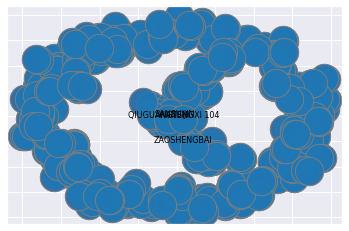

In [117]:
import matplotlib.pyplot as plt
import networkx as nx

pos = nx.spring_layout(G, seed=3113794652)  # positions for all nodes

# nodes
options = {"edgecolors": "tab:gray", "node_size": 800, "alpha": 0.9}
nx.draw_networkx_nodes(G, pos, node_color="tab:red", **options)
nx.draw_networkx_nodes(G, pos, node_color="tab:blue", **options)

# edges
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)


# some math labels
labels = node_dict
nx.draw_networkx_labels(G, pos, labels, font_size=8, font_color="black")

plt.tight_layout()
plt.axis("off")
plt.show()


KeyError: 5

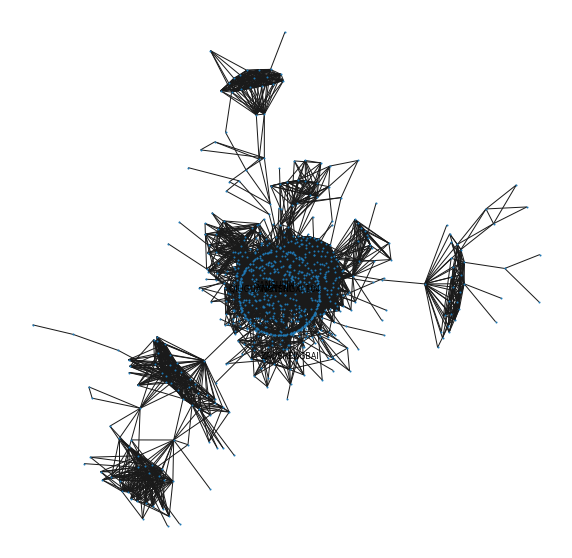

In [118]:
fig, ax = plt.subplots( figsize=(10,10))
subax2 = plt.subplot(111)
nx.draw_kamada_kawai(G,node_size=1)#, with_labels=True,labels=node_dict)
nx.draw_networkx_labels(G, pos, labels, font_size=8, font_color="black")


In [ ]:
df = pd.DataFrame(edges.tolist(),columns=['source','target'])

df.head()

In [ ]:
circular  = circular_layout(nodes, uniform=False)
randomloc = random_layout(nodes)
randomloc.tail()

In [ ]:
cvsopts = dict(plot_height=400, plot_width=400)

def nodesplot(nodes, name=None, canvas=None, cat=None):
    canvas = ds.Canvas(**cvsopts) if canvas is None else canvas
    aggregator=None if cat is None else ds.count_cat(cat)
    agg=canvas.points(nodes,'x','y',aggregator)
    return tf.spread(tf.shade(agg, cmap=["#FF3333"]), px=3, name=name)

tf.Images(nodesplot(randomloc,"Random layout"),
          nodesplot(circular, "Circular layout"))

In [ ]:
forcedirected = forceatlas2_layout(nodes, df)
tf.Images(nodesplot(forcedirected, "ForceAtlas2 layout"))

In [ ]:
def edgesplot(edges, name=None, canvas=None):
    canvas = ds.Canvas(**cvsopts) if canvas is None else canvas
    return tf.shade(canvas.line(edges, 'x','y', agg=ds.count()), name=name)
    
def graphplot(nodes, edges, name="", canvas=None, cat=None):
    if canvas is None:
        xr = nodes.x.min(), nodes.x.max()
        yr = nodes.y.min(), nodes.y.max()
        canvas = ds.Canvas(x_range=xr, y_range=yr, **cvsopts)
        
    np = nodesplot(nodes, name + " nodes", canvas, cat)
    ep = edgesplot(edges, name + " edges", canvas)
    return tf.stack(ep, np, how="over", name=name)

In [ ]:
cd = circular
fd = forcedirected

cd_d = graphplot(cd, connect_edges(cd,df), "Circular layout")
fd_d = graphplot(fd, connect_edges(fd,df), "Force-directed") 
cd_b = graphplot(cd, hammer_bundle(cd,df), "Circular layout, bundled")
fd_b = graphplot(fd, hammer_bundle(fd,df), "Force-directed, bundled") 

tf.Images(cd_d,fd_d,cd_b,fd_b).cols(2)

In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# The graph to visualize

# 3d spring layout
pos = nx.spring_layout(G, dim=3, seed=779)
# Extract node and edge positions from the layout
node_xyz = np.array([pos[v] for v in sorted(G)])
edge_xyz = np.array([(pos[u], pos[v]) for u, v in G.edges()])

# Create the 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")

# Plot the nodes - alpha is scaled by "depth" automatically
ax.scatter(*node_xyz.T, s=100, ec="w")

# Plot the edges
for vizedge in edge_xyz:
    ax.plot(*vizedge.T, color="tab:gray")


def _format_axes(ax):
    """Visualization options for the 3D axes."""
    # Turn gridlines off
    ax.grid(False)
    # Suppress tick labels
    for dim in (ax.xaxis, ax.yaxis, ax.zaxis):
        dim.set_ticks([])
    # Set axes labels
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")


_format_axes(ax)
fig.tight_layout()
plt.show()


In [ ]:
cmdist_linkage = linkage(cmdist, method='single')
cmdist_linkage.shape

In [ ]:
#dendrogram(cmdist_linkage, truncate_mode="level")  

In [ ]:
hierarchgrid = np.ones((30,3027))
for i in range (1,31):
    t_param = i/100
    cmdist_fcluster = fcluster(cmdist_linkage, t=t_param, criterion='distance')
    hierarchgrid[i-1,0:3024] = cmdist_fcluster
    hierarchgrid[i-1,-1] = t_param
    hierarchgrid[i-1,-2] = adjusted_rand_score(metadata.loc[:,'12'], cmdist_fcluster)
    hierarchgrid[i-1,-3] = adjusted_rand_score(metadata.loc[:,'86'], cmdist_fcluster)


    #print('The Clustering Rand Score for values of t=',i/100,'is', hierarchgrid[i-1,-2])

In [ ]:
sns.lineplot(data=hierarchgrid,x=hierarchgrid[:,-1],y=hierarchgrid[:,-2])
sns.lineplot(data=hierarchgrid,x=hierarchgrid[:,-1],y=hierarchgrid[:,-3])

In [ ]:
hierarchgrid = np.ones((100,3027))
for i in range (100,200):
    t_param = i/1000
    cmdist_fcluster = fcluster(cmdist_linkage, t=t_param, criterion='distance')
    hierarchgrid[i-100,0:3024] = cmdist_fcluster
    hierarchgrid[i-100,-1] = t_param
    hierarchgrid[i-100,-2] = adjusted_rand_score(metadata.loc[:,'12'], cmdist_fcluster)
    hierarchgrid[i-100,-3] = adjusted_rand_score(metadata.loc[:,'86'], cmdist_fcluster)


    #print('The Clustering Rand Score for values of t=',i/1000,'is', hierarchgrid[i-100,-2])

In [ ]:
sns.lineplot(data=hierarchgrid,x=hierarchgrid[:,-1],y=hierarchgrid[:,-2])
sns.lineplot(data=hierarchgrid,x=hierarchgrid[:,-1],y=hierarchgrid[:,-3])

In [ ]:
cmdist_linkage = linkage(cmdist, method='average')
cmdist_linkage.shape

In [ ]:
hierarchgrid = np.ones((30,3027))
print(hierarchgrid.shape)
for i in range (1,31):
    t_param = i/100
    cmdist_fcluster = fcluster(cmdist_linkage, t=t_param, criterion='distance')
    hierarchgrid[i-1,0:3024] = cmdist_fcluster
    hierarchgrid[i-1,-1] = t_param
    hierarchgrid[i-1,-2] = adjusted_rand_score(metadata.loc[:,'12'], cmdist_fcluster)
    hierarchgrid[i-1,-3] = adjusted_rand_score(metadata.loc[:,'86'], cmdist_fcluster)


    #print('The Clustering Rand Score for values of t=',i/100,'is', hierarchgrid[i-1,-2])

In [ ]:
sns.lineplot(data=hierarchgrid,x=hierarchgrid[:,-1],y=hierarchgrid[:,-2])
sns.lineplot(data=hierarchgrid,x=hierarchgrid[:,-1],y=hierarchgrid[:,-3])

In [ ]:
hierarchgrid = np.ones((100,3027))
print(hierarchgrid.shape)
start_value = 180
for i in range (start_value,start_value+100):
    t_param = i/1000
    cmdist_fcluster = fcluster(cmdist_linkage, t=t_param, criterion='distance')
    hierarchgrid[i-start_value,0:3024] = cmdist_fcluster
    hierarchgrid[i-start_value,-1] = t_param
    hierarchgrid[i-start_value,-2] = adjusted_rand_score(metadata.loc[:,'12'], cmdist_fcluster)
    hierarchgrid[i-start_value,-3] = adjusted_rand_score(metadata.loc[:,'86'], cmdist_fcluster)


    #print('The Clustering Rand Score for values of t=',i/1000,'is', hierarchgrid[i-start_value,-2])

In [ ]:
sns.lineplot(data=hierarchgrid,x=hierarchgrid[:,-1],y=hierarchgrid[:,-2])
sns.lineplot(data=hierarchgrid,x=hierarchgrid[:,-1],y=hierarchgrid[:,-3])

In [ ]:
max_index = np.argmax(hierarchgrid[:,-2])
print(max_index,'is the index of the max rand score for subpopulation:', hierarchgrid[max_index,-2])
print('t-value for this max index is:', hierarchgrid[max_index,-1])
max_index = np.argmax(hierarchgrid[:,-3])
print(max_index,'is the index of the max rand score for country:', hierarchgrid[max_index,-3])
print('t-value for this max index is:', hierarchgrid[max_index,-1])

In [ ]:
len(np.unique(hierarchgrid[32]))

In [ ]:
#Create another 2-d umap dimensionality reduction embedding to visualize all unsupervised models
umap_model_2d = UMAP(metric='precomputed',min_dist=0.21)
umap_model_2d.fit(mdist)

In [ ]:
plot.points(umap_model_2d)
plt.title('Unlabeled UMAP Embedding in 2D')

In [ ]:
#plt.savefig('Unlabeled UMAP Embedding in 2D',dpi=600)

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(mdist_mds[:,0],mdist_mds[:,1],mdist_mds[:,2],c=metadata.loc[:,'86'])
ax.view_init(azim=0,elev=0)
plt.show()

In [ ]:
plot.points(umap_model_2d,labels=metadata.loc[:,'86'], color_key_cmap='viridis', background='black')
#plt.legend(handles=scatter.legend_elements()[0],bbox_to_anchor=(1,1), labels=list(dict12.keys()))

plt.title('UMAP Embedding colored by given Country')

In [ ]:
plot.points(umap_model_2d,labels=hierarchgrid[32,:3024], color_key_cmap='viridis', background='black')
#plt.legend(handles=scatter.legend_elements()[0],bbox_to_anchor=(1,1), labels=list(dict12.keys()))

plt.title('UMAP Embedding colored by given Hierarchical Clustering')

In [ ]:
np.unique(hierarchgrid[32,:3024], return_counts=True)